# Starting with MM system

In [866]:
# from numpy import*
from pylab import*
import matplotlib.pyplot as plt
import seaborn as sns
from h5py import File
import pandas as pd
from slab.dsfit import*

# from slab import*
import json
import numpy as np
from datetime import datetime
from scipy.optimize import curve_fit
from scipy.signal import argrelextrema
from h5py import File
import os
from slab.dataanalysis import get_next_filename
import math
import scipy.special
from scipy.stats import poisson

# Fit functions

In [1554]:
def coherent_state(n, alpha):
    return np.exp(-abs(alpha)**2)*abs(alpha)**(2*n)/scipy.special.factorial(n)

def line(x, m, b):
    return m*x+b

def proportional(x, m):
    return m * x

def gfromchi(chi,alpha,delta):
    return np.sqrt(chi*delta*(delta+alpha)/alpha)

def storage_t1(t, a, k):
    alpha = alpha_awg_cal(cav_amp=cav_amp, cav_len=cav_len)
    return a*np.exp(-alpha**2*np.exp(-k*t))

def number_splitting(x, y, n=0):
    """Fits an individual Gaussian around each number peak and returns an array
    of the peak values and frequency with error bars.
    'x': in units of χ so please pass it correctly, >0
    'y': qubit excitation probability
    """
    # number of peaks
    num_peaks = int(max(x))
    
    fitdata = {}
    peaks = []
    freqs = []
    peaks_err = []
    freqs_err = []
    
    fig, axs = plt.subplots(1, 1, dpi=300)
    plt.tight_layout()
    axs.set_xlabel(r'$n$', fontsize=20)
    axs.set_ylabel(r'$P_{e}$', fontsize=20)
    axs.grid(True, which='major', axis='both', color='grey', linestyle='--', linewidth=0.4)
    
    for ind in range(num_peaks-n):
#         fitdata['n%.i'%ind] = {}
        """Fits the peak with a Gaussian spanning 1 unit of χ"""
        min_ind, max_ind =  np.argmin(abs(x-ind-0.5)), np.argmin(abs(x-ind+0.5))

        x_domain = x[min_ind:max_ind]
        y_domain = y[min_ind:max_ind]

        axs.plot(x_domain, y_domain, 'ks')

        a = (y_domain[0] + y_domain[-1])/2
        b = (np.max(y_domain) - np.min(y_domain))
        c = x_domain[np.argmax(y_domain)]
        d = (np.max(x_domain) - np.min(x_domain))/10
        p = [a, b, c, d]
        popt, pcov = curve_fit(gauss_baseline, x_domain, y_domain, p0=(a, b, c, d))
        axs.plot(x_domain, gauss_baseline(x_domain, *popt), 'r')
        freqs.append(popt[2])
        freqs_err.append(np.sqrt(np.diag(pcov)[2]))
        peaks.append(popt[1])
        peaks_err.append(np.sqrt(np.diag(pcov)[1]))
        
    fitdata['freq'] = freqs
    fitdata['peak'] = peaks
    fitdata['freq_err'] = freqs_err
    fitdata['peak_err'] = peaks_err

    plt.tick_params(direction='in', length=6, width=2, colors='k', \
        grid_color='grey', grid_alpha=0.5, labelsize=20, labelbottom=True, right=True, top=True, left=True)
    plt.show()
    """Note: Don't forget to scale the returned frequency values with χ """
    return fitdata

def fitcoherentstate(peak_val, peak_val_err=0):
    xdata = np.arange(len(peak_val))
    ydata = np.array(peak_val)
    if peak_val_err:
        ydata_err = np.array(peak_val_err)
        popt, pcov = curve_fit(coherent_state, xdata, ydata, sigma=ydata_err)
    else:
        popt, pcov = curve_fit(coherent_state, xdata, ydata)

    return popt[0], np.sqrt(pcov[0][0])

def expfunc_test(x, a, b, c):
    return b*np.exp(-(x-a)/c)

def expfunc_baseline(x, a, b, c):
    return a*np.exp(-x/b) + c

def decaysin_ramsey(x, a, b, c, d, e, f):
    """p[0]*np.sin(2.*pi*p[1]*x+p[2]*pi/180.)*np.e**(-1.*(x-p[5])/p[3])+p[4]"""
    return a*np.sin(2.*np.pi*b*x+c*np.pi/180.)*np.exp(-1.*(x-f)/d)+e

def gauss(x, mu, sigma, a):
    return a*np.exp(-(x-mu)**2/(2*sigma**2))

def gauss_baseline(x, *p):
    return p[0] + p[1]*np.exp(-(x-p[2])**2/(2*p[3]**2))

def bimodal(x, mu1, sigma1, a1, mu2, sigma2, a2):
    return gauss(x, mu1, sigma1, a1) + gauss(x, mu2, sigma2, a2)

def gaussian2d(x, y, x0, y0, xalpha, yalpha, A):
    return A * np.exp( -((x-x0)/xalpha)**2 -((y-y0)/yalpha)**2)

def hist(filename=None, data=None, plot=True, ran=1.0):
    
    if data == None:
        with File(filename,'r') as a:
            ig = array(a['ig'])
            qg = array(a['qg'])
            ie = array(a['ie'])
            qe = array(a['qe'])
            a.close()
    else:
        ig = data[0]
        qg = data[1]
        ie = data[2]
        qe = data[3]

    numbins = 200
    
    xg, yg = np.median(ig), np.median(qg)
    xe, ye = np.median(ie), np.median(qe)

    if plot==True:
        fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(16, 4))
        fig.tight_layout()

        axs[0].scatter(ig, qg, label='g', color='b', marker='*')
        axs[0].scatter(ie, qe, label='e', color='r', marker='*')
        axs[0].scatter(xg, yg, color='k', marker='o')
        axs[0].scatter(xe, ye, color='k', marker='o')
        axs[0].set_xlabel('I (a.u.)')
        axs[0].set_ylabel('Q (a.u.)')
        axs[0].legend(loc='upper right')
        axs[0].set_title('Unrotated')
        axs[0].axis('equal')
    """Compute the rotation angle"""
    theta = -arctan((ye-yg)/(xe-xg))
    """Rotate the IQ data"""
    ig_new = ig*cos(theta) - qg*sin(theta)
    qg_new = ig*sin(theta) + qg*cos(theta) 
    ie_new = ie*cos(theta) - qe*sin(theta)
    qe_new = ie*sin(theta) + qe*cos(theta)
    
    """New means of each blob"""
    xg, yg = np.median(ig_new), np.median(qg_new)
    xe, ye = np.median(ie_new), np.median(qe_new)

    xlims = [xg-ran, xg+ran]
    ylims = [yg-ran, yg+ran]

    ng, binsg = np.histogram(ig_new, bins=numbins, range = xlims)
    ne, binse = np.histogram(ie_new, bins=numbins, range = xlims)

    """Compute the fidelity using overlap of the histograms"""
    fid = np.abs(((np.cumsum(ng) - np.cumsum(ne)) / (0.5*ng.sum() + 0.5*ne.sum()))).max()

    if plot==True:
        axs[1].scatter(ig_new, qg_new, label='g', color='b', marker='*')
        axs[1].scatter(ie_new, qe_new, label='e', color='r', marker='*')
        axs[1].scatter(xg, yg, color='k', marker='o')
        axs[1].scatter(xe, ye, color='k', marker='o')    
        axs[1].set_xlabel('I (a.u.)')
        axs[1].legend(loc='upper right')
        axs[1].set_title('Rotated')
        axs[1].axis('equal')

        """X and Y ranges for histogram"""
        
        ng, binsg, pg = axs[2].hist(ig_new, bins=numbins, range = xlims, color='b', label='g', alpha=0.5)
        popt, pcov = curve_fit(bimodal, xdata=binsg[:-1], ydata=ng, p0=None)
        mu_g = popt[0]
        axs[2].plot(binsg, bimodal(binsg, *popt), 'k--', linewidth=2 )
        ne, binse, pe = axs[2].hist(ie_new, bins=numbins, range = xlims, color='r', label='e', alpha=0.5)
        popt, pcov = curve_fit(bimodal, xdata=binse[:-1], ydata=ne, p0=None)
        mu_e = popt[3]
        axs[2].plot(binse, bimodal(binse, *popt), 'k--', linewidth=2 )
#         axs[2].text(0.5*(mu_g + mu_e), 0.3*np.max(ne), "$\mu_{g}$ = %.4f \n $\mu_{e}$ = %.4f"%(mu_g, mu_e), fontsize=16)
        axs[2].set_xlabel('I(a.u.)')        
        axs[2].set_title('F = %.3f'%fid)
        fig.show()
        
    return fid, theta

def rot_data(i, q, hist_filename=None):
    
    fid, theta = hist(hist_filename, ran=0.1)
    print(fid, theta)
    """Rotate the IQ data"""
    i_new = i*cos(theta) - q*sin(theta)
    q_new = i*sin(theta) + q*cos(theta) 
    
    return (i_new, q_new)

def ramsfit(tR, n0, phi0, a):
    T2 = 120e-6
    dephase = 1/T2
    detune = 2*np.pi*1e6 
    chi = 2*np.pi*380e3
    kappa = 2*np.pi*(8.0517e9)/8800
    tau = []
    z = []
    res = []
    for i,t in enumerate(tR):
        tau.append((1-np.exp(-complex(kappa*tR[i], 2*chi*tR[i])))/complex(kappa, 2*chi))
        z.append(np.exp(complex(-dephase*tR[i] , phi0 - detune*tR[i] - 2*n0*chi*tau[i])))
        res.append(a*0.5*(1-np.imag(z[i])))
    return np.array(res)

def cav_response_new(p, x):
    """(p[0]/p[1])/(-1/2*p[0]/p[1] - 1j*(x-p[0])"""
    ### p[0]=center freq, p[1]=kappa
    temp = (p[1])/(p[1] - 1j*(x-p[0]))
    return temp/max(abs(temp))

def IF_window(p,x):
    ### p[0] = center freq, p[1] = window width
    temp = zeros(len(x)) + 1j*zeros(len(x))
    for ii in range(len(x)):
        if x[ii]>(p[0]-p[1]) and x[ii]<(p[0]+p[1]):
            temp[ii] = 1/sqrt(2)*(1+1j)
        else:
            pass
    return temp/max(abs(temp))

def erf_t(A, sig, tc, tb, t):
    #A-Amplitude, sig-Gaussian Filter Width, tc-Core Pulse length, tb - zero-amplitude buffer length
    return (A/2)*(sc.special.erf((t-tb)/(sqrt(2)*sig))-sc.special.erf((t-tc-tb)/(sqrt(2)*sig)))

# Resonator spectropscopy

fits =  [1.37004595e-07 8.13781331e-05 7.79017587e+00 4.11060581e-04]
fits =  [1.36094964e-07 8.04099968e-05 7.79016959e+00 4.11538891e-04]


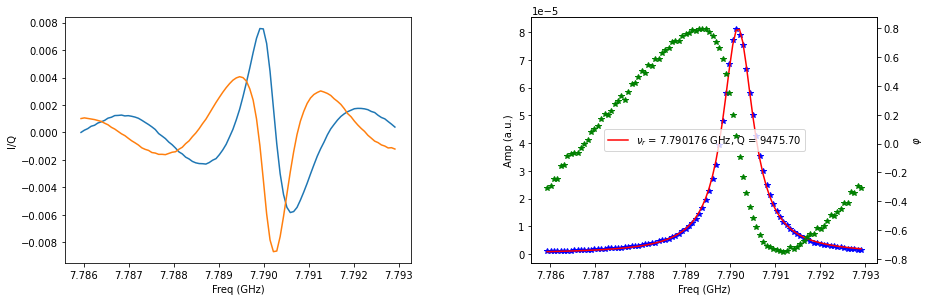

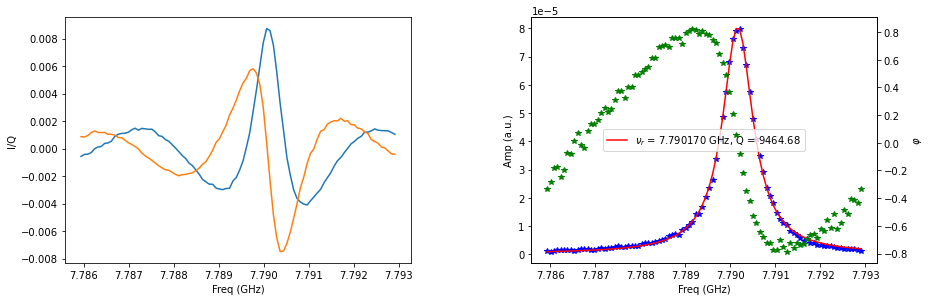

In [3]:
expt_name = 'resonator_spec_sq'
filelist = [3, 4]
#3 - amp(0.5)
#4 - 8us long readout

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        x = array(a['freqs'])/1e9
        a.close()
        
    fig, axs = plt.subplots(1, 2, figsize=(12, 4))
    fig.tight_layout()
    fig.subplots_adjust(wspace=0.35)
    axs[0].plot(x, I)
    axs[0].plot(x, Q)
    axs[0].set_xlabel('Freq (GHz)')
    axs[0].set_ylabel('I/Q')

    amps = Q**2 + I**2
    ph = np.arctan2(np.array(Q), np.array(I))
    ph = np.unwrap(ph, discont=3.141592653589793, axis=-1)
    m = (ph[-1]-ph[0])/(x[-1] - x[0])
    ph = ph - m*x
    ph = ph -np.mean(ph)
    axs[1].plot(x, amps, 'b*')
    p = fitlor(x, amps, showfit=False)
    q = p[2]/(2*p[3])
    axs[1].plot(x, lorfunc(p, x), label=r'$\nu_{r}$ = %.6f GHz, Q = %.2f'% (p[2], q), color='r')
    print ("fits = ", p)
    ax2  = axs[1].twinx()
    ax2.plot(x, ph, 'g*')
    axs[1].set_xlabel('Freq (GHz)')
    axs[1].set_ylabel('Amp (a.u.)')
    ax2.set_ylabel('$\\varphi$')
    axs[1].legend(loc='center')

In [83]:
x[np.argmax(amps)]

7.790092189951427

In [11]:
2*p[3]*1e3*np.pi

2.585775113504871

## Optimal shape

fits =  [-6.67441472e-08  1.05940799e-04  7.79016586e+00  3.99991240e-04]
fits =  [-1.40310314e-07  1.12985833e-04  7.79016423e+00  3.99262018e-04]


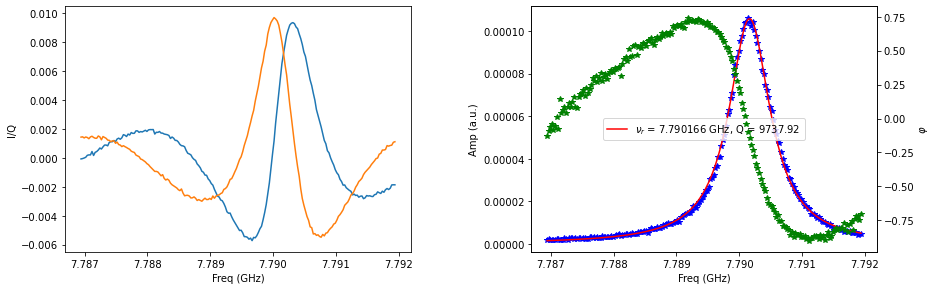

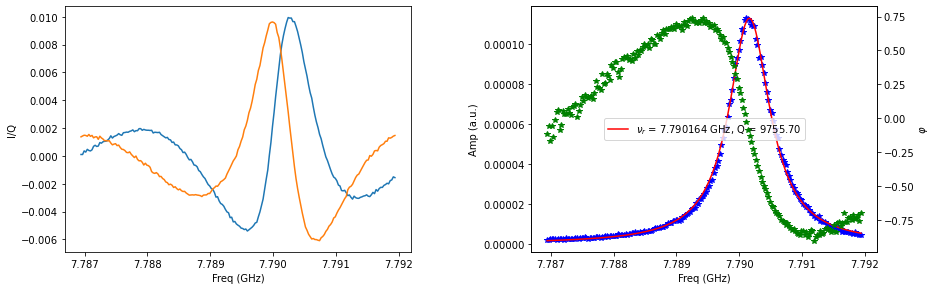

In [95]:
expt_name = 'resonator_spec_opt'
filelist = [7, 8]
#3 - amp(0.5)
#4 - 8us long readout

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        x = array(a['freqs'])/1e9
        a.close()
        
    fig, axs = plt.subplots(1, 2, figsize=(12, 4))
    fig.tight_layout()
    fig.subplots_adjust(wspace=0.35)
    axs[0].plot(x, I)
    axs[0].plot(x, Q)
    axs[0].set_xlabel('Freq (GHz)')
    axs[0].set_ylabel('I/Q')

    amps = Q**2 + I**2
    ph = np.arctan2(np.array(Q), np.array(I))
    ph = np.unwrap(ph, discont=3.141592653589793, axis=-1)
    m = (ph[-1]-ph[0])/(x[-1] - x[0])
    ph = ph - m*x*0.95
    ph = ph -np.mean(ph)
    axs[1].plot(x, amps, 'b*')
    p = fitlor(x, amps, showfit=False)
    q = p[2]/(2*p[3])
    axs[1].plot(x, lorfunc(p, x), label=r'$\nu_{r}$ = %.6f GHz, Q = %.2f'% (p[2], q), color='r')
    print ("fits = ", p)
    ax2  = axs[1].twinx()
    ax2.plot(x, ph, 'g*')
    axs[1].set_xlabel('Freq (GHz)')
    axs[1].set_ylabel('Amp (a.u.)')
    ax2.set_ylabel('$\\varphi$')
    axs[1].legend(loc='center')

## JPA

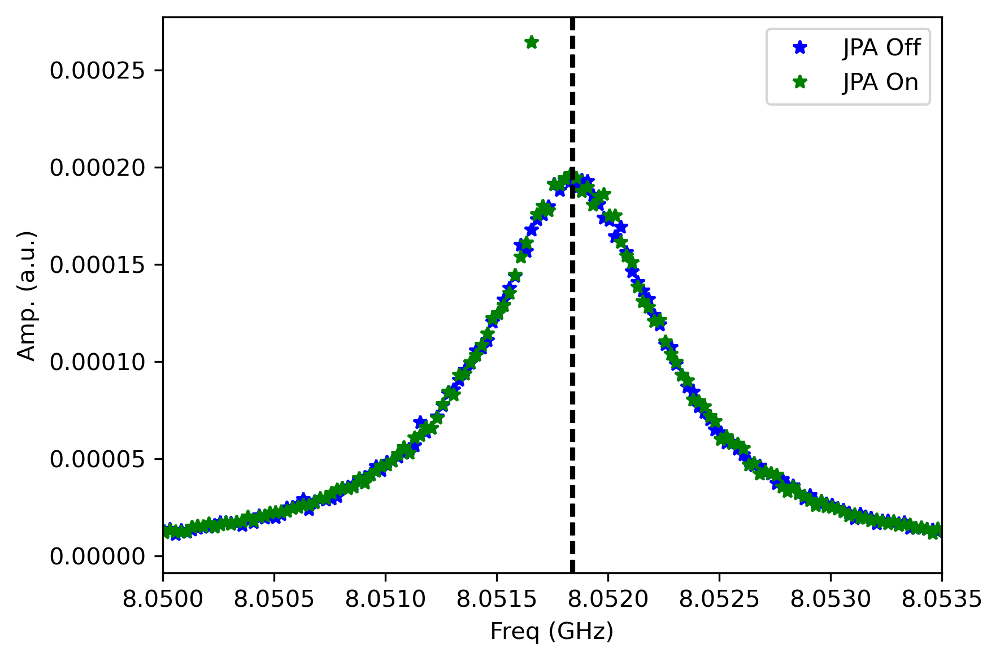

In [5]:
expt_name = 'resonator_jpa'
filelist = [0]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        ig = np.array(a['Ig']) 
        qg = np.array(a['Qg']) 
        ie = np.array(a['Ie']) 
        qe = np.array(a['Qe']) 
        freq = np.array(a["freqs"]) 
        a.close()

    amps_g = (ig**2 + qg**2)
    amps_e = (ie**2 + qe**2)
    f = np.array(freq/1e9)

    fig, ax1 = plt.subplots(1, 1, dpi=300)
    ax1.plot(f, amps_g, 'b*', label='JPA Off')
    ax1.plot(f, amps_e, 'g*', label='JPA On')
    ax1.set_xlim(8.05, 8.0535)
    pg = fitlor(f, amps_g, showfit=False)
#     ax1.plot(f, lorfunc(pg, f), 'r')
    plt.axvline(x=pg[2], color='k', linestyle='--')
    pe = fitlor(f, amps_e, showfit=False)
#     ax1.plot(f, lorfunc(pe, f), 'r')
    plt.axvline(x=pe[2], color='k', linestyle='--')
    chi = (pg[2]-pe[2])*1e6
#     plt.text(np.mean(f), np.max(amps_e)*0.5, '2χ = %.3f kHz'%chi)
    plt.legend(loc='best')
    plt.xlabel('Freq (GHz)')
    plt.ylabel('Amp. (a.u.)')
#     plt.ylim(0, 25e-5)
    fig.tight_layout()
#     plt.savefig('../plots/readout_chi.png', dpi=300)
    plt.show()

## Storage alpha

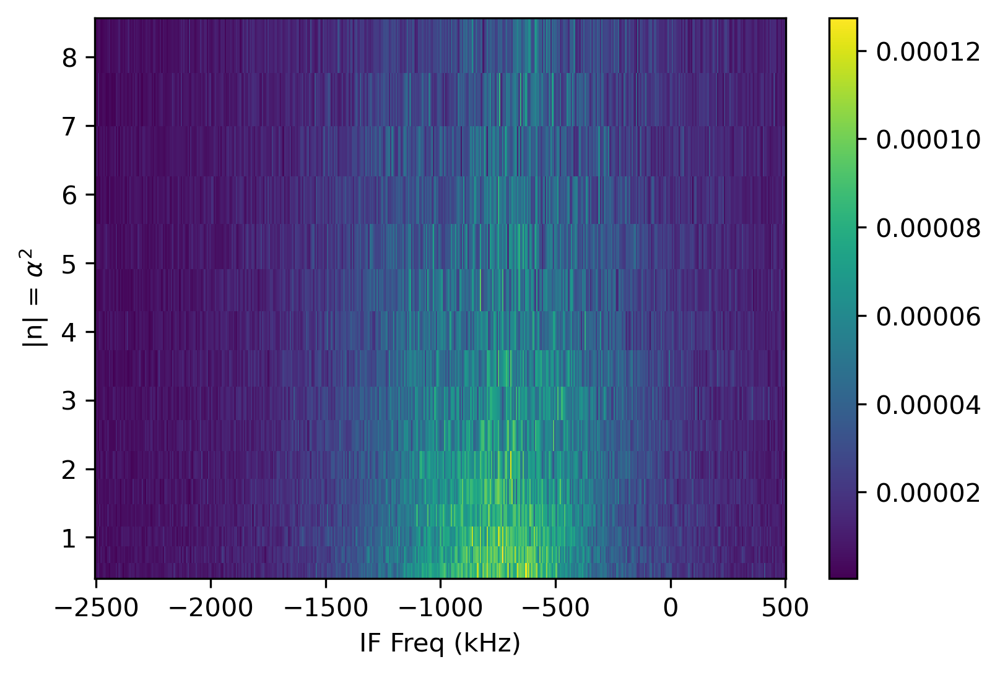

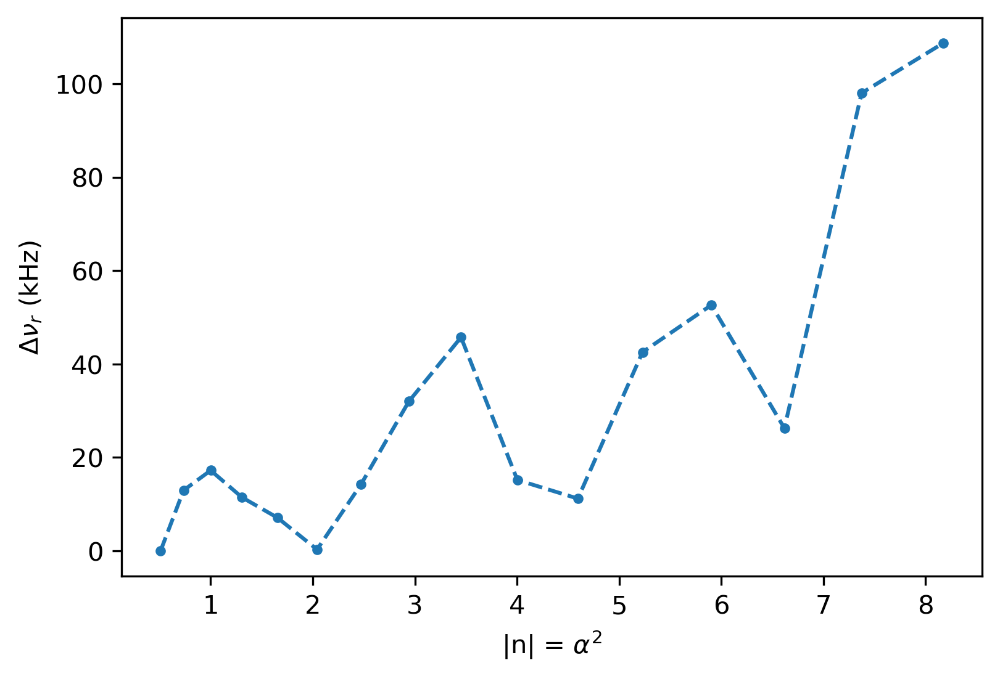

In [144]:
expt_name = 'resonator_spec_opt_alpha'
filelist = [3]
#3 - amp(0.5)
#4 - 8us long readout

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        x = array(a['freqs'])/1e3
        y = array(a['len'])
        a.close()

def alpha_awg_cal(cav_amp=1.0, cav_len=250):
    # takes input array of amps and length and converts them to output array of alphas,
    # using a calibration h5 file defined in the experiment config
    # pull calibration data from file, handling properly in case of multimode cavity
    cal_path = 'C:\_Lib\python\slab\experiments\qm_opx_mm\drive_calibration'

    fn_file = cal_path + '\\00000_2021_12_16_cavity_square_mode_2.h5'

    with File(fn_file, 'r') as f:
        omegas = np.array(f['omegas'])
        amps = np.array(f['amps'])

    # assume zero frequency at zero amplitude, used for interpolation function
    omegas = np.append(omegas, 0.0)
    amps = np.append(amps, 0.0)

    o_s = omegas
    a_s = amps

    # interpolate data, transfer_fn is a function that for each amp returns the corresponding omega
    transfer_fn = scipy.interpolate.interp1d(a_s, o_s)

    omega_desired = transfer_fn(cav_amp)
    alpha = omega_desired * cav_len

    """Returns alpha in the cavity"""
    return alpha

alpha = alpha_awg_cal(cav_amp=1.0, cav_len=y)

plt.figure(dpi=300)
plt.pcolormesh(x, alpha**2, I**2 + Q**2, shading='auto')
plt.colorbar()
plt.xlabel('IF Freq (kHz)')
plt.ylabel('|n| = $α^{2}$')
plt.show()

amps = I**2 + Q**2
f_res = []
for ii in range(len(I)):
    p = fitlor(x, amps[ii], showfit=False)
    f_res.append(p[2])
f_res = f_res - f_res[0]
plt.figure(dpi=300)
plt.plot(alpha**2, f_res, '.--')
plt.xlabel('|n| = $α^{2}$')
plt.ylabel(r'$\Delta \nu_{r}$ (kHz)')
plt.show()

fits =  [-2.16183339e-06  9.74723888e-05 -7.62535707e+02  4.64510315e+02]


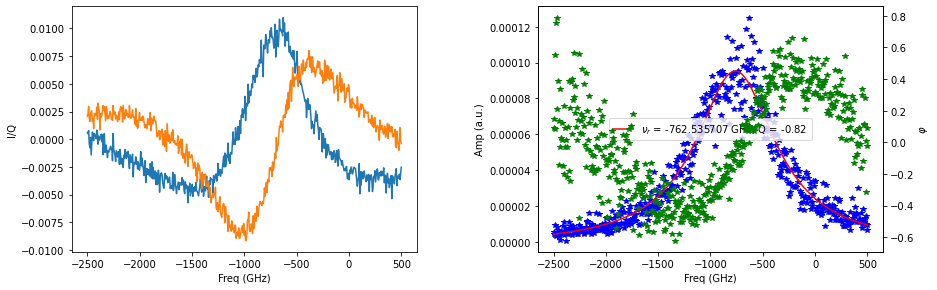

In [142]:
t = 0
fig, axs = plt.subplots(1, 2, figsize=(12, 4))
fig.tight_layout()
fig.subplots_adjust(wspace=0.35)
axs[0].plot(x, I[t])
axs[0].plot(x, Q[t])
axs[0].set_xlabel('Freq (GHz)')
axs[0].set_ylabel('I/Q')

amps = Q[t]**2 + I[t]**2
ph = np.arctan2(np.array(Q[t]), np.array(I[t]))
ph = np.unwrap(ph, discont=3.141592653589793, axis=-1)
m = (ph[-1]-ph[0])/(x[-1] - x[0])
ph = ph - m*x
ph = ph -np.mean(ph)
axs[1].plot(x, amps, 'b*')
p = fitlor(x, amps, showfit=False)
q = p[2]/(2*p[3])
axs[1].plot(x, lorfunc(p, x), label=r'$\nu_{r}$ = %.6f GHz, Q = %.2f'% (p[2], q), color='r')
print ("fits = ", p)
ax2  = axs[1].twinx()
ax2.plot(x, ph, 'g*')
axs[1].set_xlabel('Freq (GHz)')
axs[1].set_ylabel('Amp (a.u.)')
ax2.set_ylabel('$\\varphi$')
axs[1].legend(loc='center')

# Resonator chi

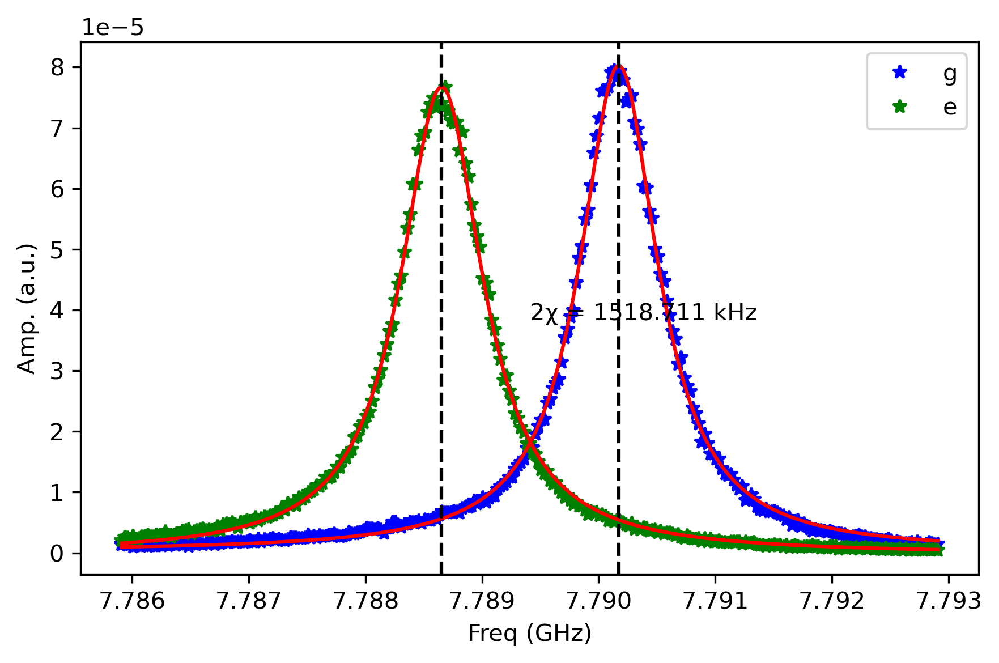

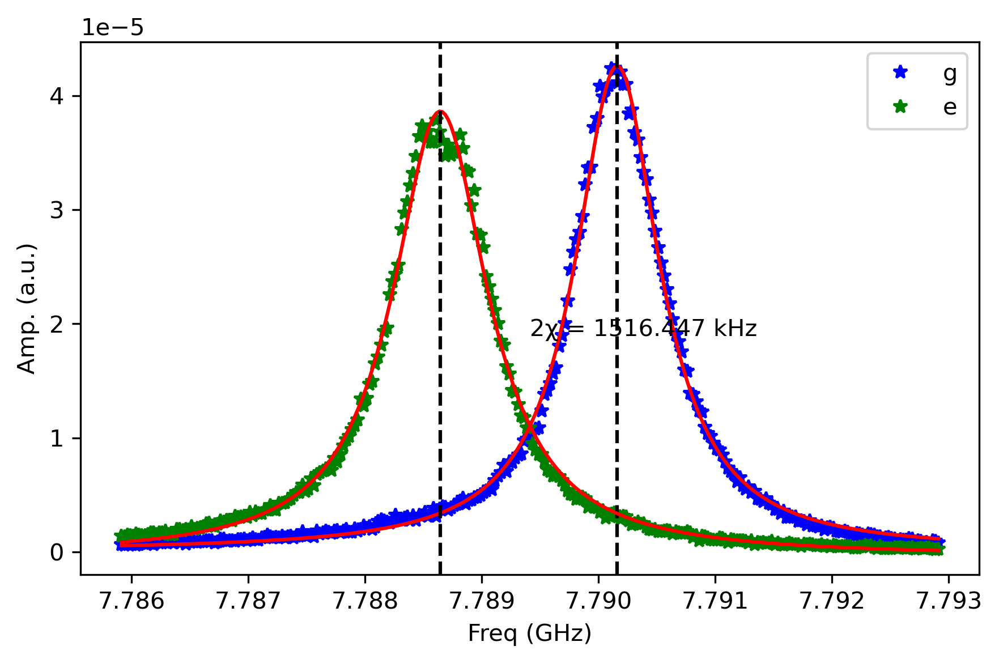

In [1283]:
expt_name = 'resonator_chi'
filelist = [13, 14]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        ig = np.array(a['Ig']) 
        qg = np.array(a['Qg']) 
        ie = np.array(a['Ie']) 
        qe = np.array(a['Qe']) 
        freq = np.array(a["freqs"]) 
        a.close()

    amps_g = (ig**2 + qg**2)
    amps_e = (ie**2 + qe**2)
    f = np.array(freq/1e9)

    fig, ax1 = plt.subplots(1, 1, dpi=300)
    ax1.plot(f, amps_g, 'b*', label='g')
    ax1.plot(f, amps_e, 'g*', label='e')
    pg = fitlor(f, amps_g, showfit=False)
    ax1.plot(f, lorfunc(pg, f), 'r')
    plt.axvline(x=pg[2], color='k', linestyle='--')
    pe = fitlor(f, amps_e, showfit=False)
    ax1.plot(f, lorfunc(pe, f), 'r')
    plt.axvline(x=pe[2], color='k', linestyle='--')
    chi = (pg[2]-pe[2])*1e6
    plt.text(np.mean(f), np.max(amps_e)*0.5, '2χ = %.3f kHz'%chi)
    plt.legend(loc='best')
    plt.xlabel('Freq (GHz)')
    plt.ylabel('Amp. (a.u.)')
    fig.tight_layout()
#     plt.savefig('../plots/readout_chi.png', dpi=300)
    plt.show()

In [1284]:
0.5*(pg[2]+ pe[2])

7.789402047040442

In [262]:
pe[2]

7.7886747985315035

## Optimal pulse

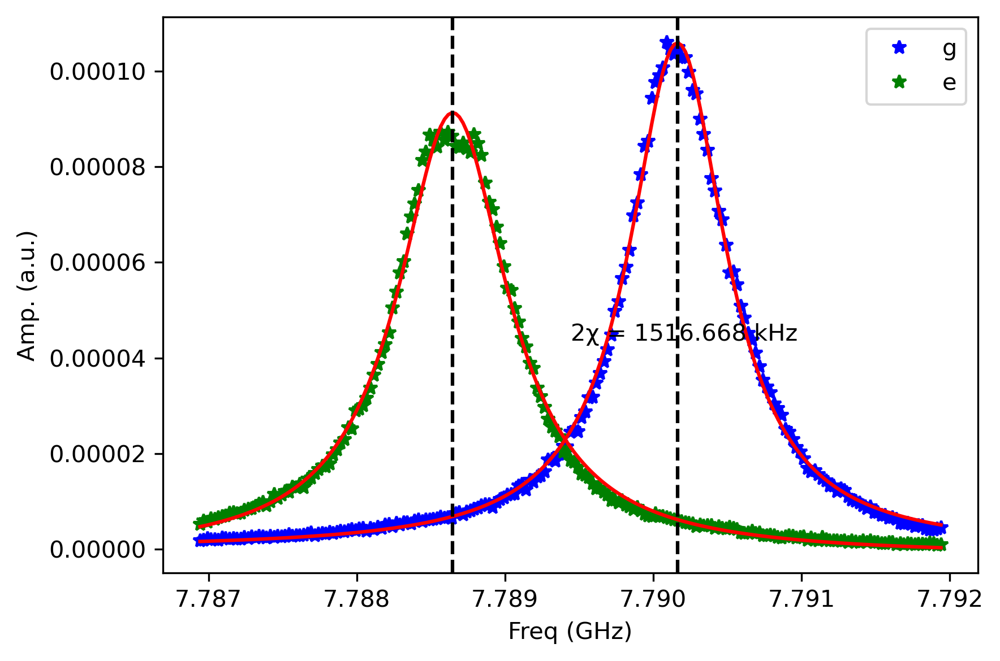

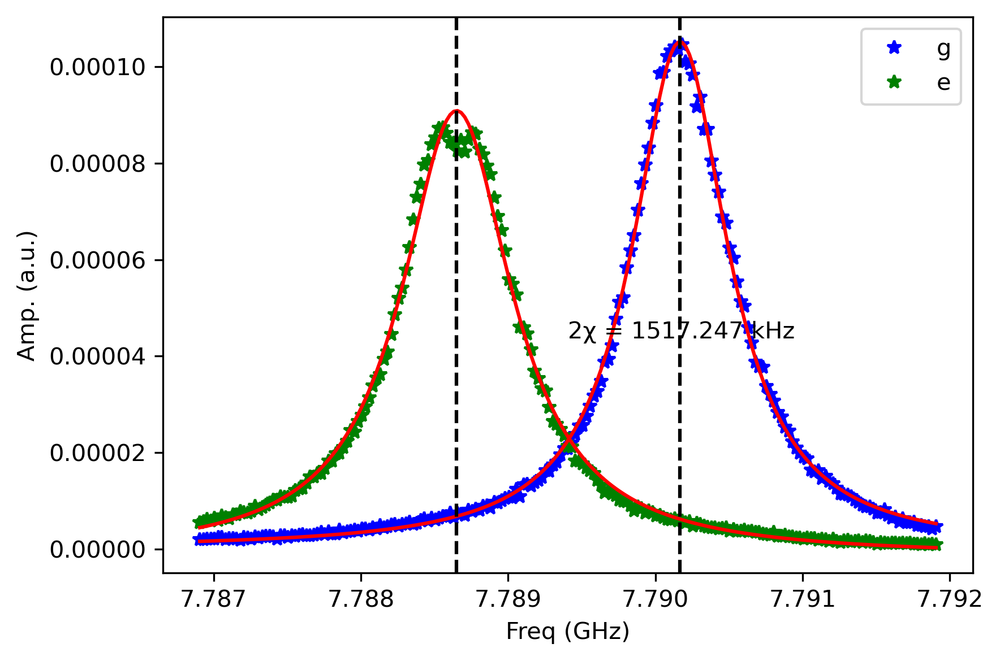

In [91]:
expt_name = 'resonator_chi_opt'
filelist = [1, 2]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        ig = np.array(a['Ig']) 
        qg = np.array(a['Qg']) 
        ie = np.array(a['Ie']) 
        qe = np.array(a['Qe']) 
        freq = np.array(a["freqs"]) 
        a.close()

    amps_g = (ig**2 + qg**2)
    amps_e = (ie**2 + qe**2)
    f = np.array(freq/1e9)

    fig, ax1 = plt.subplots(1, 1, dpi=300)
    ax1.plot(f, amps_g, 'b*', label='g')
    ax1.plot(f, amps_e, 'g*', label='e')
#     ax1.set_xlim(8.05, 8.0535)
    pg = fitlor(f, amps_g, showfit=False)
    ax1.plot(f, lorfunc(pg, f), 'r')
    plt.axvline(x=pg[2], color='k', linestyle='--')
    pe = fitlor(f, amps_e, showfit=False)
    ax1.plot(f, lorfunc(pe, f), 'r')
    plt.axvline(x=pe[2], color='k', linestyle='--')
    chi = (pg[2]-pe[2])*1e6
    plt.text(np.mean(f), np.max(amps_e)*0.5, '2χ = %.3f kHz'%chi)
    plt.legend(loc='best')
    plt.xlabel('Freq (GHz)')
    plt.ylabel('Amp. (a.u.)')
    fig.tight_layout()
#     plt.savefig('../plots/readout_chi.png', dpi=300)
    plt.show()

In [92]:
0.5*(pg[2]+ pe[2])

7.789409118927988

# Qubit Spectroscopy

fits =  [-3.29798139e-02  1.30023879e-02  4.96139010e+00  8.92054582e-06]
fits =  [-7.51155848e-03  6.81292990e-04  4.96138489e+00  5.29264123e-05]


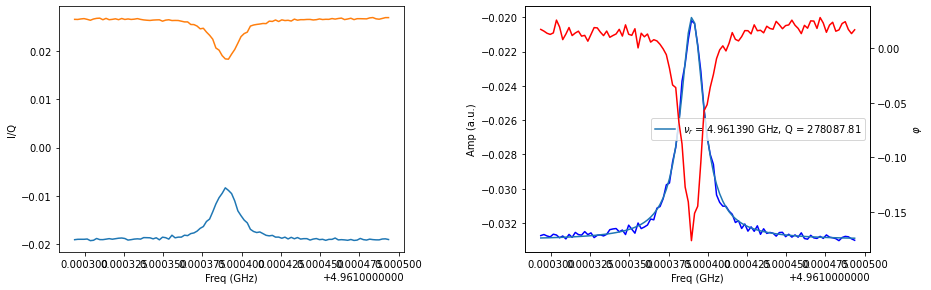

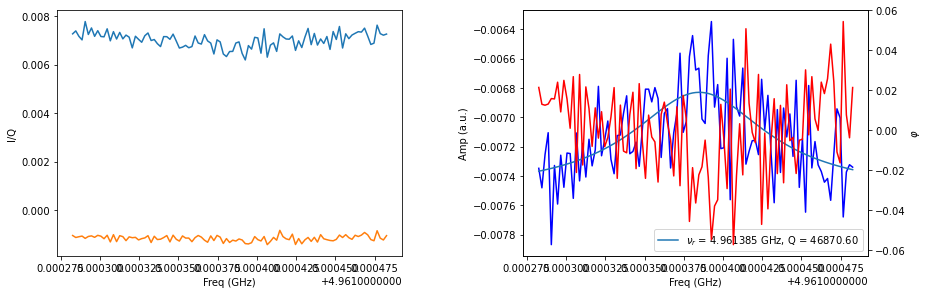

In [76]:
expt_name = 'ge_spectroscopy'
filelist = [1, 2]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        x = array(a['freqs'])/1e9
        a.close()
        
    fig, axs = plt.subplots(1, 2, figsize=(12, 4))
    fig.tight_layout()
    fig.subplots_adjust(wspace=0.35)
    axs[0].plot(x, I)
    axs[0].plot(x, Q)
    axs[0].set_xlabel('Freq (GHz)')
    axs[0].set_ylabel('I/Q')
    amps = -np.sqrt(np.array(I)**2 + 1*np.array(Q)**2)
#     amps = Q
    ph = np.arctan2(np.array(Q), np.array(I))
    ph = np.unwrap(ph, discont=3.141592653589793, axis=-1)
    m = (ph[-1]-ph[0])/(x[-1] - x[0])
    ph = ph - m*x*0.95
    ph = ph -np.mean(ph)
    axs[1].plot(x, amps, 'b-')
    p = fitlor(x, amps, showfit=False)
    q = p[2]/(2*p[3])
    axs[1].plot(x, lorfunc(p, x), label=r'$\nu_{r}$ = %.6f GHz, Q = %.2f'% (p[2], q))
    print ("fits = ", p)
    ax2  = axs[1].twinx()
    ax2.plot(x, ph, 'r-')
    axs[1].set_xlabel('Freq (GHz)')
    axs[1].set_ylabel('Amp (a.u.)')
    ax2.set_ylabel('$\\varphi$')
    axs[1].legend(loc='best')

## ef spectroscopy

fits =  [-1.10580532e-02  1.55508104e-03  4.60762007e+00  4.39600940e-03]
fits =  [-1.10592281e-02  1.44679495e-03  4.60351587e+00  2.75248568e-03]


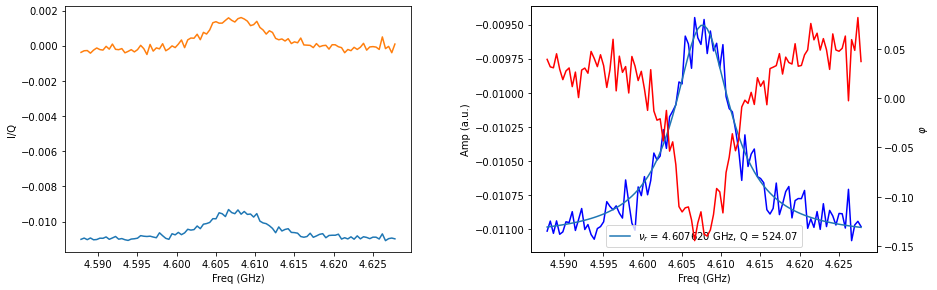

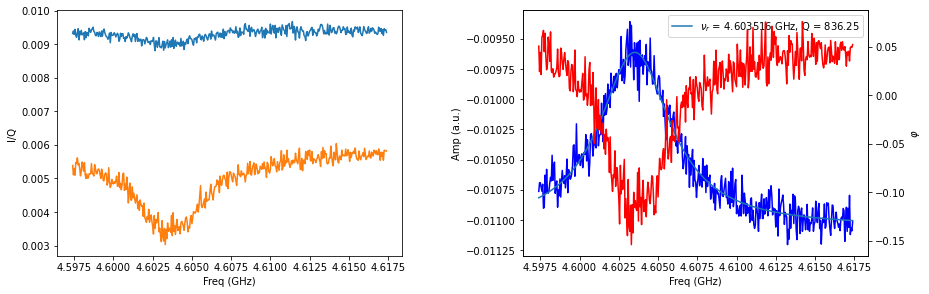

In [102]:
expt_name = 'ef_spectroscopy'
filelist = [0, 9]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        x = array(a['freqs'])/1e9
        a.close()
        
    fig, axs = plt.subplots(1, 2, figsize=(12, 4))
    fig.tight_layout()
    fig.subplots_adjust(wspace=0.35)
    axs[0].plot(x, I)
    axs[0].plot(x, Q)
    axs[0].set_xlabel('Freq (GHz)')
    axs[0].set_ylabel('I/Q')
    amps = -np.sqrt(np.array(I)**2 + 1*np.array(Q)**2)
#     amps = Q
    ph = np.arctan2(np.array(Q), np.array(I))
    ph = np.unwrap(ph, discont=3.141592653589793, axis=-1)
    m = (ph[-1]-ph[0])/(x[-1] - x[0])
    ph = ph - m*x*0.95
    ph = ph -np.mean(ph)
    axs[1].plot(x, amps, 'b-')
    p = fitlor(x, amps, showfit=False)
    q = p[2]/(2*p[3])
    axs[1].plot(x, lorfunc(p, x), label=r'$\nu_{r}$ = %.6f GHz, Q = %.2f'% (p[2], q))
    print ("fits = ", p)
    ax2  = axs[1].twinx()
    ax2.plot(x, ph, 'r-')
    axs[1].set_xlabel('Freq (GHz)')
    axs[1].set_ylabel('Amp (a.u.)')
    ax2.set_ylabel('$\\varphi$')
    axs[1].legend(loc='best')

# Power Rabi

Suggested π amp = 0.3061
Suggested π/2 amp = 0.1523
0.926 0.044


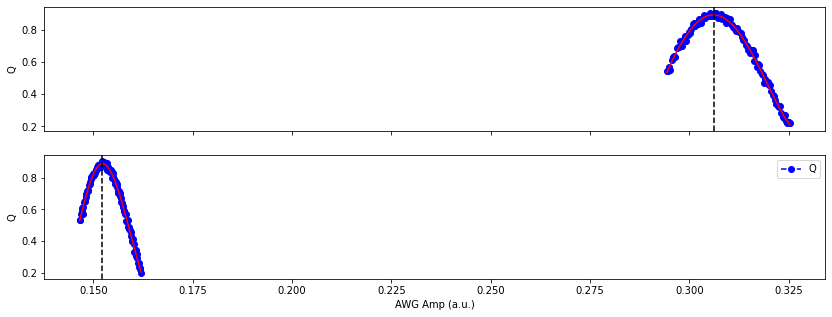

In [1635]:
expt_name = 'power_rabi'
filelist = [176]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I_pi = array(a['I_pi'])
        x_pi = array(a['amps_pi'])
        I_pi_2 = array(a['I_pi_2'])
        x_pi_2 = array(a['amps_pi_2'])
        
        fig, axs = plt.subplots(nrows=2, ncols=1, sharex=True, figsize=(14,5))

        y = I_pi[:]
        x = x_pi[:]
        
        z = np.polyfit(x, y, 5)
        p = np.poly1d(z)
        axs[0].plot(x, y, 'bo--',label = 'Q')
        axs[0].plot(x, p(x), 'r')
        pi_amp = x[np.argmax(p(x))]
        print("Suggested π amp = %.4f" %(pi_amp))
        axs[0].axvline(pi_amp, color='k', linestyle='--')
        axs[0].set_ylabel('Q')

        y = I_pi_2[:]
        x = x_pi_2[:]
        
        z = np.polyfit(x, y, 5)
        p = np.poly1d(z)
        axs[1].plot(x, y, 'bo--',label = 'Q')
        axs[1].plot(x, p(x), 'r')
        
        pi_2_amp = x[np.argmax(abs(p(x)))]
        print("Suggested π/2 amp = %.4f" %(pi_2_amp))
        axs[1].axvline(pi_2_amp, color='k', linestyle='--')
            
        axs[1].set_xlabel('AWG Amp (a.u.)')
        axs[1].set_ylabel('Q')
        axs[1].legend()
        
        print(max(Q), Q[0])

Suggested π amp = 0.2596
0.889 0.0095
Suggested π amp = 0.6868
0.89 0.038


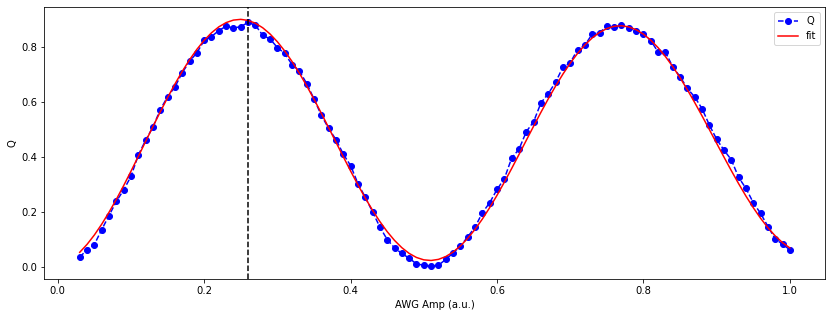

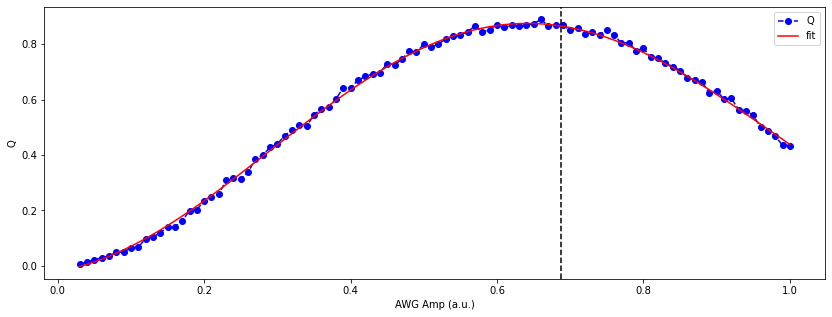

In [154]:
expt_name = 'power_rabi'
filelist = [45, 46]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        x = array(a['amps'])
        
        fig, ax = plt.subplots(1, 1, figsize=(14,5))

        y = Q[3:]
        x = x[3:]
        p = fitdecaysin(x[:], y[:],fitparams = None, showfit=False)
        ax.plot(x, y, 'bo--',label = 'Q')
        ax.plot(x[:], decaysin(np.append(p, 0), x[:]), 'r-', label=r'fit')
        print("Suggested π amp = %.4f" %(1/2/p[1]))
        ax.axvline(1/2/p[1], color='k', linestyle='--')
        ax.set_xlabel('AWG Amp (a.u.)')
        ax.set_ylabel('Q')
        ax.legend()
        
        print(max(Q), Q[0])

## ge DRAG

Suggested π amp = 0.5897
Suggested π/2 amp = 0.2860
0.9695 0.006


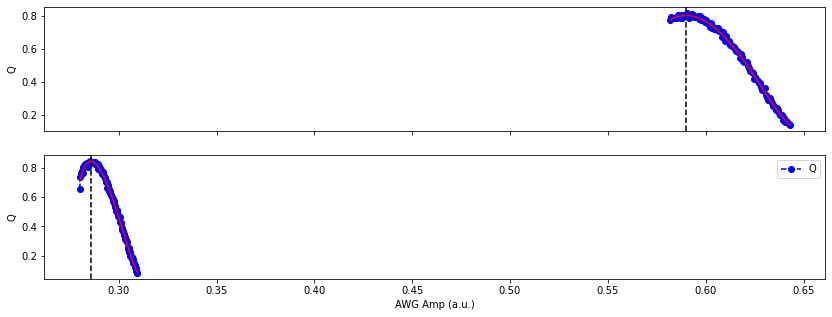

In [34]:
expt_name = 'power_rabi_drag'
filelist = [9]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I_pi = array(a['I_pi'])
        x_pi = array(a['amps_pi'])
        I_pi_2 = array(a['I_pi_2'])
        x_pi_2 = array(a['amps_pi_2'])
        
        fig, axs = plt.subplots(nrows=2, ncols=1, sharex=True, figsize=(14,5))

        y = I_pi[:]
        x = x_pi[:]
        
        z = np.polyfit(x, y, 5)
        p = np.poly1d(z)
        axs[0].plot(x, y, 'bo--',label = 'Q')
        axs[0].plot(x, p(x), 'r')
        pi_amp = x[np.argmax(p(x))]
        print("Suggested π amp = %.4f" %(pi_amp))
        axs[0].axvline(pi_amp, color='k', linestyle='--')
        axs[0].set_ylabel('Q')

        
        y = I_pi_2[:]
        x = x_pi_2[:]
        
        z = np.polyfit(x, y, 5)
        p = np.poly1d(z)
        axs[1].plot(x, y, 'bo--',label = 'Q')
        axs[1].plot(x, p(x), 'r')
        
        pi_2_amp = x[np.argmax(abs(p(x)))]
        print("Suggested π/2 amp = %.4f" %(pi_2_amp))
        axs[1].axvline(pi_2_amp, color='k', linestyle='--')
            
        axs[1].set_xlabel('AWG Amp (a.u.)')
        axs[1].set_ylabel('Q')
        axs[1].legend()
        
        print(max(Q), Q[0])

Suggested π amp = 0.6046
0.966 0.0035
Suggested π amp = 0.5956
0.9695 0.006


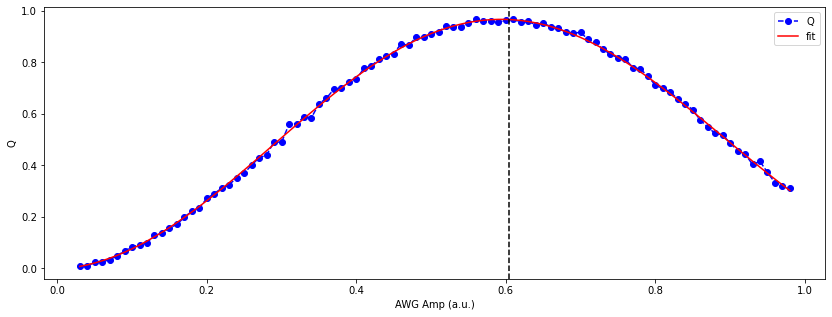

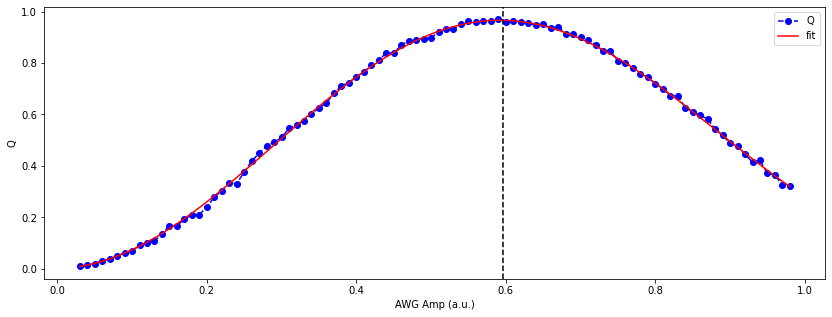

In [26]:
expt_name = 'power_rabi_drag'
filelist = [0, 1]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        x = array(a['amps'])
        
        fig, ax = plt.subplots(1, 1, figsize=(14,5))

        y = Q[3:-2]
        x = x[3:-2]
        p = fitdecaysin(x[:], y[:],fitparams = None, showfit=False)
        ax.plot(x, y, 'bo--',label = 'Q')
        ax.plot(x[:], decaysin(np.append(p, 0), x[:]), 'r-', label=r'fit')
        print("Suggested π amp = %.4f" %(1/2/p[1]))
        ax.axvline(1/2/p[1], color='k', linestyle='--')
        ax.set_xlabel('AWG Amp (a.u.)')
        ax.set_ylabel('Q')
        ax.legend()
        
        print(max(Q), Q[0])

Suggested π amp = 0.6385
Suggested π/2 amp = 0.3138
0.836 0.836


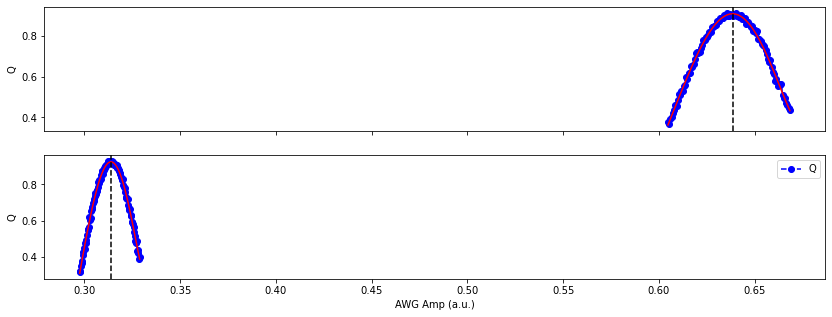

In [346]:
expt_name = 'power_rabi'
filelist = [117]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I_pi = array(a['I_pi'])
        x_pi = array(a['amps_pi'])
        I_pi_2 = array(a['I_pi_2'])
        x_pi_2 = array(a['amps_pi_2'])
        
        fig, axs = plt.subplots(nrows=2, ncols=1, sharex=True, figsize=(14,5))

        y = I_pi[:]
        x = x_pi[:]
        
        z = np.polyfit(x, y, 5)
        p = np.poly1d(z)
        axs[0].plot(x, y, 'bo--',label = 'Q')
        axs[0].plot(x, p(x), 'r')
        pi_amp = x[np.argmax(p(x))]
        print("Suggested π amp = %.4f" %(pi_amp))
        axs[0].axvline(pi_amp, color='k', linestyle='--')
        axs[0].set_ylabel('Q')

        
        y = I_pi_2[:]
        x = x_pi_2[:]
        
        z = np.polyfit(x, y, 5)
        p = np.poly1d(z)
        axs[1].plot(x, y, 'bo--',label = 'Q')
        axs[1].plot(x, p(x), 'r')
        
        pi_2_amp = x[np.argmax(abs(p(x)))]
        print("Suggested π/2 amp = %.4f" %(pi_2_amp))
        axs[1].axvline(pi_2_amp, color='k', linestyle='--')
            
        axs[1].set_xlabel('AWG Amp (a.u.)')
        axs[1].set_ylabel('Q')
        axs[1].legend()
        
        print(max(Q), Q[0])

In [136]:
popt

array([-0.11992989,  0.68150477, -0.43397339,  0.07206661])

## ef Power Rabi

Suggested π amp = 0.0799
0.526 0.023


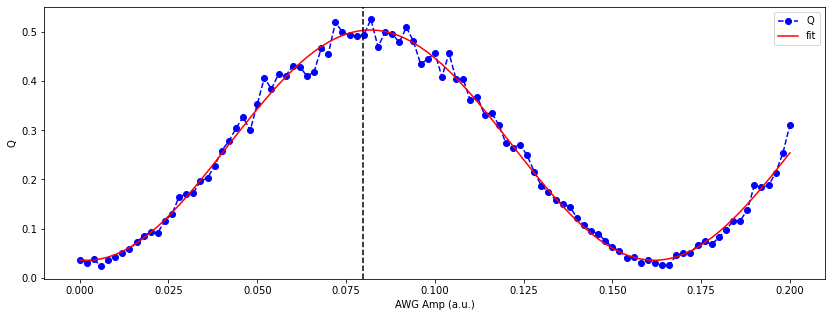

In [52]:
expt_name = 'ef_power_rabi'
filelist = [0]
freq = []
t2 = []

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        x = array(a['amps'])
        
        fig, ax = plt.subplots(1, 1, figsize=(14,5))

        y = Q
        p = fitdecaysin(x[:], y[:],fitparams = None, showfit=False)
        ax.plot(x, y, 'bo--',label = 'Q')
        ax.plot(x[:], decaysin(np.append(p, 0), x[:]), 'r-', label=r'fit')
        print("Suggested π amp = %.4f" %(1/2/p[1]))
        ax.axvline(1/2/p[1], color='k', linestyle='--')
        ax.set_xlabel('AWG Amp (a.u.)')
        ax.set_ylabel('Q')
        ax.legend()
        print(max(Q), min(Q))

## ge Weak Rabi

Suggested π amp = 0.0081
0.9135 0.016


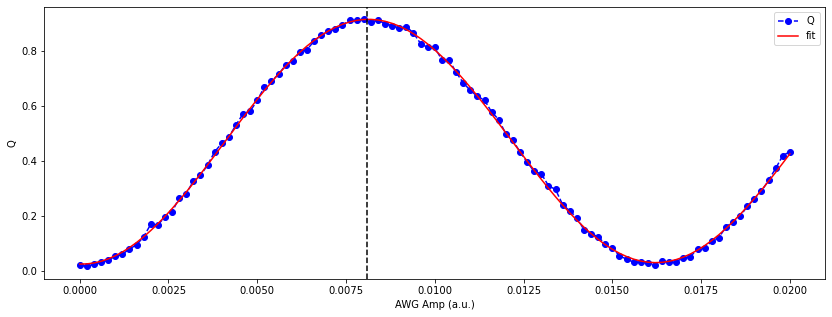

In [737]:
expt_name = 'weak_rabi'
filelist = [10]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        x = array(a['amps'])
        
        fig, ax = plt.subplots(1, 1, figsize=(14,5))

        y = Q[:]
        x = x[:]
        p = fitdecaysin(x[:], y[:],fitparams = None, showfit=False)
        ax.plot(x, y, 'bo--',label = 'Q')
        ax.plot(x[:], decaysin(np.append(p, 0), x[:]), 'r-', label=r'fit')
        print("Suggested π amp = %.4f" %(1/2/p[1]))
        ax.axvline(1/2/p[1], color='k', linestyle='--')
        ax.set_xlabel('AWG Amp (a.u.)')
        ax.set_ylabel('Q')
        ax.legend()
        print(max(Q), min(Q))

Suggested π amp = 0.0081


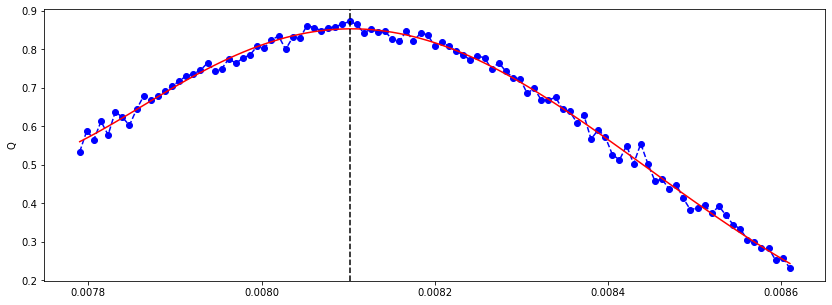

In [1691]:
expt_name = 'weak_rabi'
filelist = [16]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        x = array(a['amps'])
        
        fig, axs = plt.subplots(nrows=1, ncols=1, sharex=True, figsize=(14,5))

        y = Q[:]
        x = x[:]
        
        z = np.polyfit(x, y, 5)
        p = np.poly1d(z)
        axs.plot(x, y, 'bo--',label = 'Q')
        axs.plot(x, p(x), 'r')
        pi_amp = x[np.argmax(p(x))]
        print("Suggested π amp = %.4f" %(pi_amp))
        axs.axvline(pi_amp, color='k', linestyle='--')
        axs.set_ylabel('Q')


## ge weak Rabi in the presence of a photon in the storage

Suggested π amp = 0.0050
0.8906752411576 0.0192926045016


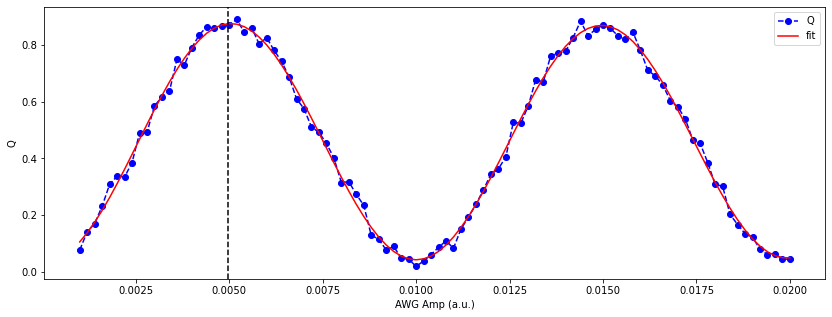

In [30]:
expt_name = 'weak_rabi_storage'
filelist = [0]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        x = array(a['amps'])
        
        fig, ax = plt.subplots(1, 1, figsize=(14,5))

        y = Q[5:]
        x = x[5:]
        p = fitdecaysin(x[:], y[:],fitparams = None, showfit=False)
        ax.plot(x, y, 'bo--',label = 'Q')
        ax.plot(x[:], decaysin(np.append(p, 0), x[:]), 'r-', label=r'fit')
        print("Suggested π amp = %.4f" %(1/2/p[1]))
        ax.axvline(1/2/p[1], color='k', linestyle='--')
        ax.set_xlabel('AWG Amp (a.u.)')
        ax.set_ylabel('Q')
        ax.legend()
        print(max(Q), min(Q))

## Storage alpha resolved

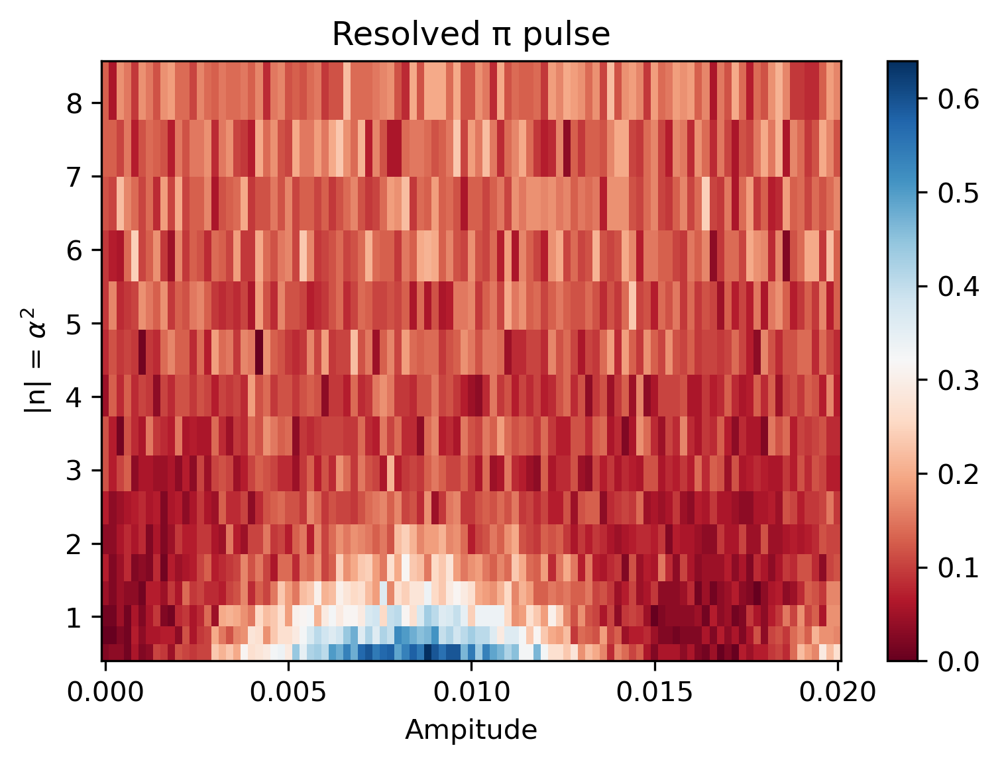

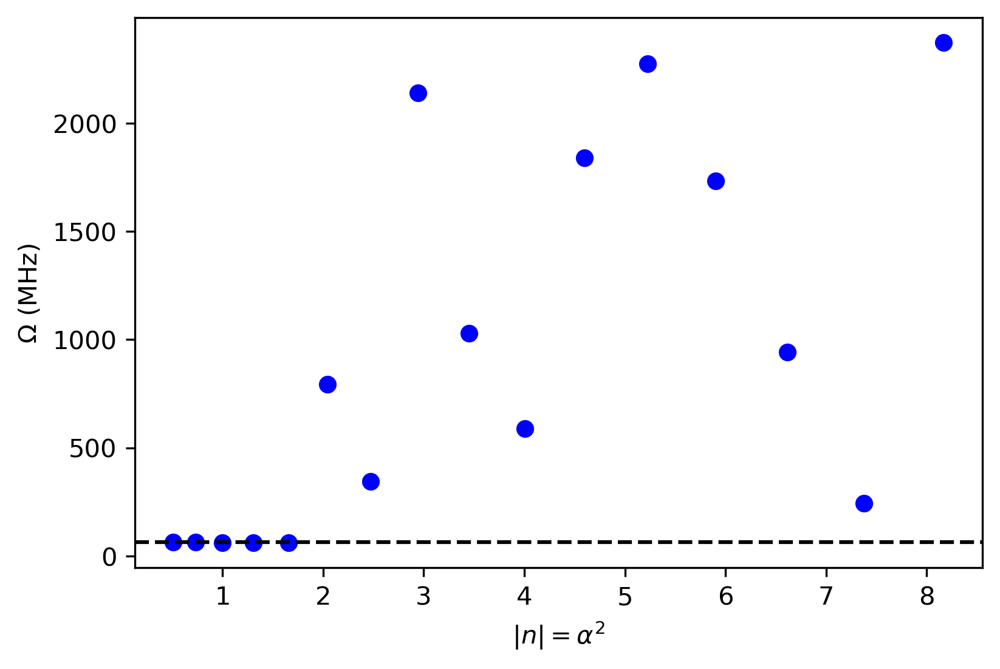

In [190]:
def rabi_freq(x, y):
    popt = fitdecaysin(x, y,fitparams = None, showfit=False)
    return popt[1]

expt_name = 'power_rabi_res_alpha'
filelist = [0]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        x = array(a['amps'])
        y = array(a['len'])

alpha = alpha_awg_cal(cav_amp=1.0, cav_len=y)
plt.figure(dpi=300)
plt.title('Resolved π pulse')

plt.pcolormesh(x, alpha**2, Q, shading='auto', cmap='RdBu')
plt.colorbar()
plt.xlabel('Ampitude')
plt.ylabel('|n| = $α^{2}$')
plt.show()

fig, ax = plt.subplots(1, 1, dpi=300)

df = pd.DataFrame(Q)
rabi = df.apply(lambda row: rabi_freq(x, row), axis=1)

ax.plot(alphas**2, rabi, 'bo')
ax.axhline(rabi[0], color='k', linestyle='--')
ax.set_ylabel(r'$\mathrm{\Omega}$ (MHz)')
ax.set_xlabel(r'$|n| = \alpha^{2}$')
plt.show()

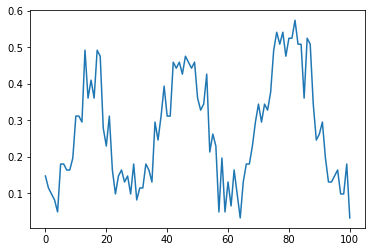

In [166]:
plt.plot(df.iloc[9])

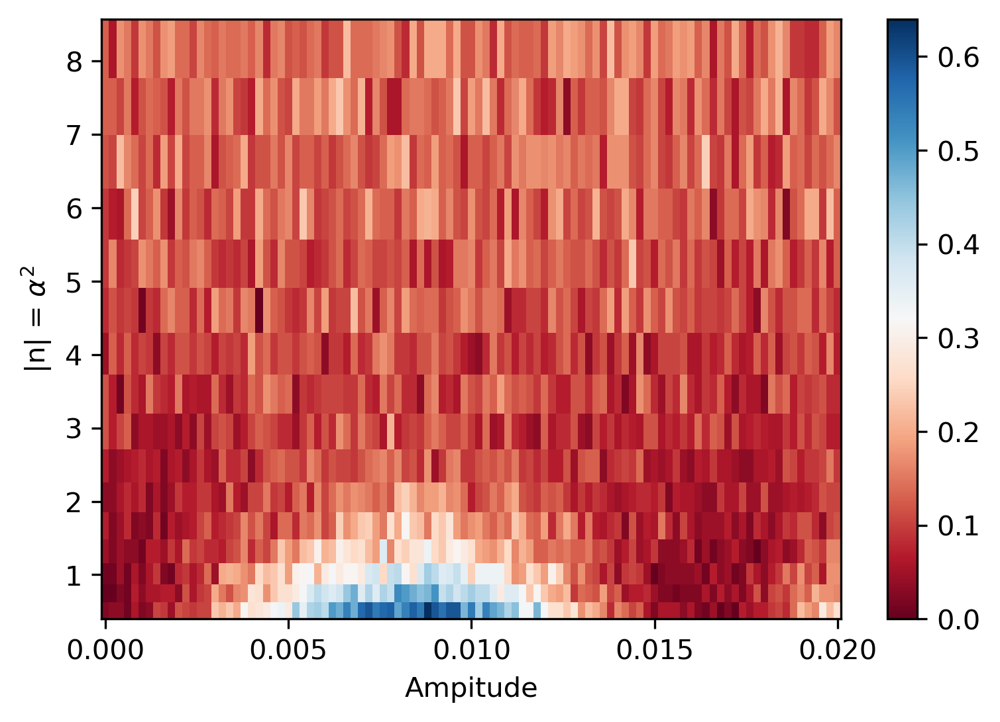

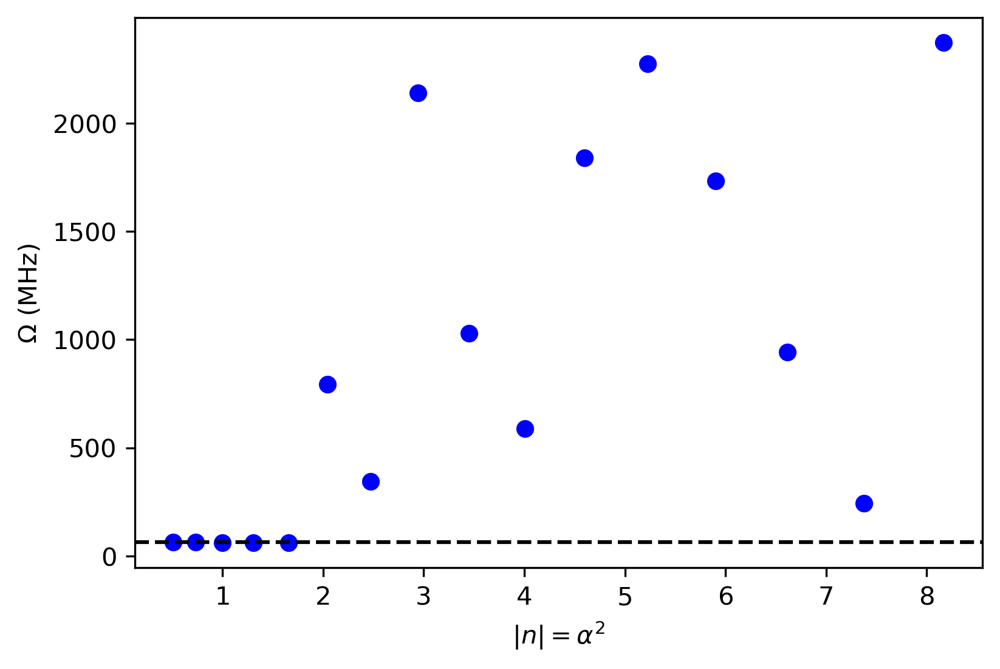

In [174]:
def rabi_freq(x, y):
    popt = fitdecaysin(x, y,fitparams = None, showfit=False)
    return popt[1]

expt_name = 'power_rabi_res_alpha'
filelist = [0]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        x = array(a['amps'])
        y = array(a['len'])

alpha = alpha_awg_cal(cav_amp=1.0, cav_len=y)
plt.figure(dpi=300)
plt.pcolormesh(x, alpha**2, Q, shading='auto', cmap='RdBu')
plt.colorbar()
plt.xlabel('Ampitude')
plt.ylabel('|n| = $α^{2}$')
plt.show()

fig, ax = plt.subplots(1, 1, dpi=300)

df = pd.DataFrame(Q)
rabi = df.apply(lambda row: rabi_freq(x, row), axis=1)

ax.plot(alphas**2, rabi, 'bo')
ax.axhline(rabi[0], color='k', linestyle='--')
ax.set_ylabel(r'$\mathrm{\Omega}$ (MHz)')
ax.set_xlabel(r'$|n| = \alpha^{2}$')
plt.show()

# Time Rabi

# T1

T1: 133.430 μs
0.9510000000000001 0.042


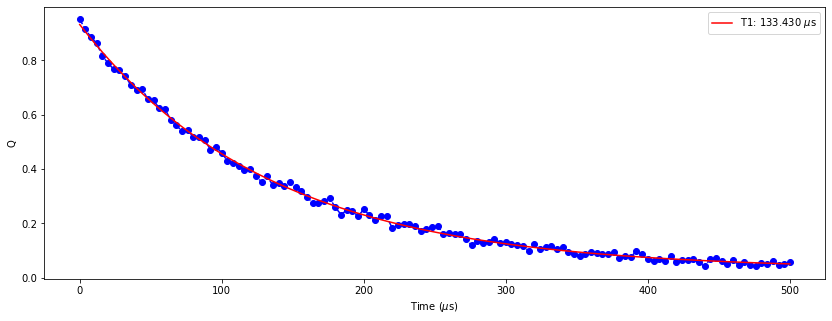

In [1636]:
expt_name = 'ge_t1'
filelist = [23]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        x = array(a['time'])
        
        fig, ax = plt.subplots(1, 1, figsize=(14,5))

        y = Q
        p = fitexp(x, y, showfit=False)
        print("T1: %.3f μs"%(p[3]))
        ax.plot(x, y, 'bo--')
        ax.plot(x[:], expfunc(p, x[:]), 'r-', label='T1: %.3f $\mu$s'%(p[3]))
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('Q')
        ax.legend()
        print(max(Q), min(Q))

0.9590000000000001 0.089


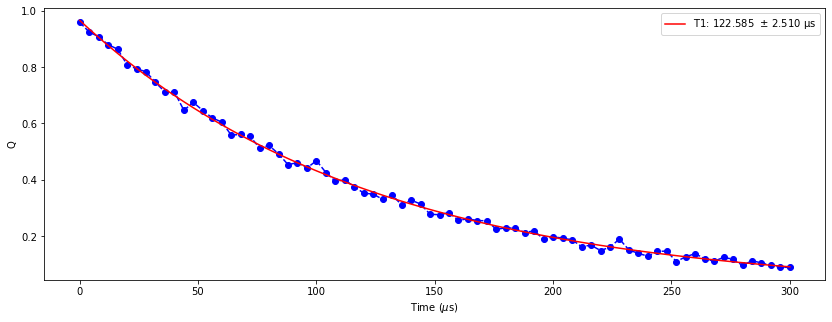

In [151]:
expt_name = 't1'
filelist = [69]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['res'])
        x = array(a['time'])/1e3
        
        fig, ax = plt.subplots(1, 1, figsize=(14,5))

        y = Q        
        popt, pcov = curve_fit(expfunc_baseline, x, y)
        ax.plot(x, y, 'bo--')
        ax.plot(x, expfunc_baseline(x, *popt), 'r-', label=r"T1: %.3f  $\pm$ %.3f μs"%(popt[1], np.sqrt(np.diag(pcov)[1])))
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('Q')
        ax.legend()
        print(max(Q), min(Q))

## ef T1

T1: 39.512 μs
-0.0007094229273 -0.0008076912202


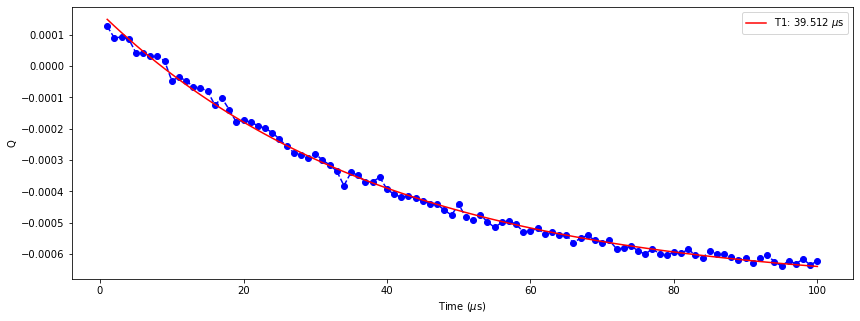

In [150]:
expt_name = 'ef_t1'
filelist = [1]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        x = array(a['times'])/1e3
        
        fig, ax = plt.subplots(1, 1, figsize=(14,5))

        y = I
        p = fitexp(x, y, showfit=False)
        print("T1: %.3f μs"%(p[3]))
        ax.plot(x, y, 'bo--')
        ax.plot(x[:], expfunc(p, x[:]), 'r-', label='T1: %.3f $\mu$s'%(p[3]))
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('Q')
        ax.legend()


## Storage T1

[7.75712207e-01 1.41966943e+03 1.34198037e-02]
[6.85585628e-01 6.93578211e+02 1.49021679e-02]
[6.57982069e-01 5.12237809e+02 1.51327731e-02]
[5.62523075e-01 3.95490862e+02 1.32343845e-02]


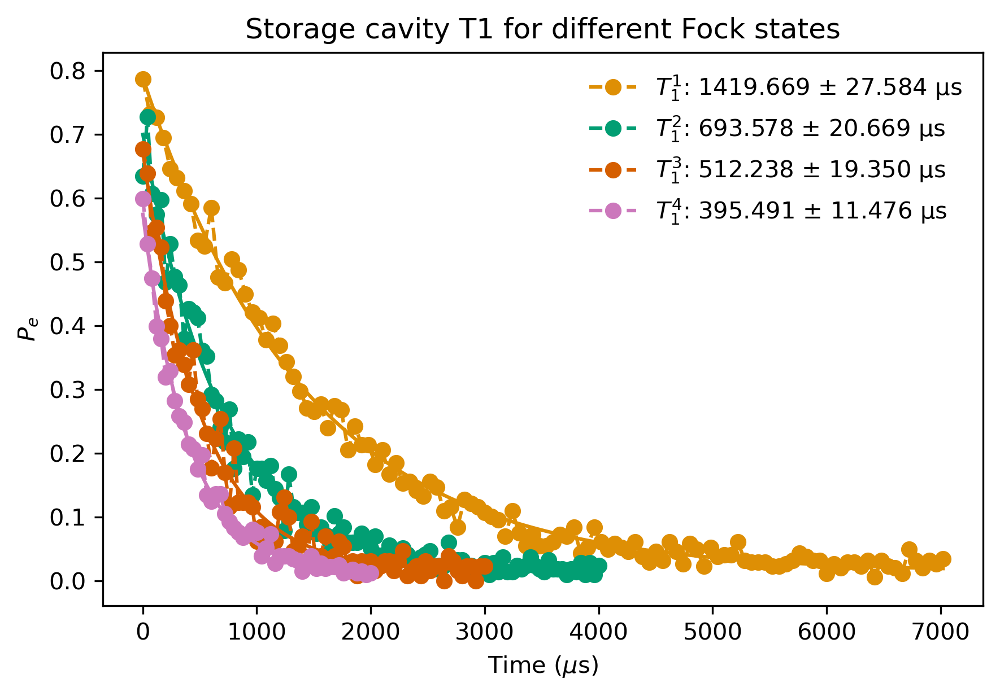

In [580]:
expt_name = 'storage_t1'
filelist = [21, 25, 23, 27]
fig, ax = plt.subplots(1, 1, dpi=300)
colors = sns.color_palette('colorblind')

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['res'])
        x = array(a['time'])/1e3
        
        y = Q

        popt, pcov = curve_fit(expfunc_baseline, x, y, p0=(1, 1000, 0))
        print(popt)
        ax.plot(x, y, 'o--', color=colors[ii+1], label=r"$T_{1}^{%.f}$: %.3f $\pm$ %.3f μs"%(ii+1,popt[1], np.sqrt(np.diag(pcov)[1])))
        ax.plot(x, expfunc_baseline(x, *popt), color=colors[ii+1])
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel(r'$P_{e}$')
        ax.legend(frameon=False)

fig.tight_layout()
plt.title('Storage cavity T1 for different Fock states')
plt.show()


[7.74636647e-01 1.45876393e+03 1.33827257e-02]
[7.16621954e-01 7.07716456e+02 1.91199107e-02]
[6.83322369e-01 5.17324006e+02 1.32137557e-02]
[5.50231532e-01 4.10536739e+02 1.10694601e-02]
[3.26568437e-01 3.07079030e+02 1.70047960e-02]


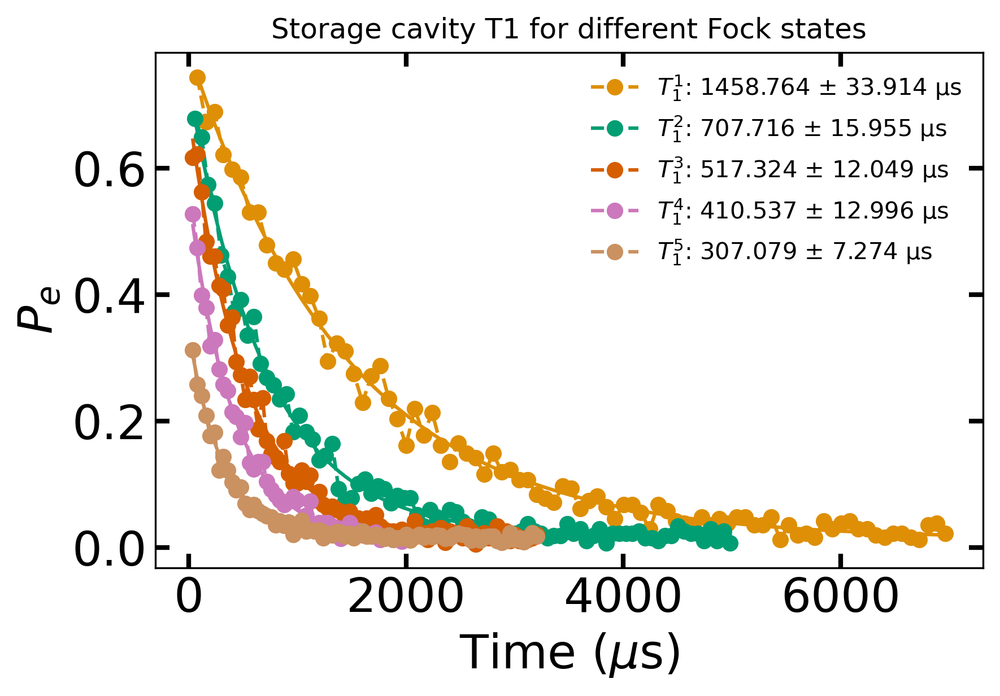

In [833]:
expt_name = 'storage_t1'
filelist = [31, 33, 35, 27, 37]
fig, ax = plt.subplots(1, 1, dpi=300)
colors = sns.color_palette('colorblind')

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['res'])
        x = array(a['time'][1:])/1e3
        
        y = Q[1:]

        popt, pcov = curve_fit(expfunc_baseline, x, y, p0=(1, 1000, 0))
        print(popt)
        ax.plot(x, y, 'o--', color=colors[ii+1], label=r"$T_{1}^{%.f}$: %.3f $\pm$ %.3f μs"%(ii+1,popt[1], np.sqrt(np.diag(pcov)[1])))
        ax.plot(x, expfunc_baseline(x, *popt), color=colors[ii+1])
        ax.legend(frameon=False)
ax.set_xlabel('Time ($\mu$s)', fontsize=20)
ax.set_ylabel(r'$P_{e}$', fontsize=20)
plt.tick_params(direction='in', length=6, width=2, colors='k', \
    grid_color='grey', grid_alpha=0.5, labelsize=20, labelbottom=True, right=True, top=True, left=True)

fig.tight_layout()
plt.title('Storage cavity T1 for different Fock states')
plt.show()


[7.79000033e-01 1.51241355e+03 3.67501774e-03]
[7.16269610e-01 6.96041075e+02 2.24496784e-02]
[6.85065461e-01 5.34586843e+02 6.38659811e-03]
[5.40541874e-01 3.75759603e+02 2.95650386e-02]
[3.26613418e-01 2.92640283e+02 2.12498709e-02]


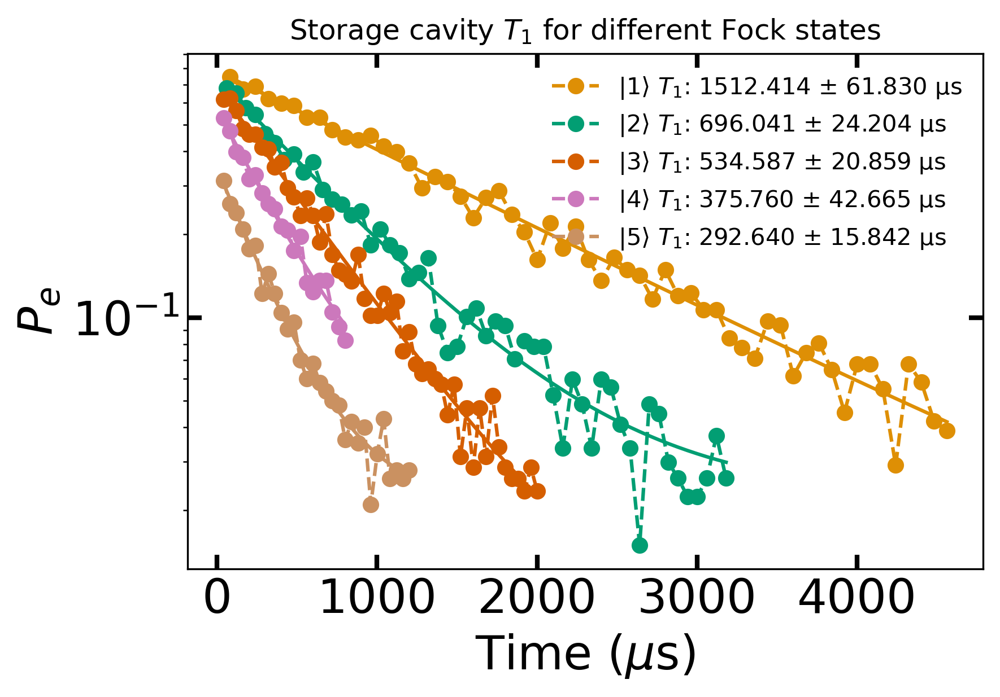

In [582]:
expt_name = 'storage_t1'
filelist = [31, 33, 35, 27, 37]
fig, ax = plt.subplots(1, 1, dpi=300)
colors = sns.color_palette('colorblind')

cav_t1s = []
cav_t1s_err = []
for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"
    if ii<4:
        h=30
    else:
        h=50
        

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['res'])
        x = array(a['time'])[1:-h]/1e3
        y = Q[1:-h]
        popt, pcov = curve_fit(expfunc_baseline, x, y, p0=(1, 1000, 0))
        t1, t1_err = popt[1], np.sqrt(np.diag(pcov)[1])
        print(popt)

        ax.plot(x, y, 'o--', color=colors[ii+1], label=r"$\left| {%.f} \right\rangle$ $T_{1}$: %.3f $\pm$ %.3f μs"%(ii+1,t1, t1_err))
        ax.plot(x, expfunc_baseline(x, *popt), color=colors[ii+1])
        cav_t1s.append(t1)
        cav_t1s_err.append(t1_err)

ax.set_xlabel('Time ($\mu$s)', fontsize=20)
ax.set_ylabel(r'$P_{e}$', fontsize=20)
ax.legend(frameon=False)
ax.set_yscale('log')
plt.tick_params(direction='in', length=6, width=2, colors='k', \
    grid_color='grey', grid_alpha=0.5, labelsize=20, labelbottom=True, right=True, top=True, left=True)
fig.tight_layout()
plt.title('Storage cavity $T_{1}$ for different Fock states')
plt.show()


In [557]:
1444/527

2.740037950664137

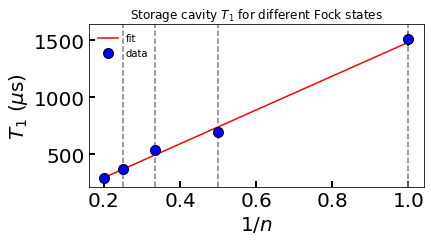

In [851]:
def fock_t1(x, a):
    return a*x
x = 1/np.arange(1, 6, 1)
y = np.array(cav_t1s)
y_err = np.array(cav_t1s_err)


popt, pcov = curve_fit(fock_t1, x, y, sigma=y_err)

plt.figure(figsize=(6, 3))
plt.errorbar(x, y=y, yerr=y_err, fmt='o', markersize=10, 
                      color='k', markerfacecolor='b', label='data')
# plt.plot(np.arange(1, 6, 1), cav_t1s[0]/np.arange(1, 6, 1), 'r')
plt.plot(x, fock_t1(x, *popt), 'r', label='fit')
plt.ylabel(r'$T_{1}$ ($\mu$s)', fontsize=20)
plt.xlabel(r'$1/n$', fontsize=20)
for ii in range(1, 5, 1):
    plt.axvline(x=1/ii, linestyle='--', color='grey')
# plt.xlabel(r'$\left| n \right\rangle$', fontsize=20)

plt.legend(frameon=False, loc='upper left')
plt.tick_params(direction='in', length=6, width=2, colors='k', \
    grid_color='grey', grid_alpha=0.5, labelsize=20, labelbottom=True, right=False, top=False, left=True)
fig.tight_layout()
plt.title('Storage cavity $T_{1}$ for different Fock states')
plt.savefig('../figures/fock_state_t1.png', dpi=300, bbox_inches='tight', transparent=True)
plt.show()


In [840]:
popt, np.sqrt(np.diag(pcov))

(array([1480.59806731]), array([40.73019988]))

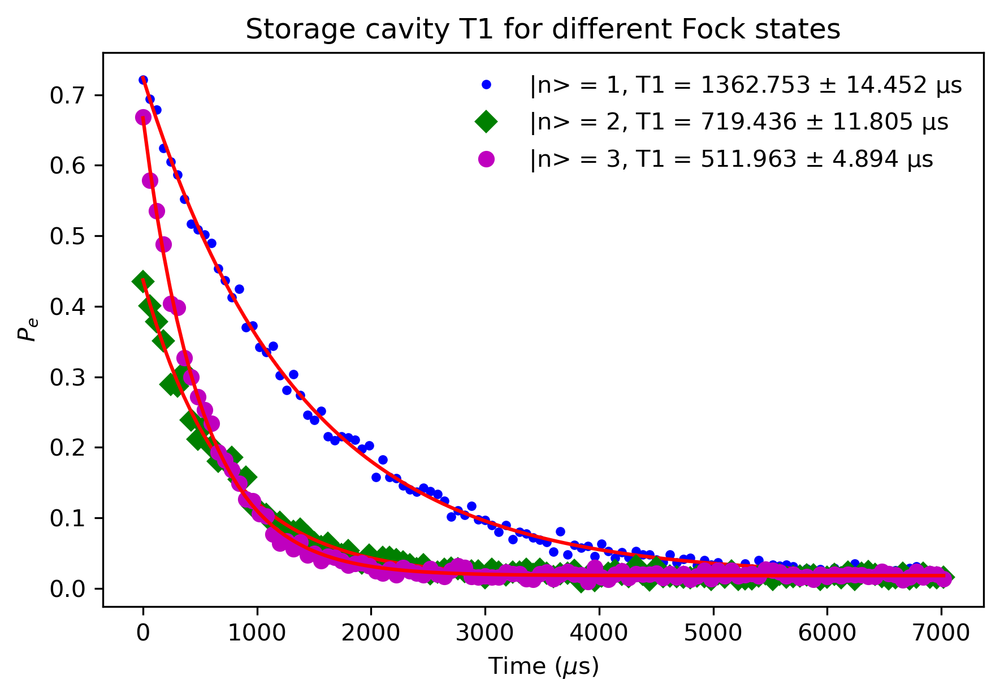

In [26]:
expt_name = 'storage_t1'
filelist = [1, 2, 3]
fig, ax = plt.subplots(1, 1, dpi=300)

marker = ['b.', 'gD', 'mo', 'y*']
for ii, i in enumerate(filelist):
    filename = "..\\data\\thesis\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['res'])
        x = array(a['time'])/1e3
        
        y = Q
        
        x_fit = np.linspace(0, np.max(x), len(x)+1)

        popt, pcov = curve_fit(expfunc_baseline, x, y, p0=(1, 1000, 0))
        ax.plot(x, y, marker[ii], label=r"|n> = {}, T1 = {:.3f} $\pm$ {:.3f} μs".format(ii+1, popt[1], np.sqrt(np.diag(pcov)[1])))
        ax.plot(x_fit, expfunc_baseline(x_fit, *popt), 'r-' )
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel(r'$P_{e}$')

ax.legend(loc='best', frameon=False)
fig.tight_layout()
plt.title('Storage cavity T1 for different Fock states')
# plt.savefig('../plots/20210604-Storage-T1decay_Fock.png', dpi=300, transparent=False, bbox_inches='tight')
plt.show()

## QNDness Qubit readout

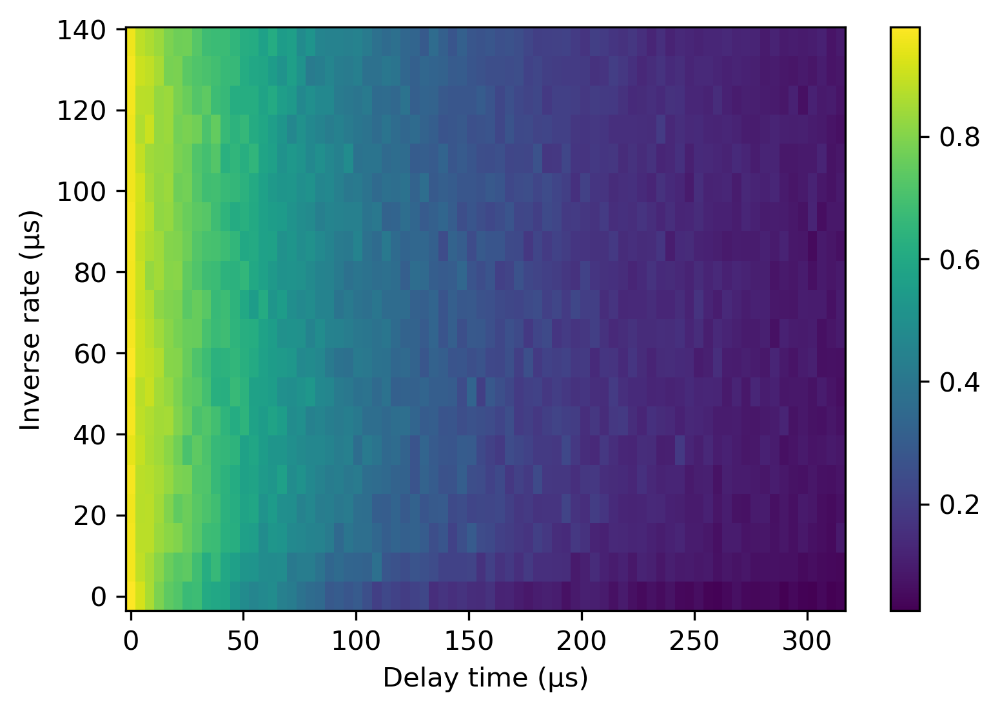

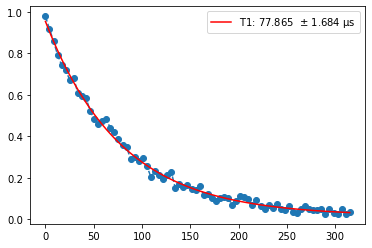

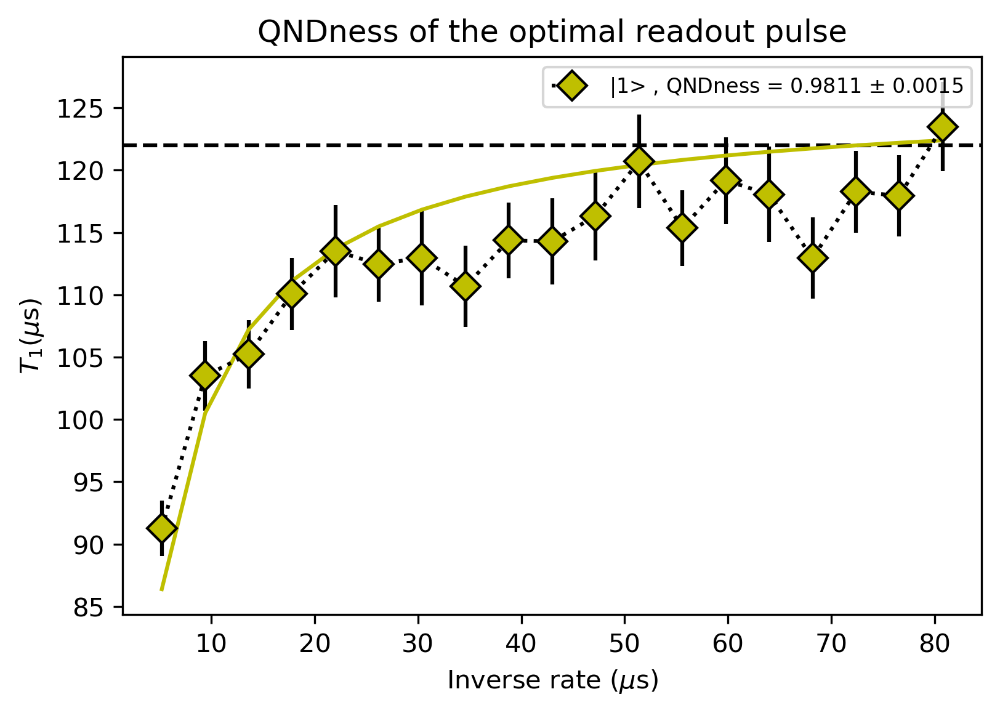

QNDness = 0.981


In [553]:
"""Based off of Yvonner's thesis Fig. 3.7, eq (3.2)

"""
def qndness(x, b):
    t1 = 126
    return 1/(1/t1 + b/x)

expt_name = 'qubit_t1_qndness'
filelist = [2]

t1_rate  =[]
t1_rate_err  =[]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['res'])
        x = array(a['time'])/1e3
        inv_rate = array(a['inv_rate'])/1e3 + 1
        
        fig, axs = plt.subplots(dpi=300)
        im = axs.pcolormesh(x, rate, Q, shading='auto')
        plt.colorbar(im)
        plt.xlabel('Delay time (μs)')
        plt.ylabel('Inverse rate (μs)')

        plt.show()
        
        t = 0
        x = x[t:]
        for jj in range(len(Q)):

            y = Q[jj][t:]

            popt, pcov = curve_fit(expfunc_baseline, x, y, p0=(1, 120, 0))

            t1 = (popt[1])
            t1_err = np.sqrt(np.diag(pcov)[1])
            t1_rate.append(t1)
            t1_rate_err.append(t1_err)

popt, pcov = curve_fit(expfunc_baseline, x, Q[0][t:], p0=(1, 100, 0))
plt.plot(x, Q[0][t:], 'o--')
t1 = (popt[1])
t1_err = np.sqrt(np.diag(pcov)[1])
plt.plot(x, expfunc_baseline(x, *popt), 'r-', label=r"T1: %.3f  $\pm$ %.3f μs"%(t1, t1_err))
ax.set_xlabel('Time ($\mu$s)')
ax.set_ylabel(r'$P_{e}$')
plt.legend()
plt.show()

x = inv_rate[1:]
popt, pcov = curve_fit(qndness, x, t1_rate[1:], sigma=t1_rate_err[1:])
plt.figure(dpi=300)
plt.axhline(y=122, linestyle='--', color='k')
qnd = np.round(1-popt[0], 4)
qnd_err = np.round(np.sqrt(np.diag(pcov)[0]), 4)
plt.errorbar(x, y=t1_rate[1:], yerr= t1_rate_err[1:], marker=markers[ii], markersize=8, 
             linestyle='dotted', color='k', markerfacecolor='y', label='|{}> , QNDness = {} $\pm$ {}'.format(ii+1, qnd, qnd_err ))
plt.plot(x, qndness(x, *popt),  color='y')

plt.xlabel('Inverse rate ($\mu$s)')
plt.ylabel(r'$T_{1}(\mu$s)')
plt.title('QNDness of the optimal readout pulse')
plt.legend(fontsize=8)
plt.show()

print("QNDness = %.3f"%(1-popt))

In [552]:
inv_rate

array([ 0. ,  4.2,  8.4, 12.6, 16.8, 21. , 25.2, 29.4, 33.6, 37.8, 42. ,
       46.2, 50.4, 54.6, 58.8, 63. , 67.2, 71.4, 75.6, 79.8])

In [534]:
np.exp(-3.2/120)

0.973685749353145

## QNDness Pi + Readout

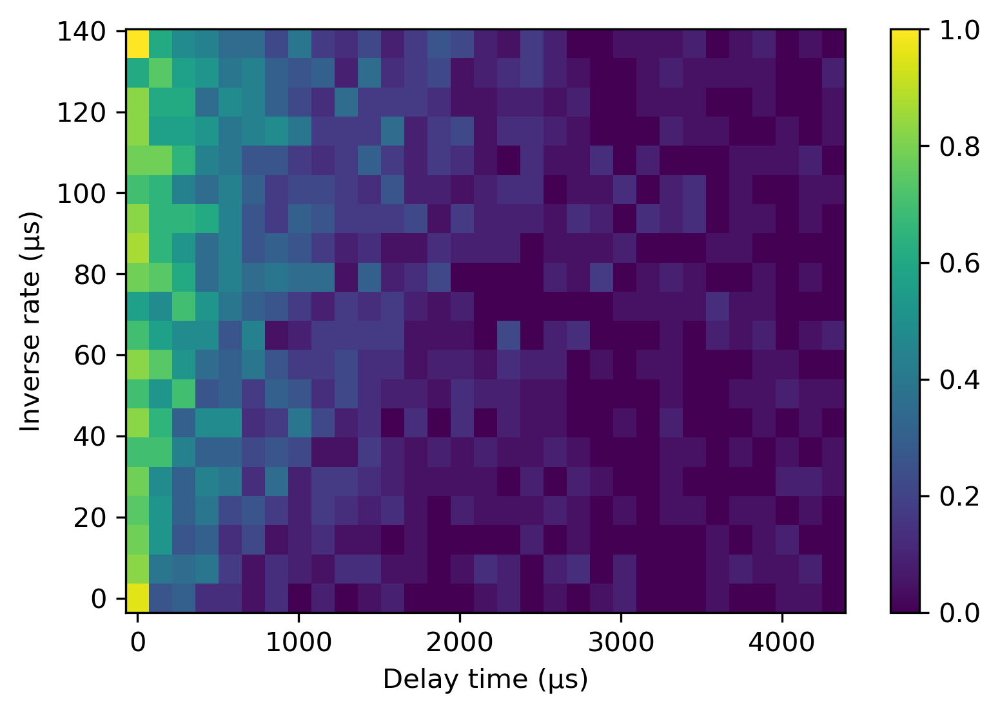

In [546]:
"""Based off of Yvonner's thesis Fig. 3.7, eq (3.2)

"""

def qndness(x, b):
    t1 = 1362
    return 1/(1/t1 + b/x)

expt_name = 'storage_t1_qndness'
filelist = [18]

t1_rate  =[]
t1_rate_err  =[]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['res'])
        x = array(a['time'])/1e3
        inv_rate = array(a['inv_rate'])/1e3
        
        fig, axs = plt.subplots(dpi=300)
        im = axs.pcolormesh(x, rate, Q, shading='auto')
        plt.colorbar(im)
        plt.xlabel('Delay time (μs)')
        plt.ylabel('Inverse rate (μs)')

        plt.show()        
        x = x[:]
        for jj in range(len(Q)):
            y = Q[jj][:]
            popt, pcov = curve_fit(expfunc_baseline, x, y, p0=(1, 1000, 0))
            t1 = (popt[1])
            t1_err = np.sqrt(np.diag(pcov)[1])
            t1_rate.append(t1)
            t1_rate_err.append(t1_err)

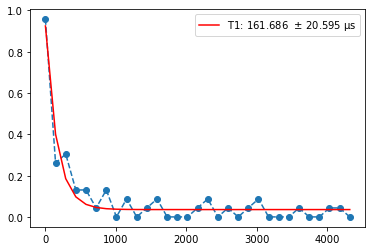

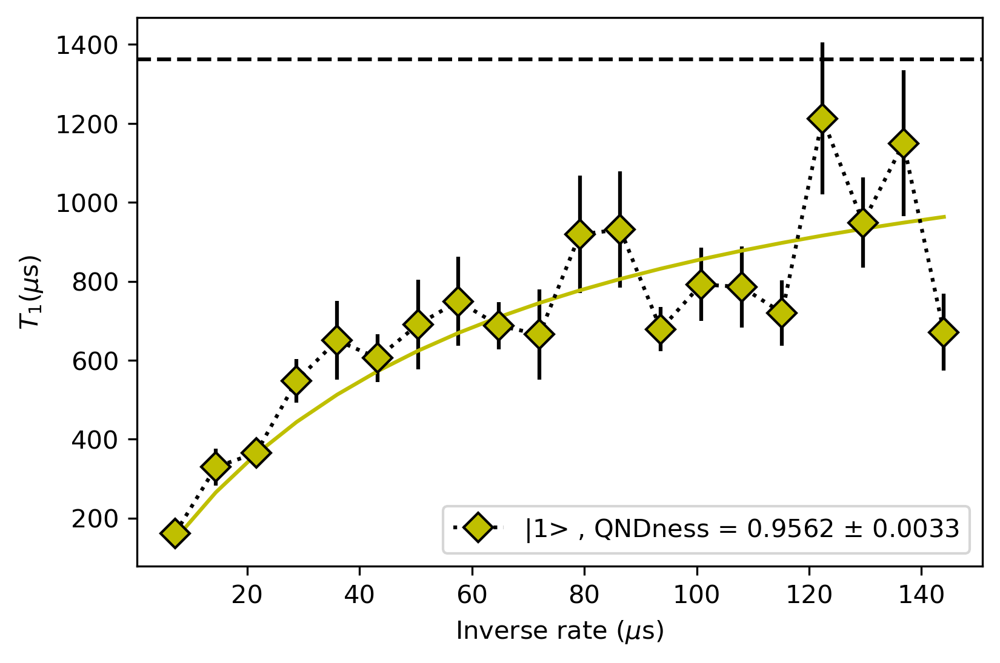

QNDness = 0.956


In [547]:
popt, pcov = curve_fit(expfunc_baseline, x, Q[0][t:], p0=(1, 1000, 0))
plt.plot(x, Q[0][t:], 'o--')
t1 = (popt[1])
t1_err = np.sqrt(np.diag(pcov)[1])
plt.plot(x, expfunc_baseline(x, *popt), 'r-', label=r"T1: %.3f  $\pm$ %.3f μs"%(t1, t1_err))
ax.set_xlabel('Time ($\mu$s)')
ax.set_ylabel(r'$P_{e}$')
plt.legend()
plt.show()

x = inv_rate
popt, pcov = curve_fit(qndness, x, t1_rate, sigma=t1_rate_err)
plt.figure(dpi=300)
plt.axhline(y=1362, linestyle='--', color='k')
qnd = np.round(1-popt[0], 4)
qnd_err = np.round(np.sqrt(np.diag(pcov)[0]), 4)
plt.errorbar(x, y=t1_rate, yerr= t1_rate_err, marker=markers[ii], markersize=8, 
             linestyle='dotted', color='k', markerfacecolor=colors[ii], label='|{}> , QNDness = {} $\pm$ {}'.format(ii+1, qnd, qnd_err ))
plt.plot(x, qndness(x, *popt),  color=colors[ii])

plt.xlabel('Inverse rate ($\mu$s)')
plt.ylabel(r'$T_{1}(\mu$s)')

plt.legend()
plt.show()

print("QNDness = %.3f"%(1-popt))

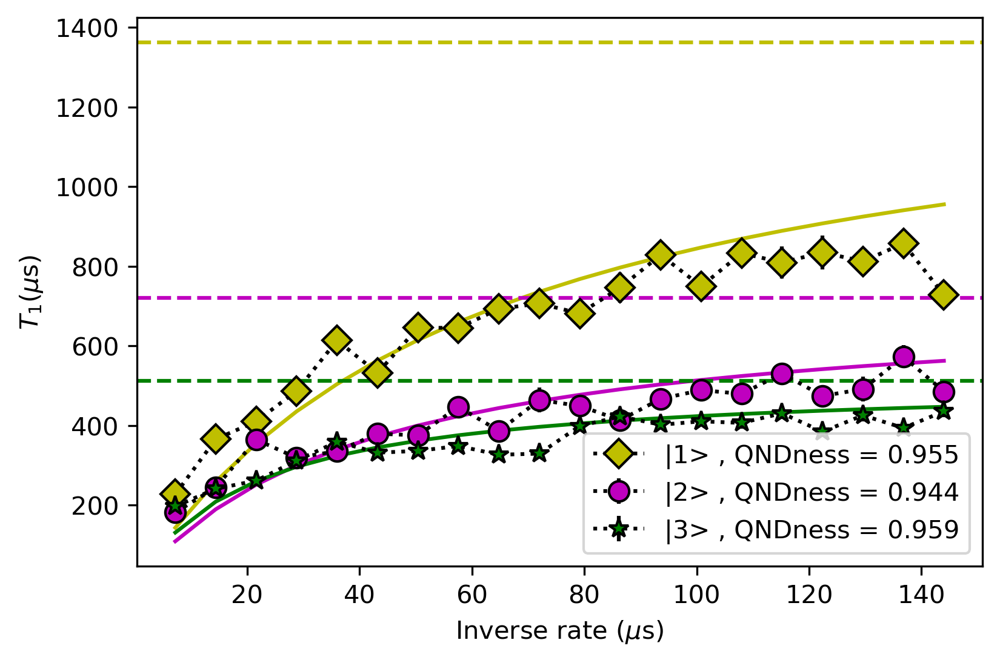

In [548]:
"""Based off of Yvonner's thesis Fig. 3.7, eq (3.2)

"""
t1_ind = [1362, 720, 512]
def qndness(x, b):
    return 1/(1/t1 + b/x)

expt_name = 'storage_t1_qndness'
filelist = [11, 14, 17]

t1_rate = {}
t1_rate_err = {}

fig, axs = plt.subplots(1, 1, dpi=300)
markers = ['D', 'o', '*']
colors = ['y', 'm', 'g']

qnd = []
qnd_err = []

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['res'])
        x = array(a['time'])/1e3
        inv_rate = array(a['inv_rate'])/1e3
        
#         fig, axs = plt.subplots()
#         im = axs.pcolormesh(x, rate, Q, shading='auto')
#         plt.colorbar(im)
#         plt.xlabel('Delay time (μs)')
#         plt.ylabel('Inverse rate (μs)')
#         plt.show()        
        x = x[:]
        t1_temp = []
        t1_err_temp = []
        for jj in range(len(Q)):
            y = Q[jj][:]
            popt, pcov = curve_fit(expfunc_baseline, x, y, p0=(1, 1000, 0))
            t1 = (popt[1])
            t1_err = np.sqrt(np.diag(pcov)[1])
            t1_temp.append(t1)
            t1_err_temp.append(t1_err)
        t1_rate['n%i'%(ii+1)] = t1_temp
        t1_rate_err['n%i'%(ii+1)] = t1_err_temp
        
        x = inv_rate
        t1 = t1_ind[ii]
        popt, pcov = curve_fit(qndness, x, t1_temp, sigma=t1_err_temp)
        axs.axhline(y=t1, linestyle='--', color=colors[ii])
        axs.errorbar(x, y=t1_temp, yerr= t1_err_temp, marker=markers[ii], markersize=8, 
                     linestyle='dotted', color='k', markerfacecolor=colors[ii], label='|{}> , QNDness = {}'.format(ii+1, np.round(1-popt[0], 3)))
        axs.plot(x, qndness(x, *popt),  color=colors[ii])
        axs.legend()
        
        qnd.append(1-popt[0])
        qnd_err.append(np.sqrt(np.diag(pcov)[0]))
        

axs.set_xlabel('Inverse rate ($\mu$s)')
axs.set_ylabel(r'$T_{1}(\mu$s)')
plt.show()

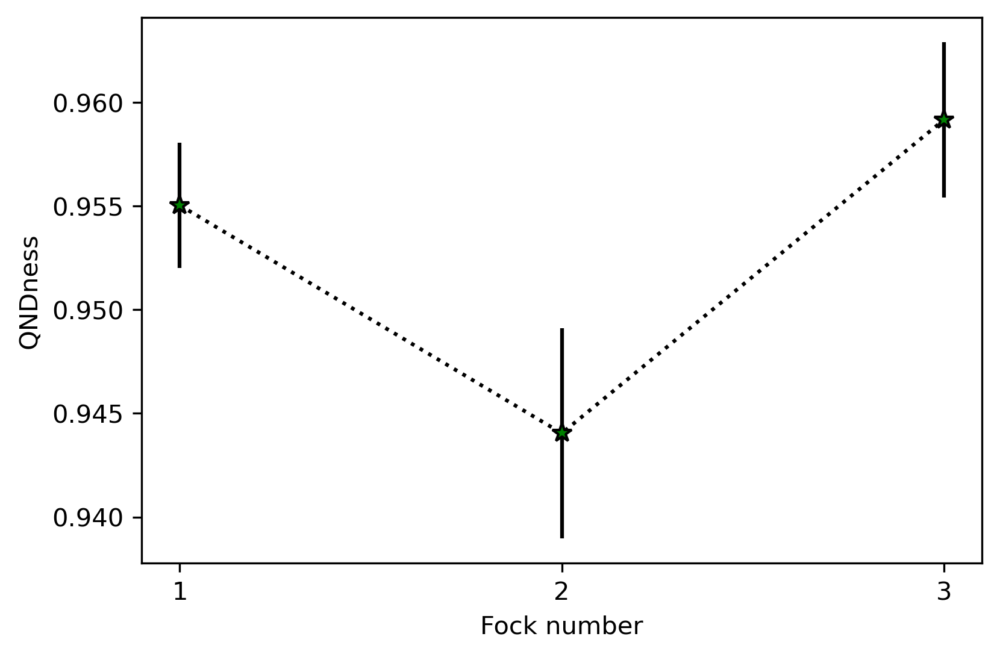

In [163]:
plt.figure(dpi=300)
plt.errorbar(np.arange(1, 4, 1), y=qnd, yerr= qnd_err, marker=markers[ii], markersize=8, 
             linestyle='dotted', color='k', markerfacecolor=colors[ii], label='|{}> , QNDness = {}'.format(ii+1, np.round(1-popt[0], 3)))
plt.xlabel('Fock number')
plt.ylabel('QNDness')
plt.xticks([1, 2, 3])
plt.show()

## QNDness Pi + Sq readout

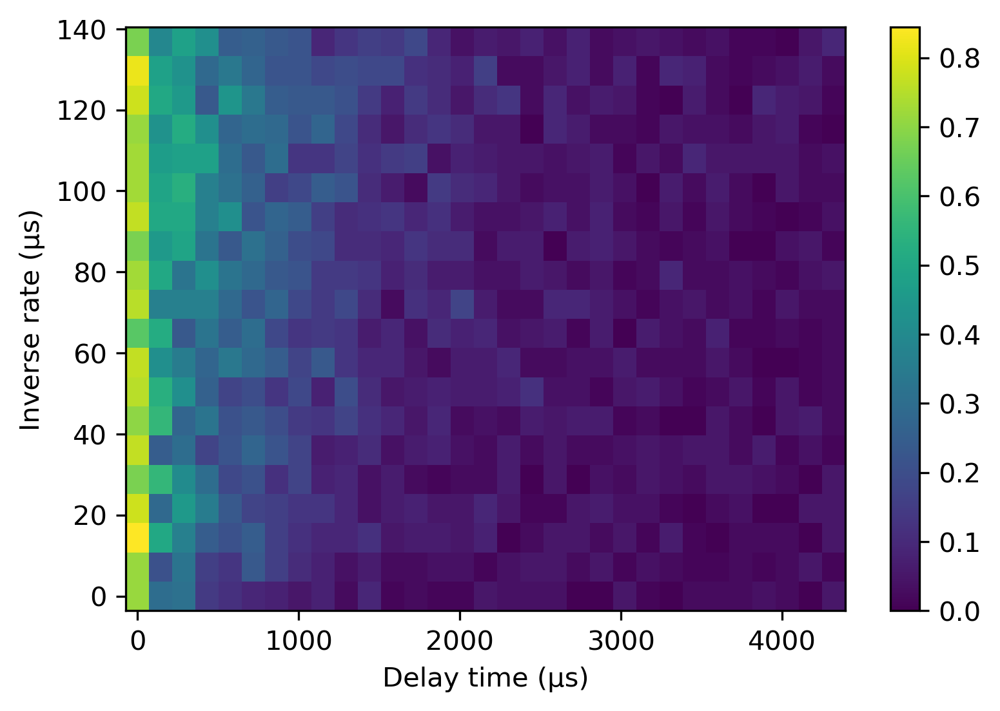

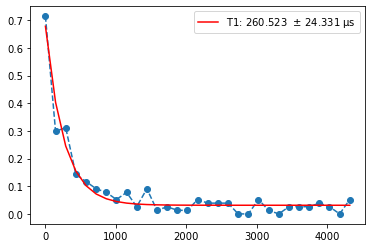

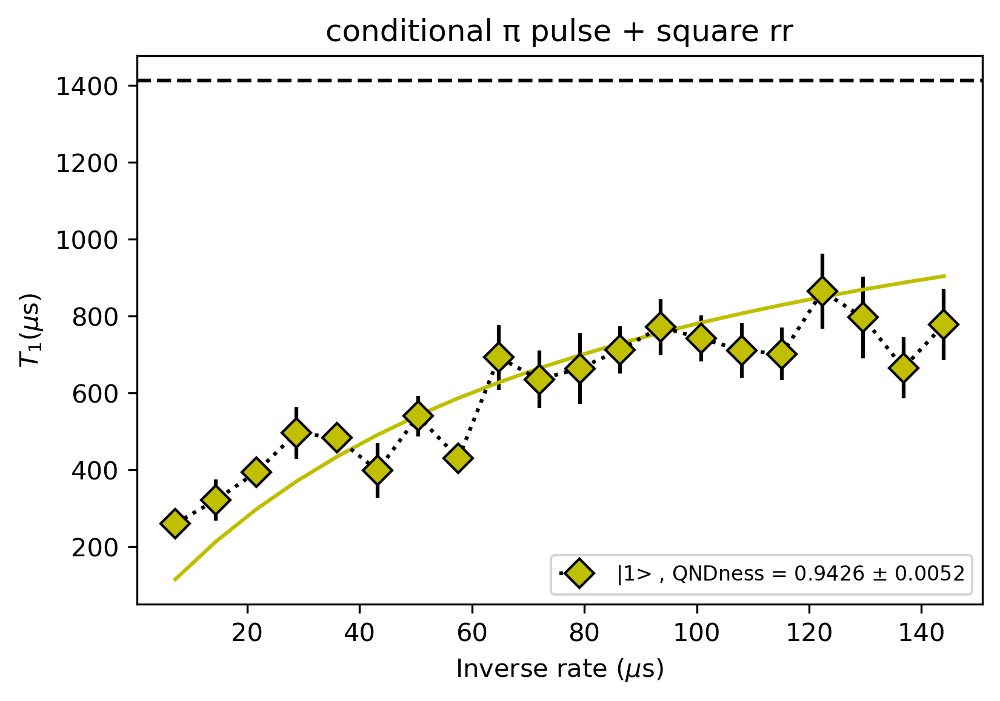

QNDness = 0.943


In [433]:
"""Based off of Yvonner's thesis Fig. 3.7, eq (3.2)

"""
def qndness(x, b):
    t1 = 1412
    return 1/(1/t1 + b/x)

expt_name = 'storage_t1_qndness_sq'
filelist = [2]

t1_rate  =[]
t1_rate_err  =[]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['res'])
        x = array(a['time'])/1e3
        inv_rate = array(a['inv_rate'])/1e3
        
        fig, axs = plt.subplots(dpi=300)
        im = axs.pcolormesh(x, rate, Q, shading='auto')
        plt.colorbar(im)
        plt.xlabel('Delay time (μs)')
        plt.ylabel('Inverse rate (μs)')

        plt.show()
        
        t = 0
        x = x[t:]
        for jj in range(len(Q)):

            y = Q[jj][t:]

            popt, pcov = curve_fit(expfunc_baseline, x, y, p0=(1, 1200, 0))

            t1 = (popt[1])
            t1_err = np.sqrt(np.diag(pcov)[1])
            t1_rate.append(t1)
            t1_rate_err.append(t1_err)

popt, pcov = curve_fit(expfunc_baseline, x, Q[0][t:], p0=(1, 1000, 0))
plt.plot(x, Q[0][t:], 'o--')
t1 = (popt[1])
t1_err = np.sqrt(np.diag(pcov)[1])
plt.plot(x, expfunc_baseline(x, *popt), 'r-', label=r"T1: %.3f  $\pm$ %.3f μs"%(t1, t1_err))
ax.set_xlabel('Time ($\mu$s)')
ax.set_ylabel(r'$P_{e}$')
plt.legend()
plt.show()

x = inv_rate
popt, pcov = curve_fit(qndness, x, t1_rate, sigma=t1_rate_err)
plt.figure(dpi=300)
plt.axhline(y=1412, linestyle='--', color='k')
qnd = np.round(1-popt[0], 4)
qnd_err = np.round(np.sqrt(np.diag(pcov)[0]), 4)
plt.errorbar(x, y=t1_rate, yerr= t1_rate_err, marker=markers[ii], markersize=8, 
             linestyle='dotted', color='k', markerfacecolor='y', label='|{}> , QNDness = {} $\pm$ {}'.format(ii+1, qnd, qnd_err ))
plt.plot(x, qndness(x, *popt),  color='y')

plt.xlabel('Inverse rate ($\mu$s)')
plt.ylabel(r'$T_{1}(\mu$s)')
plt.title('conditional π pulse + square rr')
plt.legend(fontsize=8)
plt.show()

print("QNDness = %.3f"%(1-popt))

## QNDness readout

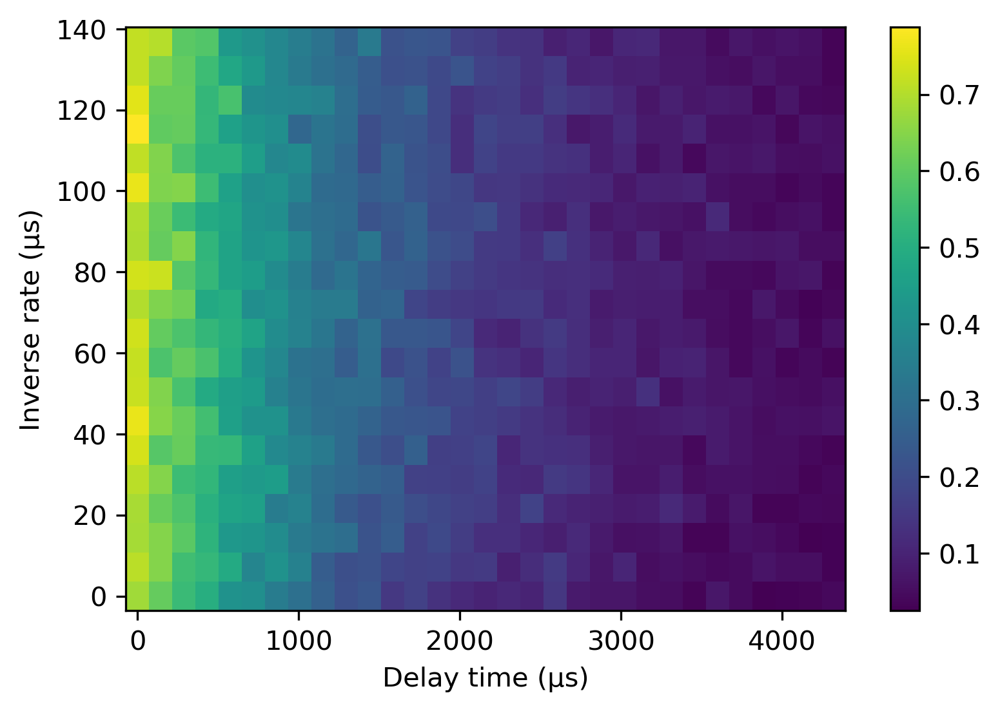

In [366]:
"""Based off of Yvonner's thesis Fig. 3.7, eq (3.2)

"""
def qndness(x, b):
    t1 = 1362
    return 1/(1/t1 + b/x)

expt_name = 'storage_t1_qndness_readout'
filelist = [17]

t1_rate  =[]
t1_rate_err  =[]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['res'])
        x = array(a['time'])/1e3
        inv_rate = array(a['inv_rate'])/1e3
        
        fig, axs = plt.subplots(dpi=300)
        im = axs.pcolormesh(x, rate, Q, shading='auto')
        plt.colorbar(im)
        plt.xlabel('Delay time (μs)')
        plt.ylabel('Inverse rate (μs)')

        plt.show()
        
        t = 0
        x = x[t:]
        for jj in range(len(Q)):

            y = Q[jj][t:]

            popt, pcov = curve_fit(expfunc_baseline, x, y, p0=(1, 1200, 0))
            t1 = (popt[1])
            t1_err = np.sqrt(np.diag(pcov)[1])
            t1_rate.append(t1)
            t1_rate_err.append(t1_err)

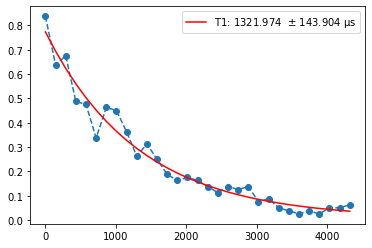

In [331]:
popt, pcov = curve_fit(expfunc_baseline, x, Q[2][t:], p0=(1, 1000, 0))

plt.plot(x, Q[2][t:], 'o--')
t1 = (popt[1])
t1_err = np.sqrt(np.diag(pcov)[1])


plt.plot(x, expfunc_baseline(x, *popt), 'r-', label=r"T1: %.3f  $\pm$ %.3f μs"%(t1, t1_err))
ax.set_xlabel('Time ($\mu$s)')
ax.set_ylabel(r'$P_{e}$')
plt.legend()
plt.show()

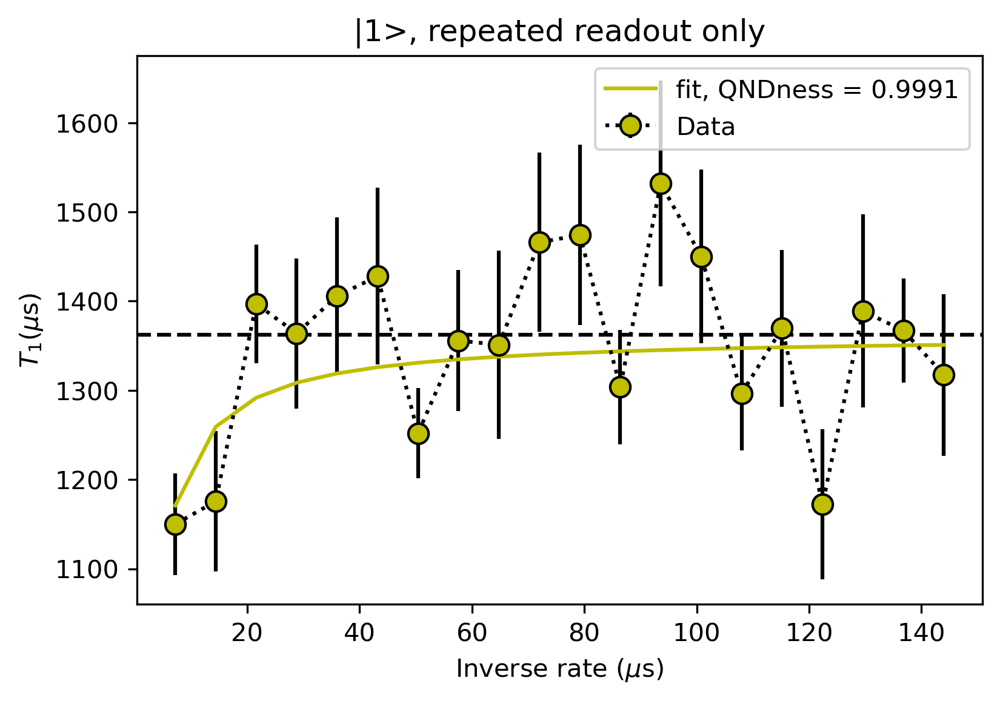

QNDness = 0.999


In [367]:
x = inv_rate
popt, pcov = curve_fit(qndness, x, t1_rate, sigma=t1_rate_err)
plt.figure(dpi=300)
plt.axhline(y=1362, linestyle='--', color='k')
plt.errorbar(x, y=t1_rate, yerr= t1_rate_err, marker='o', markersize=8, 
             linestyle='dotted', color='k', markerfacecolor='y', label='Data')
plt.plot(x, qndness(x, *popt), label='fit, QNDness = %.4f'%(1-popt), color='y')
plt.title('|1>, repeated readout only')
plt.xlabel('Inverse rate ($\mu$s)')
plt.ylabel(r'$T_{1}(\mu$s)')
plt.legend()
plt.show()

print("QNDness = %.3f"%(1-popt))

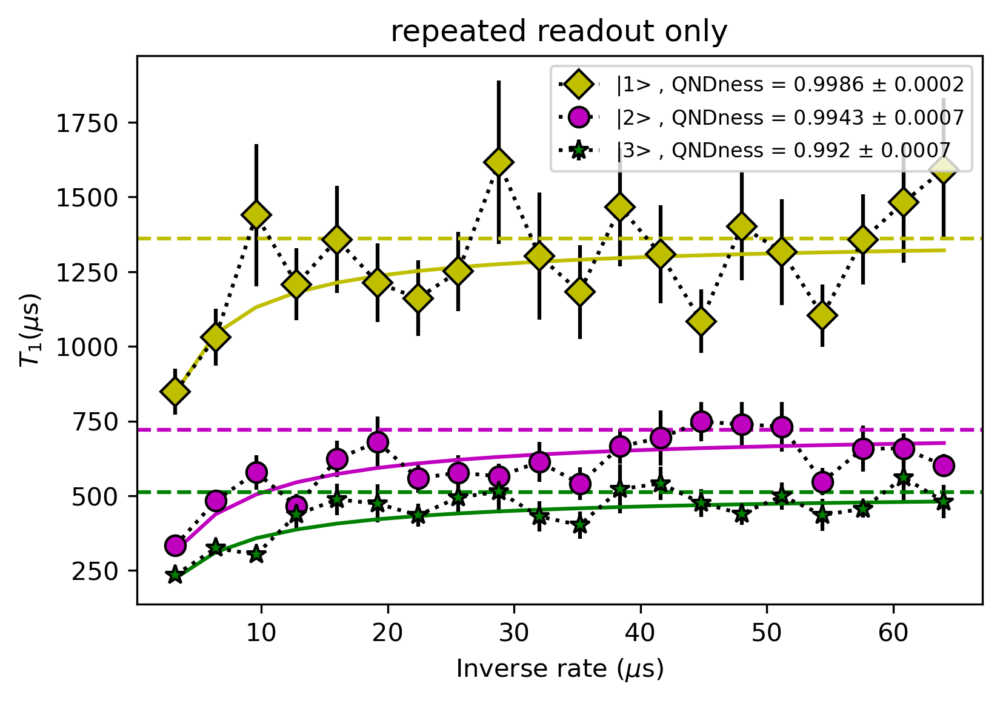

In [270]:
"""Based off of Yvonner's thesis Fig. 3.7, eq (3.2)

"""
t1_ind = [1362, 720, 512]
def qndness(x, b):
    return 1/(1/t1 + b/x)

expt_name = 'storage_t1_qndness_readout'
filelist = [4, 9, 13]

t1_rate = {}
t1_rate_err = {}

fig, axs = plt.subplots(1, 1, dpi=300)
markers = ['D', 'o', '*']
colors = ['y', 'm', 'g']

qnd = []
qnd_err = []

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['res'])
        x = array(a['time'])/1e3
        inv_rate = array(a['inv_rate'])/1e3
        
#         fig, axs = plt.subplots()
#         im = axs.pcolormesh(x, rate, Q, shading='auto')
#         plt.colorbar(im)
#         plt.xlabel('Delay time (μs)')
#         plt.ylabel('Inverse rate (μs)')
#         plt.show()        
        x = x[:]
        t1_temp = []
        t1_err_temp = []
        for jj in range(len(Q)):
            y = Q[jj][:]
            popt, pcov = curve_fit(expfunc_baseline, x, y, p0=(1, 1000, 0))
            t1 = (popt[1])
            t1_err = np.sqrt(np.diag(pcov)[1])
            t1_temp.append(t1)
            t1_err_temp.append(t1_err)
        t1_rate['n%i'%(ii+1)] = t1_temp
        t1_rate_err['n%i'%(ii+1)] = t1_err_temp
        
        x = inv_rate
        t1 = t1_ind[ii]
        popt, pcov = curve_fit(qndness, x, t1_temp, sigma=t1_err_temp)
        
        qnd = np.round(1-popt[0], 4)
        qnd_err = np.round(np.sqrt(np.diag(pcov)[0]), 4)
        
        axs.axhline(y=t1, linestyle='--', color=colors[ii])
        axs.errorbar(x, y=t1_temp, yerr= t1_err_temp, marker=markers[ii], markersize=8, 
                     linestyle='dotted', color='k', markerfacecolor=colors[ii], label='|{}> , QNDness = {} $\pm$ {}'.format(ii+1, qnd, qnd_err ))
        axs.plot(x, qndness(x, *popt),  color=colors[ii])
        axs.legend(fontsize=8)

axs.set_xlabel('Inverse rate ($\mu$s)')
axs.set_ylabel(r'$T_{1}(\mu$s)')
plt.title('repeated readout only')
plt.show()

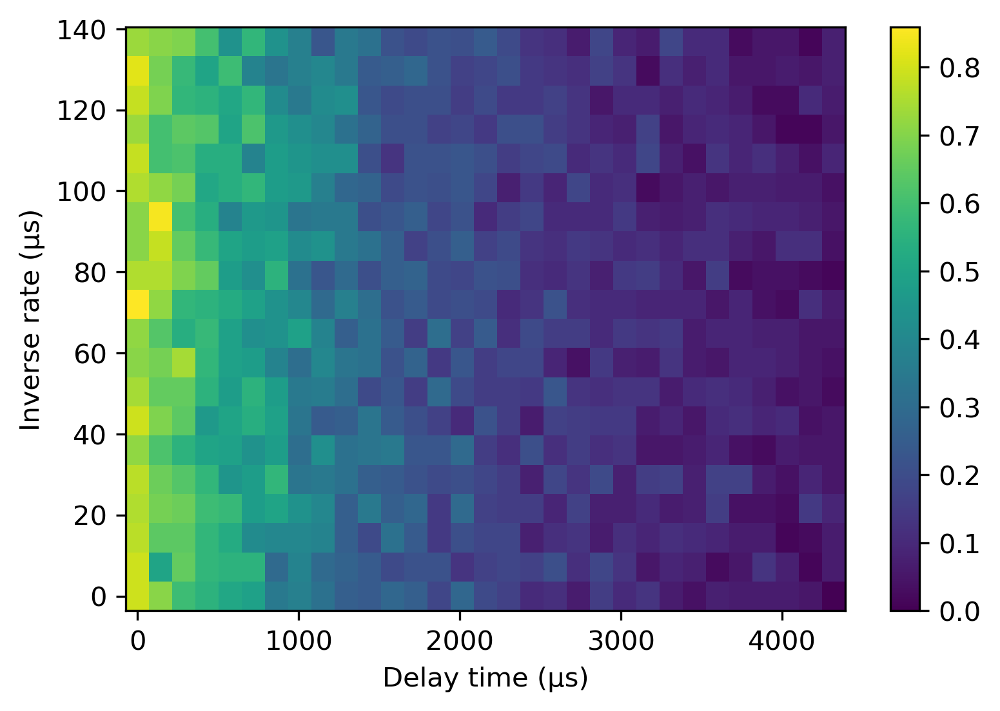

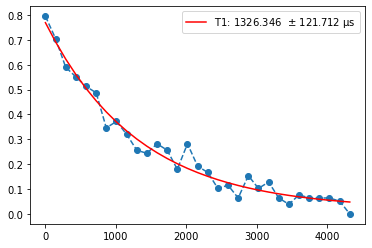

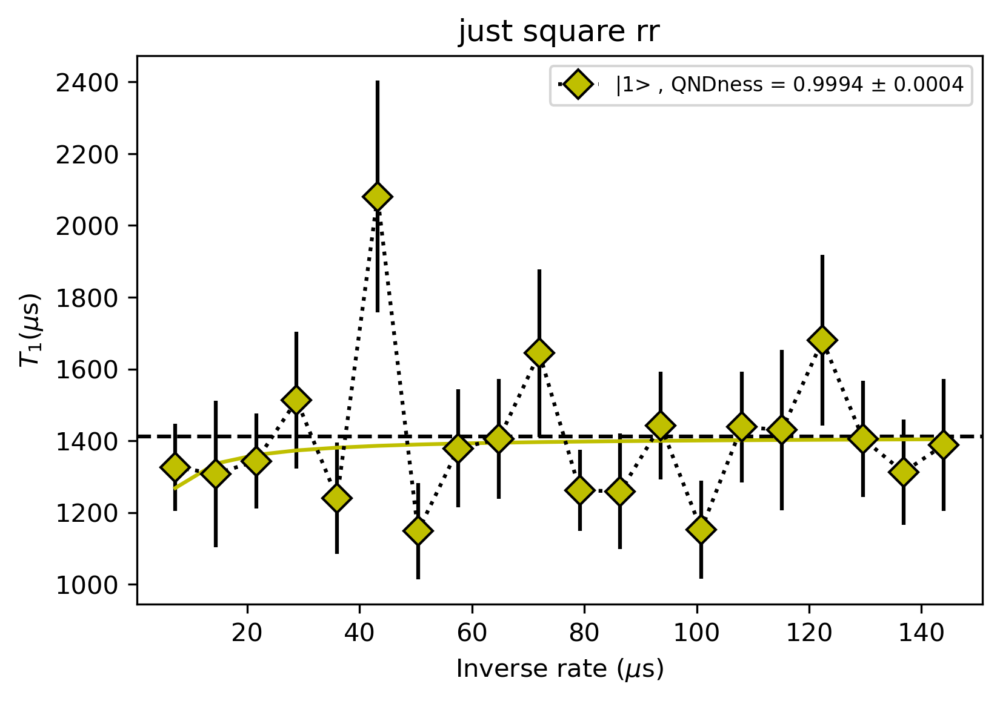

QNDness = 0.999


In [434]:
"""Based off of Yvonner's thesis Fig. 3.7, eq (3.2)

"""
def qndness(x, b):
    t1 = 1412
    return 1/(1/t1 + b/x)

expt_name = 'storage_t1_qndness_sq'
filelist = [3]

t1_rate  =[]
t1_rate_err  =[]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['res'])
        x = array(a['time'])/1e3
        inv_rate = array(a['inv_rate'])/1e3
        
        fig, axs = plt.subplots(dpi=300)
        im = axs.pcolormesh(x, rate, Q, shading='auto')
        plt.colorbar(im)
        plt.xlabel('Delay time (μs)')
        plt.ylabel('Inverse rate (μs)')

        plt.show()
        
        t = 0
        x = x[t:]
        for jj in range(len(Q)):

            y = Q[jj][t:]

            popt, pcov = curve_fit(expfunc_baseline, x, y, p0=(1, 1200, 0))

            t1 = (popt[1])
            t1_err = np.sqrt(np.diag(pcov)[1])
            t1_rate.append(t1)
            t1_rate_err.append(t1_err)

popt, pcov = curve_fit(expfunc_baseline, x, Q[0][t:], p0=(1, 1000, 0))
plt.plot(x, Q[0][t:], 'o--')
t1 = (popt[1])
t1_err = np.sqrt(np.diag(pcov)[1])
plt.plot(x, expfunc_baseline(x, *popt), 'r-', label=r"T1: %.3f  $\pm$ %.3f μs"%(t1, t1_err))
ax.set_xlabel('Time ($\mu$s)')
ax.set_ylabel(r'$P_{e}$')
plt.legend()
plt.show()

x = inv_rate
popt, pcov = curve_fit(qndness, x, t1_rate, sigma=t1_rate_err)
plt.figure(dpi=300)
plt.axhline(y=1412, linestyle='--', color='k')
qnd = np.round(1-popt[0], 4)
qnd_err = np.round(np.sqrt(np.diag(pcov)[0]), 4)
plt.errorbar(x, y=t1_rate, yerr= t1_rate_err, marker=markers[ii], markersize=8, 
             linestyle='dotted', color='k', markerfacecolor='y', label='|{}> , QNDness = {} $\pm$ {}'.format(ii+1, qnd, qnd_err ))
plt.plot(x, qndness(x, *popt),  color='y')

plt.xlabel('Inverse rate ($\mu$s)')
plt.ylabel(r'$T_{1}(\mu$s)')
plt.title('just square rr')
plt.legend(fontsize=8)
plt.show()

print("QNDness = %.3f"%(1-popt))

## QNDness Pi

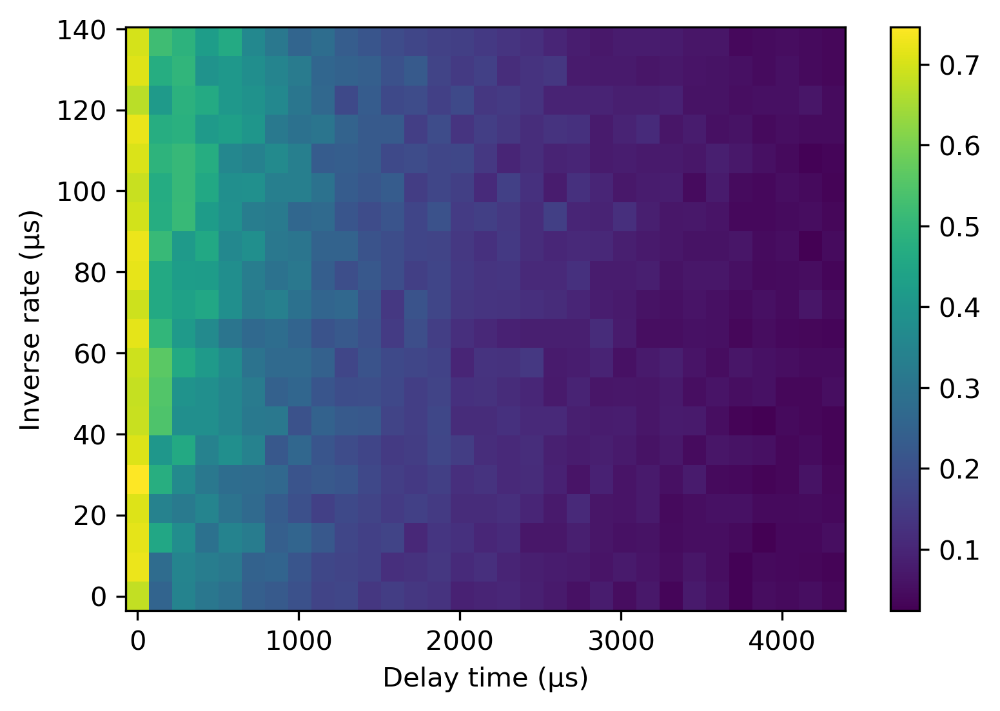

In [351]:
"""Based off of Yvonner's thesis Fig. 3.7, eq (3.2)

"""
def qndness(x, b):
    t1 = 1362
    return 1/(1/t1 + b/x)

expt_name = 'storage_t1_qndness_qubit'
filelist = [12]

t1_rate  =[]
t1_rate_err  =[]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['res'])
        x = array(a['time'])/1e3
        inv_rate = array(a['inv_rate'])/1e3
        
        fig, axs = plt.subplots(dpi=300)
        im = axs.pcolormesh(x, rate, Q, shading='auto')
        plt.colorbar(im)
        plt.xlabel('Delay time (μs)')
        plt.ylabel('Inverse rate (μs)')

        plt.show()
        
        t = 3
        x = x[t:]
        for jj in range(len(Q)):

            y = Q[jj][t:]

            popt, pcov = curve_fit(expfunc_baseline, x, y, p0=(1, 1200, 0))

            t1 = (popt[1])
            t1_err = np.sqrt(np.diag(pcov)[1])
            t1_rate.append(t1)
            t1_rate_err.append(t1_err)

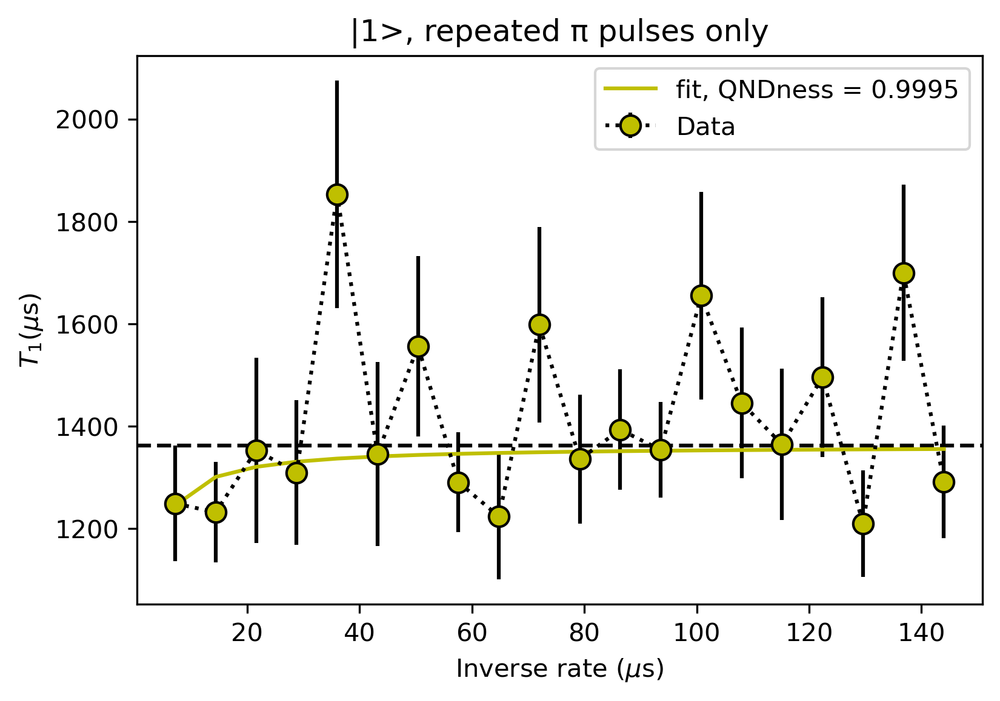

QNDness = 1.000


In [352]:
x = inv_rate
popt, pcov = curve_fit(qndness, x, t1_rate, sigma=t1_rate_err)
plt.figure(dpi=300)
plt.axhline(y=1362, linestyle='--', color='k')
plt.errorbar(x, y=t1_rate, yerr= t1_rate_err, marker='o', markersize=8, 
             linestyle='dotted', color='k', markerfacecolor='y', label='Data')
plt.plot(x, qndness(x, *popt), label='fit, QNDness = %.4f'%(1-popt), color='y')
plt.title('|1>, repeated π pulses only')
plt.xlabel('Inverse rate ($\mu$s)')
plt.ylabel(r'$T_{1}(\mu$s)')
plt.legend()
plt.show()

print("QNDness = %.3f"%(1-popt))

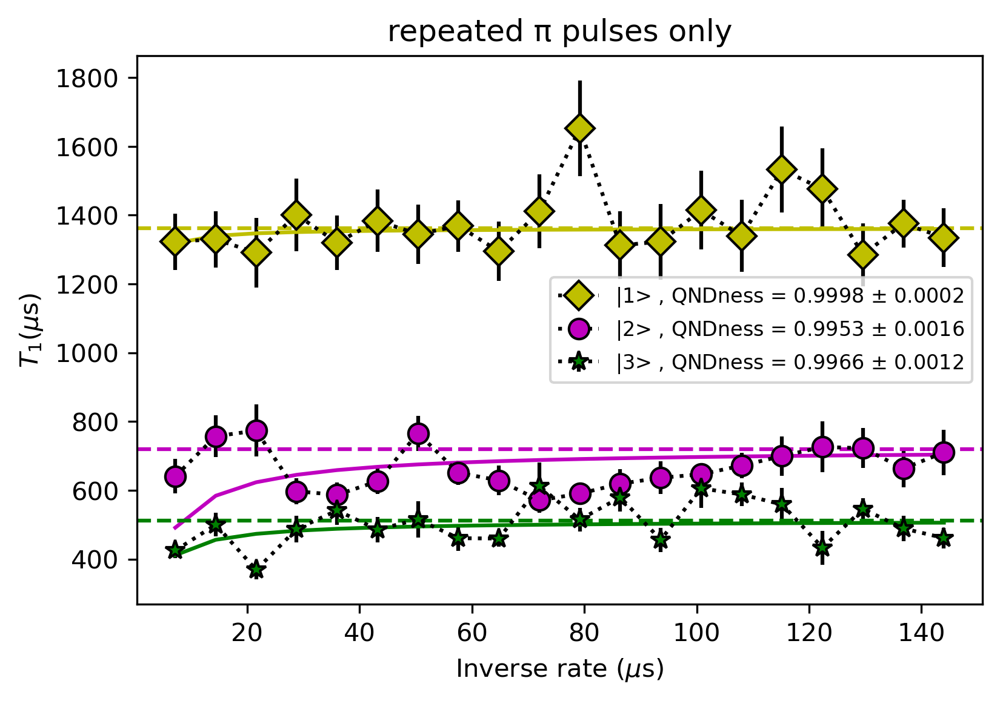

In [298]:
"""Based off of Yvonner's thesis Fig. 3.7, eq (3.2)

"""
t1_ind = [1362, 720, 512]
def qndness(x, b):
    return 1/(1/t1 + b/x)

expt_name = 'storage_t1_qndness_qubit'
filelist = [6, 7, 8]

t1_rate = {}
t1_rate_err = {}

fig, axs = plt.subplots(1, 1, dpi=300)
markers = ['D', 'o', '*']
colors = ['y', 'm', 'g']

qnd = []
qnd_err = []

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['res'])
        x = array(a['time'])/1e3
        inv_rate = array(a['inv_rate'])/1e3
        
#         fig, axs = plt.subplots()
#         im = axs.pcolormesh(x, rate, Q, shading='auto')
#         plt.colorbar(im)
#         plt.xlabel('Delay time (μs)')
#         plt.ylabel('Inverse rate (μs)')
#         plt.show()        
        t = 0
        x = x[t:]
        t1_temp = []
        t1_err_temp = []
        for jj in range(len(Q)):
            y = Q[jj][t:]
            popt, pcov = curve_fit(expfunc_baseline, x, y, p0=(1, 1000, 0))
            t1 = (popt[1])
            t1_err = np.sqrt(np.diag(pcov)[1])
            t1_temp.append(t1)
            t1_err_temp.append(t1_err)
        t1_rate['n%i'%(ii+1)] = t1_temp
        t1_rate_err['n%i'%(ii+1)] = t1_err_temp
        
        x = inv_rate
        t1 = t1_ind[ii]
        popt, pcov = curve_fit(qndness, x, t1_temp, sigma=t1_err_temp)
        
        qnd = np.round(1-popt[0], 4)
        qnd_err = np.round(np.sqrt(np.diag(pcov)[0]), 4)
        
        axs.axhline(y=t1, linestyle='--', color=colors[ii])
        axs.errorbar(x, y=t1_temp, yerr= t1_err_temp, marker=markers[ii], markersize=8, 
                     linestyle='dotted', color='k', markerfacecolor=colors[ii], label='|{}> , QNDness = {} $\pm$ {}'.format(ii+1, qnd, qnd_err ))
        axs.plot(x, qndness(x, *popt),  color=colors[ii])
        axs.legend(fontsize=8)

axs.set_xlabel('Inverse rate ($\mu$s)')
axs.set_ylabel(r'$T_{1}(\mu$s)')
plt.title('repeated π pulses only')
plt.show()

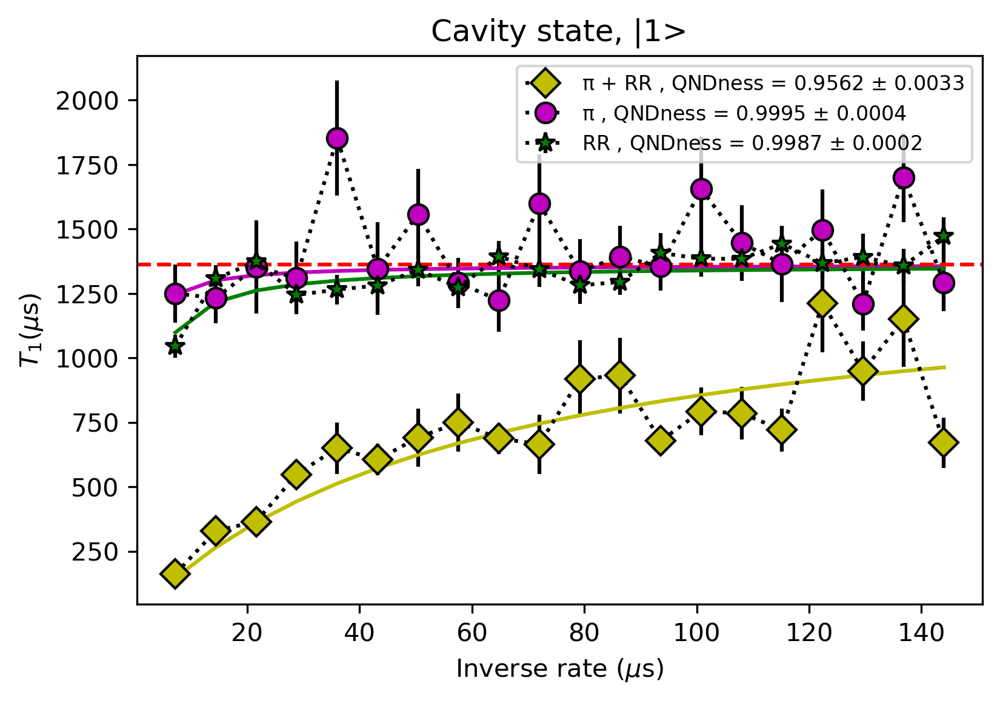

In [365]:
"""Based off of Yvonner's thesis Fig. 3.7, eq (3.2)

"""
t1_ind = [1362, 1362, 1362]
def qndness(x, b):
    return 1/(1/t1 + b/x)

expt_name = ['storage_t1_qndness', 'storage_t1_qndness_qubit', 'storage_t1_qndness_readout']
filelist = [18, 12, 16]

t1_rate = {}
t1_rate_err = {}

fig, axs = plt.subplots(1, 1, dpi=300)
markers = ['D', 'o', '*']
colors = ['y', 'm', 'g']
labels = ['π + RR', 'π', 'RR']
qnd = []
qnd_err = []

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name[ii].lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['res'])
        x = array(a['time'])/1e3
        inv_rate = array(a['inv_rate'])/1e3
        
#         fig, axs = plt.subplots()
#         im = axs.pcolormesh(x, rate, Q, shading='auto')
#         plt.colorbar(im)
#         plt.xlabel('Delay time (μs)')
#         plt.ylabel('Inverse rate (μs)')
#         plt.show()        
        if ii==1:
            t=3
        else:
            t=0
        x = x[t:]
        t1_temp = []
        t1_err_temp = []
        for jj in range(len(Q)):
            y = Q[jj][t:]
            popt, pcov = curve_fit(expfunc_baseline, x, y, p0=(1, 1000, 0))
            t1 = (popt[1])
            t1_err = np.sqrt(np.diag(pcov)[1])
            t1_temp.append(t1)
            t1_err_temp.append(t1_err)
        t1_rate['n%i'%(ii+1)] = t1_temp
        t1_rate_err['n%i'%(ii+1)] = t1_err_temp
        
        x = inv_rate
        t1 = t1_ind[ii]
        popt, pcov = curve_fit(qndness, x, t1_temp, sigma=t1_err_temp)
        
        qnd = np.round(1-popt[0], 4)
        qnd_err = np.round(np.sqrt(np.diag(pcov)[0]), 4)
        
        axs.errorbar(x, y=t1_temp, yerr= t1_err_temp, marker=markers[ii], markersize=8, 
                     linestyle='dotted', color='k', markerfacecolor=colors[ii], label='{} , QNDness = {} $\pm$ {}'.format(labels[ii], qnd, qnd_err ))
        axs.plot(x, qndness(x, *popt),  color=colors[ii])
        axs.legend(fontsize=8)

axs.axhline(y=t1, linestyle='--', color='r')
axs.set_xlabel('Inverse rate ($\mu$s)')
axs.set_ylabel(r'$T_{1}(\mu$s)')
plt.title('Cavity state, |1>')
plt.show()

##  QNDness, fast Pi

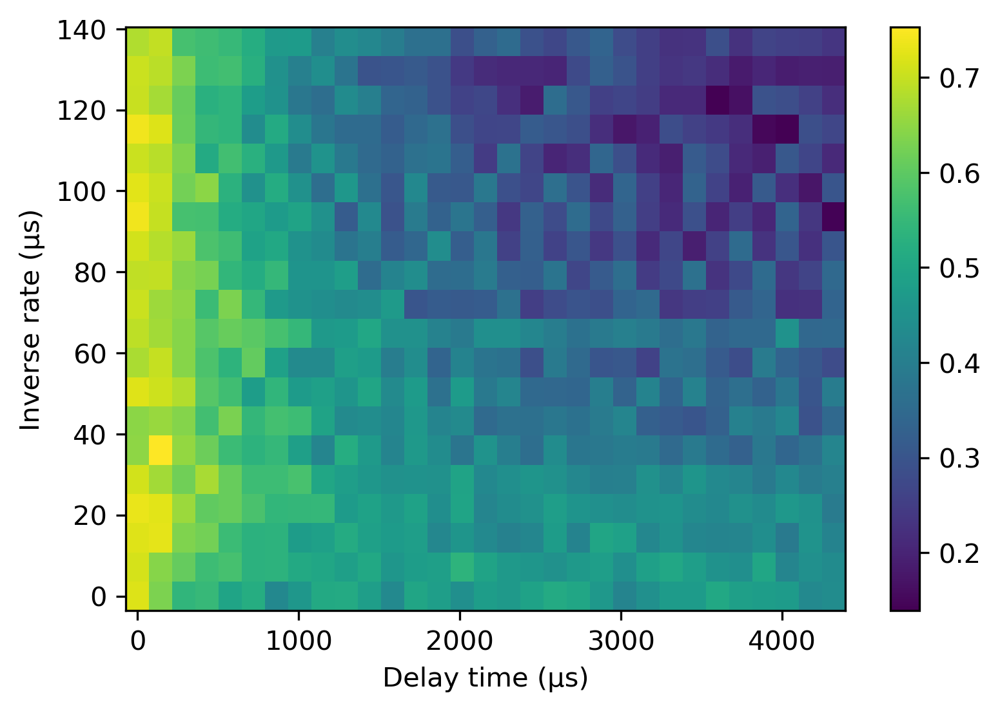

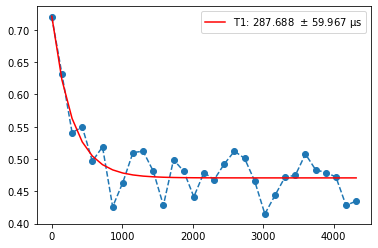

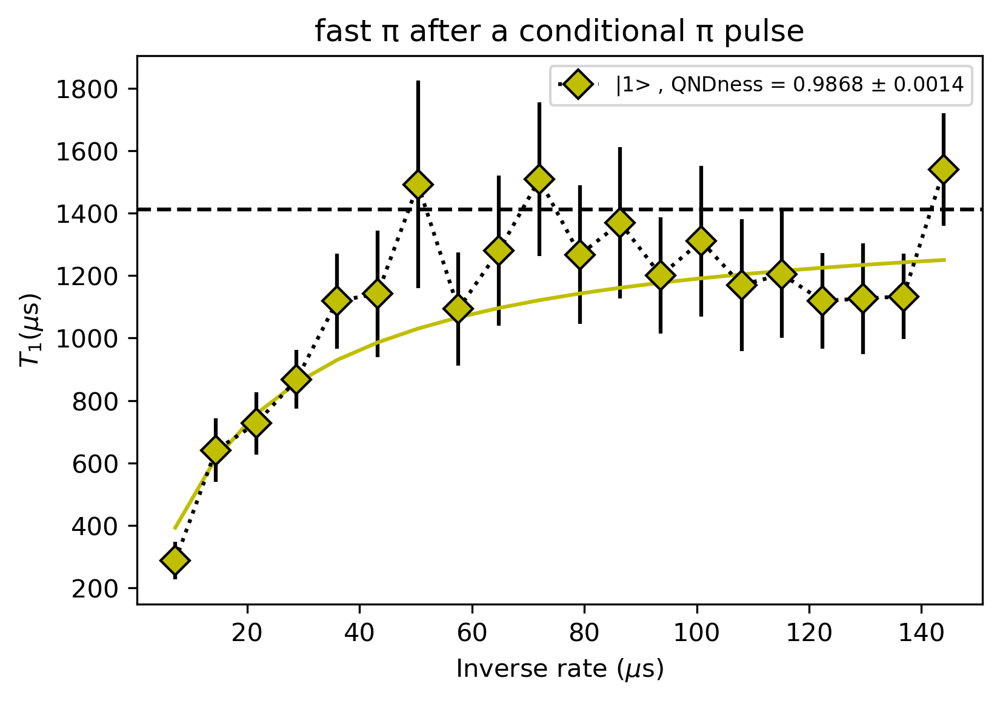

QNDness = 0.987


In [430]:
"""Based off of Yvonner's thesis Fig. 3.7, eq (3.2)

"""
def qndness(x, b):
    t1 = 1412
    return 1/(1/t1 + b/x)

expt_name = 'storage_t1_qndness_fastpi'
filelist = [7]

t1_rate  =[]
t1_rate_err  =[]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['res'])
        x = array(a['time'])/1e3
        inv_rate = array(a['inv_rate'])/1e3
        
        fig, axs = plt.subplots(dpi=300)
        im = axs.pcolormesh(x, rate, Q, shading='auto')
        plt.colorbar(im)
        plt.xlabel('Delay time (μs)')
        plt.ylabel('Inverse rate (μs)')

        plt.show()
        
        t = 0
        x = x[t:]
        for jj in range(len(Q)):

            y = Q[jj][t:]

            popt, pcov = curve_fit(expfunc_baseline, x, y, p0=(1, 1200, 0))

            t1 = (popt[1])
            t1_err = np.sqrt(np.diag(pcov)[1])
            t1_rate.append(t1)
            t1_rate_err.append(t1_err)


popt, pcov = curve_fit(expfunc_baseline, x, Q[0][t:], p0=(1, 1000, 0))
plt.plot(x, Q[0][t:], 'o--')
t1 = (popt[1])
t1_err = np.sqrt(np.diag(pcov)[1])
plt.plot(x, expfunc_baseline(x, *popt), 'r-', label=r"T1: %.3f  $\pm$ %.3f μs"%(t1, t1_err))
ax.set_xlabel('Time ($\mu$s)')
ax.set_ylabel(r'$P_{e}$')
plt.legend()
plt.show()

x = inv_rate
popt, pcov = curve_fit(qndness, x, t1_rate, sigma=t1_rate_err)
plt.figure(dpi=300)
plt.axhline(y=1412, linestyle='--', color='k')
qnd = np.round(1-popt[0], 4)
qnd_err = np.round(np.sqrt(np.diag(pcov)[0]), 4)
plt.errorbar(x, y=t1_rate, yerr= t1_rate_err, marker=markers[ii], markersize=8, 
             linestyle='dotted', color='k', markerfacecolor='y', label='|{}> , QNDness = {} $\pm$ {}'.format(ii+1, qnd, qnd_err ))
plt.plot(x, qndness(x, *popt),  color='y')

plt.xlabel('Inverse rate ($\mu$s)')
plt.ylabel(r'$T_{1}(\mu$s)')
plt.title('fast π after a conditional π pulse')
plt.legend(fontsize=8)
plt.show()

print("QNDness = %.3f"%(1-popt))

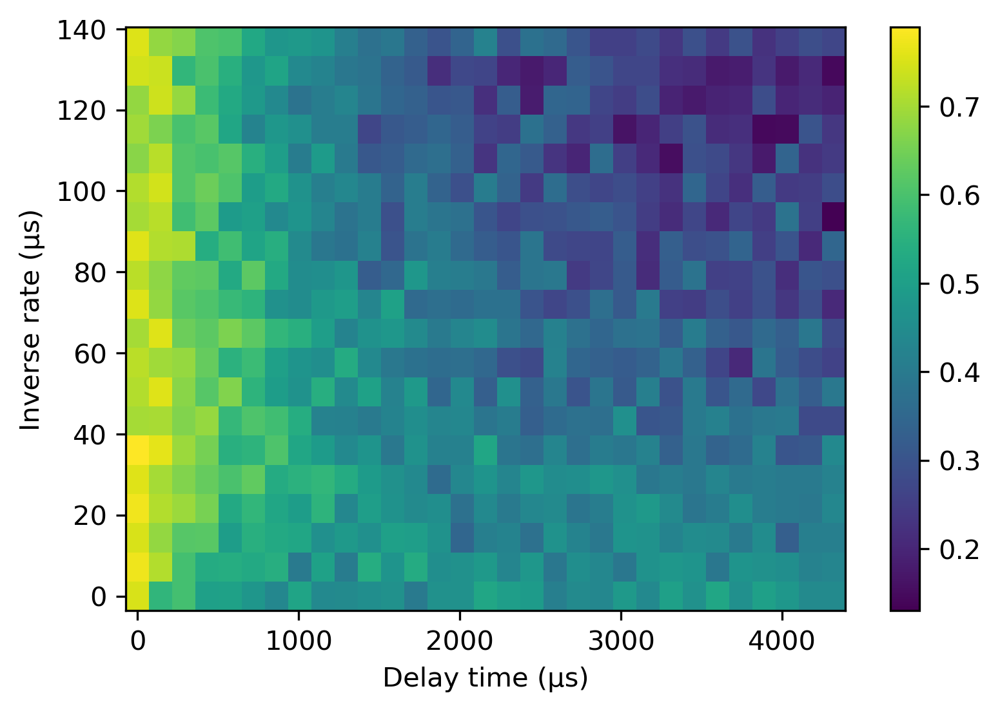

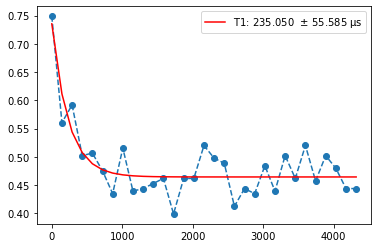

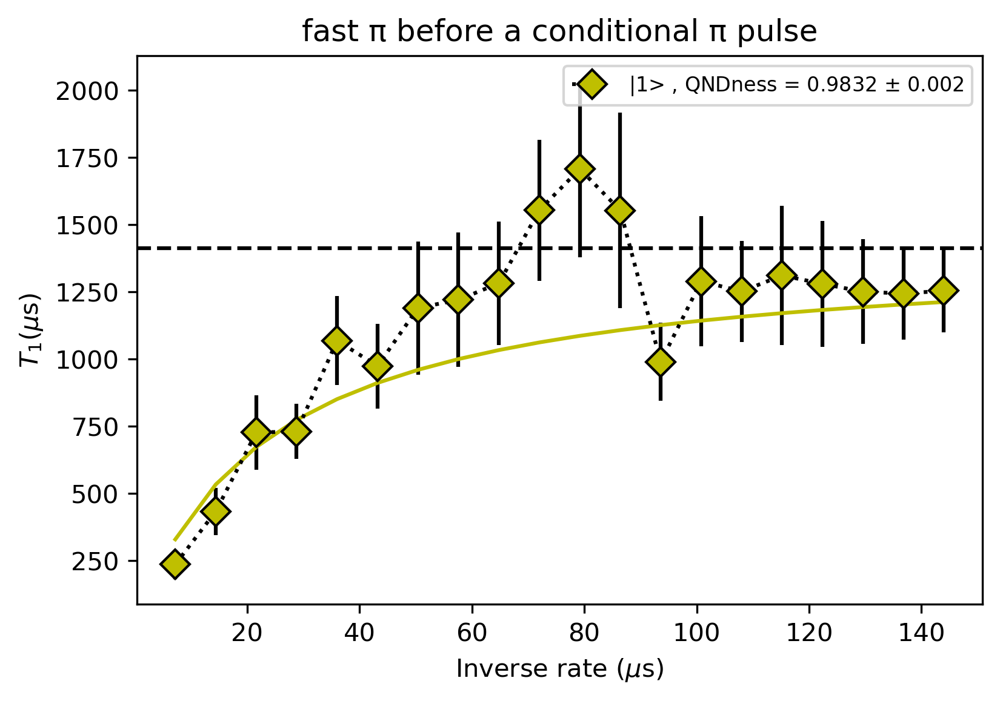

QNDness = 0.983


In [429]:
"""Based off of Yvonner's thesis Fig. 3.7, eq (3.2)

"""
def qndness(x, b):
    t1 = 1412
    return 1/(1/t1 + b/x)

expt_name = 'storage_t1_qndness_fastpi'
filelist = [6]

t1_rate  =[]
t1_rate_err  =[]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['res'])
        x = array(a['time'])/1e3
        inv_rate = array(a['inv_rate'])/1e3
        
        fig, axs = plt.subplots(dpi=300)
        im = axs.pcolormesh(x, rate, Q, shading='auto')
        plt.colorbar(im)
        plt.xlabel('Delay time (μs)')
        plt.ylabel('Inverse rate (μs)')

        plt.show()
        
        t = 0
        x = x[t:]
        for jj in range(len(Q)):

            y = Q[jj][t:]

            popt, pcov = curve_fit(expfunc_baseline, x, y, p0=(1, 1200, 0))

            t1 = (popt[1])
            t1_err = np.sqrt(np.diag(pcov)[1])
            t1_rate.append(t1)
            t1_rate_err.append(t1_err)


popt, pcov = curve_fit(expfunc_baseline, x, Q[0][t:], p0=(1, 1000, 0))
plt.plot(x, Q[0][t:], 'o--')
t1 = (popt[1])
t1_err = np.sqrt(np.diag(pcov)[1])
plt.plot(x, expfunc_baseline(x, *popt), 'r-', label=r"T1: %.3f  $\pm$ %.3f μs"%(t1, t1_err))
ax.set_xlabel('Time ($\mu$s)')
ax.set_ylabel(r'$P_{e}$')
plt.legend()
plt.show()

x = inv_rate
popt, pcov = curve_fit(qndness, x, t1_rate, sigma=t1_rate_err)
plt.figure(dpi=300)
plt.axhline(y=1412, linestyle='--', color='k')
qnd = np.round(1-popt[0], 4)
qnd_err = np.round(np.sqrt(np.diag(pcov)[0]), 4)
plt.errorbar(x, y=t1_rate, yerr= t1_rate_err, marker=markers[ii], markersize=8, 
             linestyle='dotted', color='k', markerfacecolor='y', label='|{}> , QNDness = {} $\pm$ {}'.format(ii+1, qnd, qnd_err ))
plt.plot(x, qndness(x, *popt),  color='y')

plt.xlabel('Inverse rate ($\mu$s)')
plt.ylabel(r'$T_{1}(\mu$s)')
plt.title('fast π before a conditional π pulse')
plt.legend(fontsize=8)
plt.show()

print("QNDness = %.3f"%(1-popt))

In [425]:
popt, pcov = curve_fit(expfunc_baseline, x, Q[2][t:], p0=(1, 1000, 0))

plt.plot(x, Q[2][t:], 'o--')
t1 = (popt[1])
t1_err = np.sqrt(np.diag(pcov)[1])


plt.plot(x, expfunc_baseline(x, *popt), 'r-', label=r"T1: %.3f  $\pm$ %.3f μs"%(t1, t1_err))
ax.set_xlabel('Time ($\mu$s)')
ax.set_ylabel(r'$P_{e}$')
plt.legend()
plt.show()


ValueError: operands could not be broadcast together with shapes (20,) (31,) 

In [423]:
np.argmax(t1_rate)

10

## Alpha

Energy decay of the storage cavity prepared in a coherent state with $\alpha$, measured with a selective $\pi$ pulse centered around n=0. 
\begin{equation}
P_{e} \sim  e^{-|\alpha|^{2} e^{-\kappa * t}}
\end{equation}

C:\Users\slab\AppData\Local\Temp\ipykernel_23244\1148790816.py:15: RuntimeWarning: overflow encountered in exp
  return a*np.exp(-alpha**2*np.exp(-k*t))


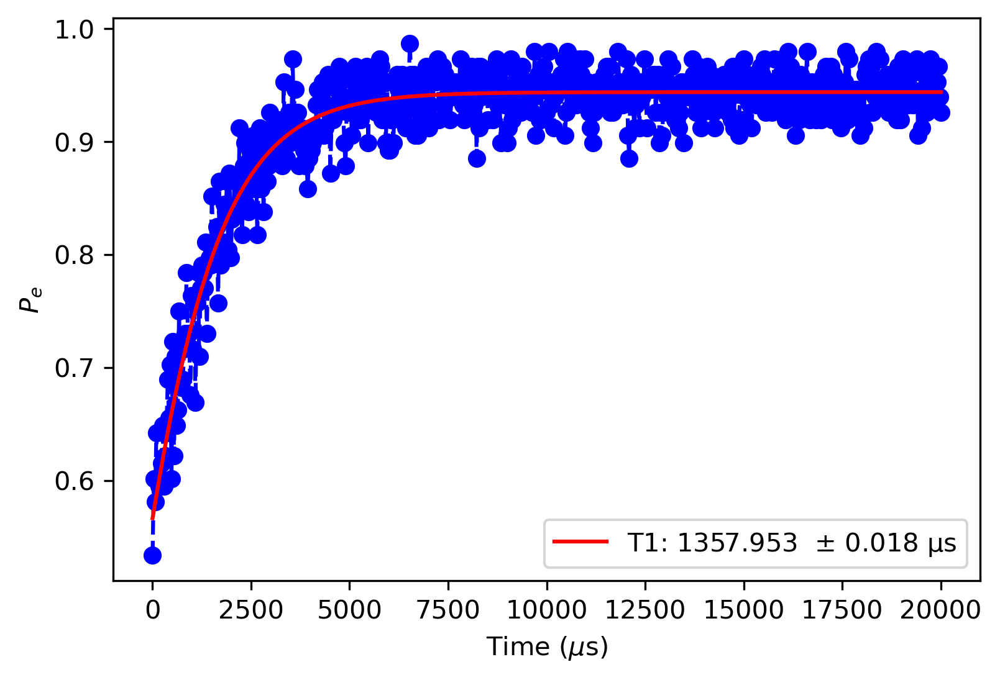

In [1587]:
"""Based off of Yvonner's thesis Fig. 3.7, eq (3.2)


"""
expt_name = 'storage_mode_t1'
filelist = [1]
for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['res'])
        x = array(a['time'])/1e3
        
        cav_len = array(a['cav_len'])
        cav_amp = array(a['cav_amp'])
        
        fig, ax = plt.subplots(1, 1, dpi=300)
        y = Q

        popt, pcov = curve_fit(storage_t1, x, y)
        ax.plot(x, y, 'bo--')
        t1 = 1/(popt[1])
        t1_err = np.sqrt(np.diag(pcov)[1])/popt[1]
        ax.plot(x, storage_t1(x, *popt), 'r-', label=r"T1: %.3f  $\pm$ %.3f μs"%(t1, t1_err))
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel(r'$P_{e}$')
        ax.legend()
        plt.show()
        
        

In [34]:
alpha

0.7145481862660984

In [35]:
alpha_awg_cal(cav_amp=1.0, cav_len=40)

0.7145481862660984

In [32]:
np.sqrt(np.diag(pcov)[1])/popt[1]

0.018286771849665217

## Qubit T1 as a function of coherent state in the cavity

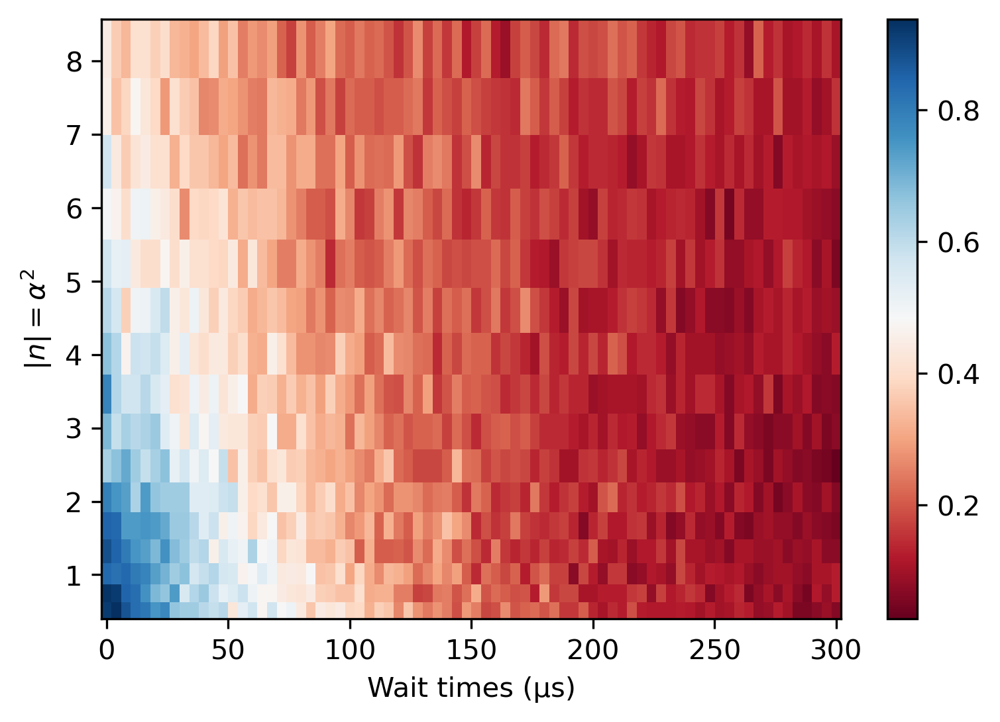

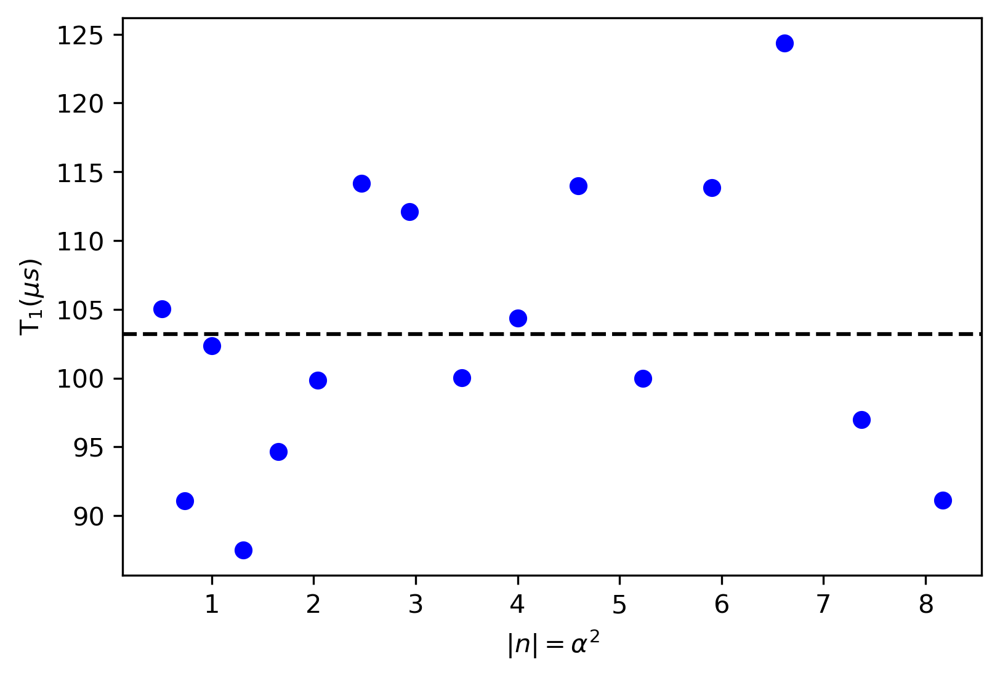

In [151]:
def alpha_awg_cal(cav_amp=1.0, cav_len=250):
    # takes input array of amps and length and converts them to output array of alphas,
    # using a calibration h5 file defined in the experiment config
    # pull calibration data from file, handling properly in case of multimode cavity
    cal_path = 'C:\_Lib\python\slab\experiments\qm_opx_mm\drive_calibration'

    fn_file = cal_path + '\\00000_2021_12_16_cavity_square_mode_2.h5'

    with File(fn_file, 'r') as f:
        omegas = np.array(f['omegas'])
        amps = np.array(f['amps'])

    # assume zero frequency at zero amplitude, used for interpolation function
    omegas = np.append(omegas, 0.0)
    amps = np.append(amps, 0.0)

    o_s = omegas
    a_s = amps

    # interpolate data, transfer_fn is a function that for each amp returns the corresponding omega
    transfer_fn = scipy.interpolate.interp1d(a_s, o_s)

    omega_desired = transfer_fn(cav_amp)
    alpha = omega_desired * cav_len

    """Returns alpha in the cavity"""
    return alpha

def t1(x, y):
    popt, pcov = curve_fit(expfunc_baseline, x, y)
    return popt[1]

expt_name = 't1_alpha'
filelist = [0]
for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        data = array(a['Q'])
        wait_times = array(a['time'])
        cav_len = array(a['len'])

        alphas = alpha_awg_cal(cav_amp=1.0, cav_len=cav_len)
        
        fig, ax = plt.subplots(1, 1, dpi=300)
        d = plt.pcolormesh(wait_times, alphas**2, data, cmap='RdBu', shading='auto')
        plt.colorbar()
        plt.xlabel('Wait times (μs)')
        plt.ylabel(r'$|n| = \alpha^{2}$')
        plt.show()

        fig, ax = plt.subplots(1, 1, dpi=300)

        df = pd.DataFrame(data)
        t1_alpha = df.apply(lambda row: t1(wait_times, row), axis=1)
        
        ax.plot(alphas**2, t1_alpha, 'bo')
        ax.axhline(np.mean(t1_alpha), color='k', linestyle='--')
        ax.set_ylabel(r'$\mathrm{T_{1}} (μs)$')
        ax.set_xlabel(r'$|n| = \alpha^{2}$')
        plt.show()


In [115]:
%%timeit
t1_alpha = df.apply(lambda row: t1(wait_times, row ), axis=1)

9.69 ms ± 224 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [106]:
%%timeit
t1_alpha = t1(wait_times, df[])

0      93.201742
1      89.400585
2      91.719144
3      93.906191
4     102.314539
5      88.011985
6     101.014282
7      89.204261
8      88.420436
9      93.636132
10     95.234866
Name: t1, dtype: float64

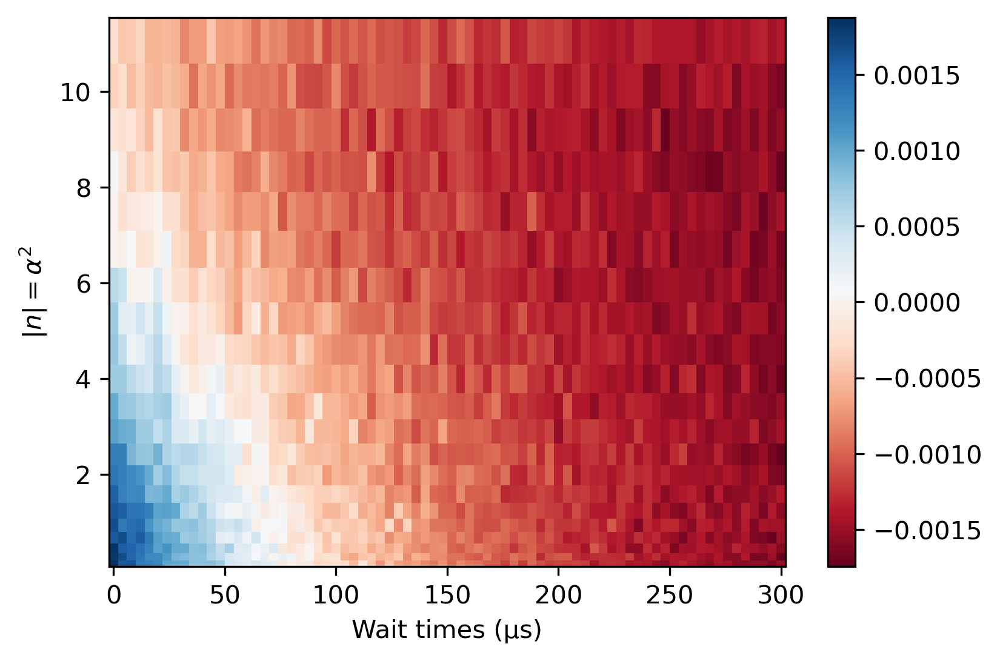

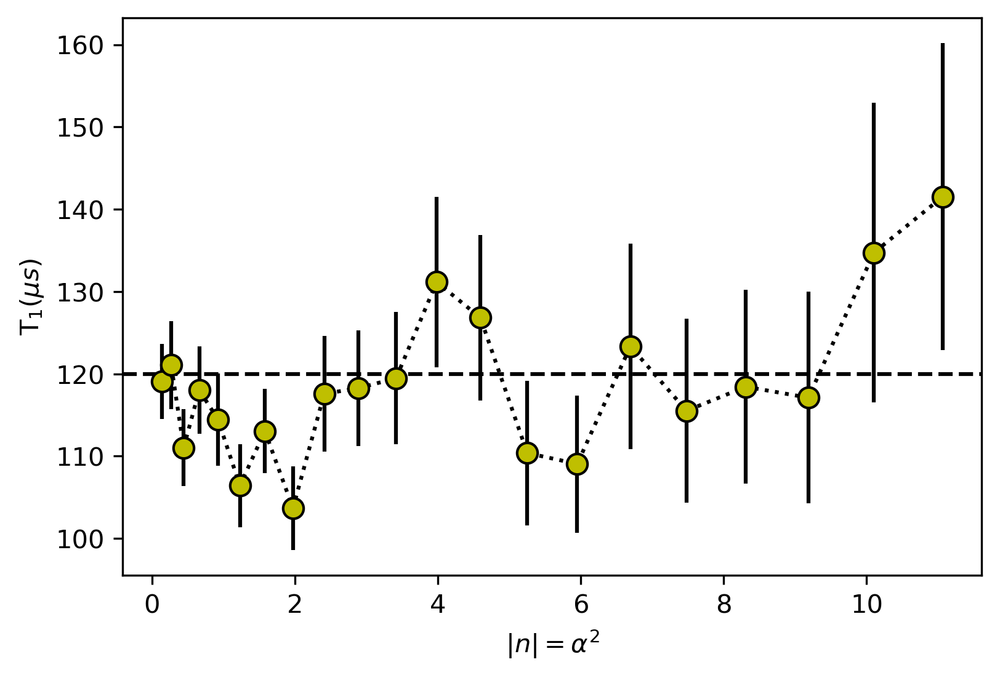

In [179]:
def t1(x, y):
    popt, pcov = curve_fit(expfunc_baseline, x, y)
    return popt[1], np.sqrt(np.diag(pcov)[1])

expt_name = 't1_alpha'
filelist = [4]
for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        data = array(a['I'])
        wait_times = array(a['time'])
        alphas = array(a['alphas'])
        
        fig, ax = plt.subplots(1, 1, dpi=300)
        d = plt.pcolormesh(wait_times, alphas**2, data, cmap='RdBu', shading='auto')
        plt.colorbar()
        plt.xlabel('Wait times (μs)')
        plt.ylabel(r'$|n| = \alpha^{2}$')
        plt.show()

        fig, ax = plt.subplots(1, 1, dpi=300)

        df = pd.DataFrame(data)
        fit_data = df.apply(lambda row: t1(wait_times, row), axis=1)
        t1_alpha = [f[0] for f in fit_data]
        t1_alpha_err = [f[1] for f in fit_data]
        ax.errorbar(alphas**2, y = t1_alpha, yerr=t1_alpha_err, marker='o', markersize=8, 
             linestyle='dotted', color='k', markerfacecolor='y')
        ax.axhline(y=120, color='k', linestyle='--')
        ax.set_ylabel(r'$\mathrm{T_{1}} (μs)$')
        ax.set_xlabel(r'$|n| = \alpha^{2}$')
        plt.show()


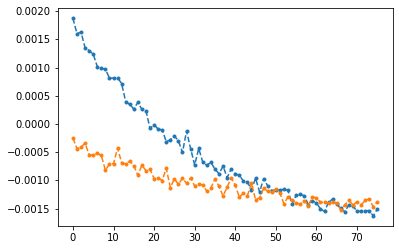

In [183]:
plt.plot(data[0], '.--')
plt.plot(data[-1], '.--')

# ge Ramsey Phase

2.5e-05
Original qubit frequency choice = 4.961404136352199 GHz
Oscillation freq =  0.024532699006104535  MHz
Suggested qubit frequency choice = 4.961404603653192 GHz
T2* = 217.13777087697505 us


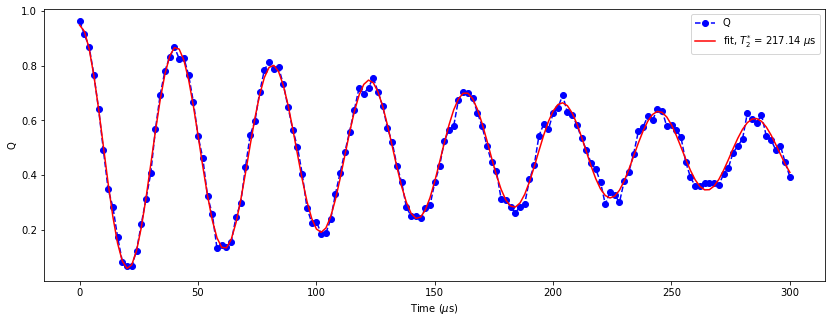

In [277]:
expt_name = 'Ramsey_phase'
filelist = [185]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])[:]
        t = array(a['time'])[:]
        ramsey_freq = array(a['ramsey_freq'])/1e9
        qubit_freq = array(a['qubit_freq'])[0]/1e9
        
        fig, ax = plt.subplots(1, 1, figsize=(14,5))

        P = Q[:]
        t = t[:]
        print(ramsey_freq)
        p = fitdecaysin(t[:], P[:],fitparams = None, showfit=False)
        ax.plot(t, P, 'bo--',label = 'Q')
        ax.plot(t[:], decaysin(np.append(p, 0), t[:]), 'r-', label=r'fit, $T_{2}^{*}$ = %.2f $\mu$s' % p[3])
        drive_freq = qubit_freq + ramsey_freq
        nu_q_new = drive_freq - p[1]/1e3
        print("Original qubit frequency choice =", qubit_freq,"GHz")
        print ("Oscillation freq = ", p[1]," MHz")
#         print("Offset freq =", offset,"MHz")
        print("Suggested qubit frequency choice =", nu_q_new,"GHz")
        print("T2* =", p[3],"us")
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('Q')
        ax.legend()

Original qubit frequency choice = 4.961392099670642 GHz
Oscillation freq =  0.9128955946819949  MHz
Suggested qubit frequency choice = 4.960679204075961 GHz
T2* = 0.04640516640722032 us


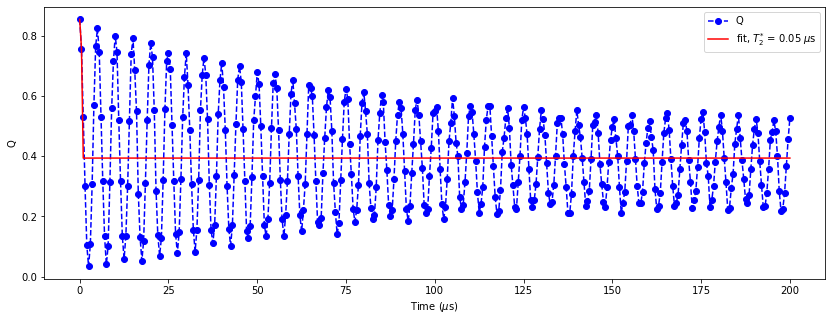

In [163]:
expt_name = 'ramsey_phase'
filelist = [102]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        t = array(a['time'])
        ramsey_freq = array(a['ramsey_freq'])/1e9
        qubit_freq = array(a['qubit_freq'][0])/1e9
        
        fig, ax = plt.subplots(1, 1, figsize=(14,5))

        P = Q[:]
        t = t[:]
#             return a*np.sin(2.*np.pi*b*x+c*np.pi/180.)*np.exp(-1.*(x-f)/d)+e

        popt, pcov = curve_fit(decaysin_ramsey, t, P)
        ax.plot(t, P, 'bo--',label = 'Q')
        ax.plot(t, decaysin_ramsey(t, *popt), 'r-', label=r'fit, $T_{2}^{*}$ = %.2f $\mu$s' % popt[3])
        drive_freq = qubit_freq + ramsey_freq
        nu_q_new = drive_freq - popt[1]/1e3
        print("Original qubit frequency choice =", qubit_freq,"GHz")
        print ("Oscillation freq = ", popt[1]," MHz")
        print("Suggested qubit frequency choice =", nu_q_new,"GHz")
        print("T2* =", popt[3],"us")
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('Q')
        ax.legend()

In [165]:
qubit_freq1 = drive_freq - popt[1]/1e3
qubit_freq2 = drive_freq + popt[1]/1e3
print(qubit_freq1, qubit_freq2)

4.960679204075961 4.962504995265324


In [246]:
qubit_freq1 = drive_freq - p[1]/1e3
qubit_freq2 = drive_freq + p[1]/1e3
print(qubit_freq1, qubit_freq2)

4.961387388193573 4.961435616775611


In [248]:
qubit_freq1 = drive_freq - p[1]/1e3
qubit_freq2 = drive_freq + p[1]/1e3
print(qubit_freq1, qubit_freq2)

4.9613922603556215 4.961422516031524


## ef Ramsey

Original qubit frequency choice = 4.603511479440743 GHz
Oscillation freq =  0.10125991404505791  MHz
Offset freq = -0.0012599140450579027 MHz
Suggested qubit frequency choice = 4.603510219526698 GHz
T2* = 41.742291455907065 us
Original qubit frequency choice = 4.603510219526698 GHz
Oscillation freq =  0.10360859876186623  MHz
Offset freq = -0.0036085987618662274 MHz
Suggested qubit frequency choice = 4.603506610927936 GHz
T2* = 55.93070317667878 us


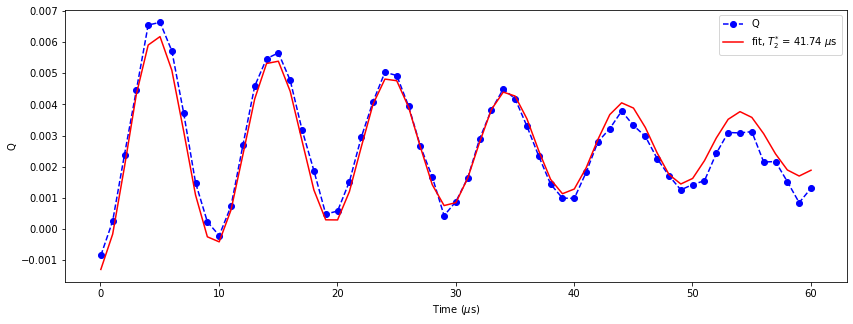

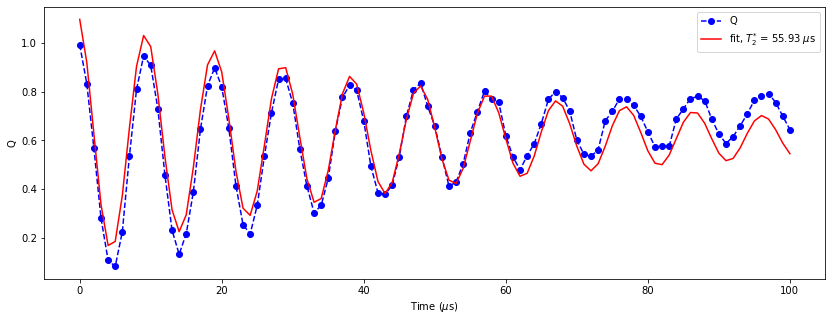

In [130]:
expt_name = 'ef_Ramsey_phase'
filelist = [10, 12]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        t = array(a['time'])
        ramsey_freq = array(a['ramsey_freq'])/1e6
        qubit_freq = array(a['qubit_freq'])/1e9
        
        fig, ax = plt.subplots(1, 1, figsize=(14,5))

        P = Q
        
        p = fitdecaysin(t[:], P[:],fitparams = None, showfit=False)
        ax.plot(t, P, 'bo--',label = 'Q')
        ax.plot(t[:], decaysin(np.append(p, 0), t[:]), 'r-', label=r'fit, $T_{2}^{*}$ = %.2f $\mu$s' % p[3])
        offset = ramsey_freq - p[1]
        nu_q_new = qubit_freq + offset/1e3
        print("Original qubit frequency choice =", qubit_freq,"GHz")
        print ("Oscillation freq = ", p[1]," MHz")
        print("Offset freq =", offset,"MHz")
        print("Suggested qubit frequency choice =", nu_q_new,"GHz")
        print("T2* =", p[3],"us")
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('Q')
        ax.legend()

## Storage Ramsey

Original qubit frequency choice = 5.965085584240055 GHz
Oscillation freq =  0.010012177839552936  MHz
Suggested qubit frequency choice = 5.965085572062215 GHz
T2* = 2344.2158750627573 us
Original qubit frequency choice = 5.965085584240055 GHz
Oscillation freq =  0.009971476265256757  MHz
Suggested qubit frequency choice = 5.965085612763789 GHz
T2* = 2392.8945617081986 us


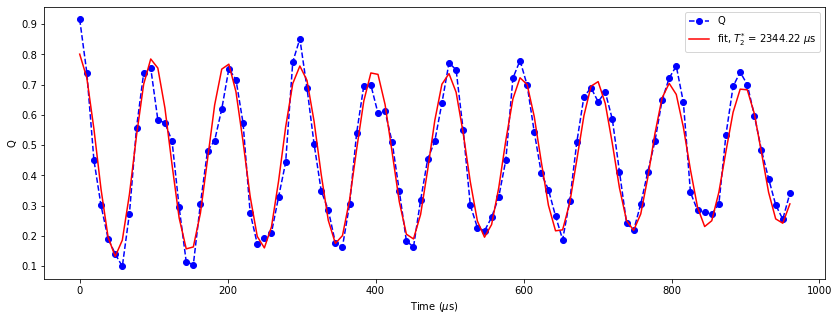

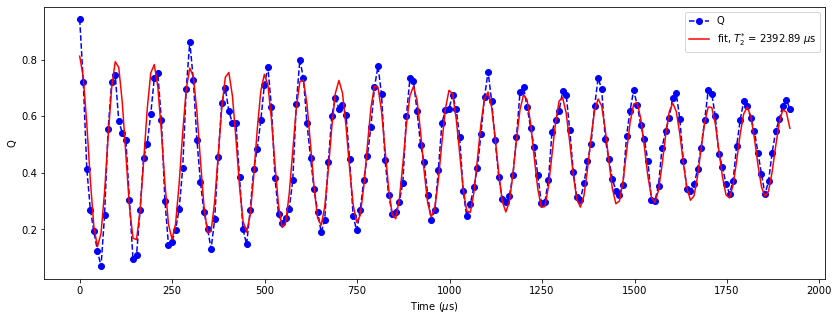

In [88]:
expt_name = 'storage_ramsey'
filelist = [14, 15]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        t = array(a['time'])
        ramsey_freq = array(a['ramsey_freq'])/1e9
        qubit_freq = array(a['cavity_freq'])/1e9
        
        fig, ax = plt.subplots(1, 1, figsize=(14,5))

        P = Q[:]
        t = t[:]
        
        p = fitdecaysin(t[:], P[:],fitparams = None, showfit=False)
        ax.plot(t, P, 'bo--',label = 'Q')
        ax.plot(t[:], decaysin(np.append(p, 0), t[:]), 'r-', label=r'fit, $T_{2}^{*}$ = %.2f $\mu$s' % p[3])
        drive_freq = qubit_freq[1] + ramsey_freq
        nu_q_new = drive_freq - p[1]/1e3
        print("Original qubit frequency choice =", qubit_freq[1],"GHz")
        print ("Oscillation freq = ", p[1]," MHz")
        print("Suggested qubit frequency choice =", nu_q_new,"GHz")
        print("T2* =", p[3],"us")
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('Q')
        ax.legend()

In [80]:
print(drive_freq)
q_new_1 = drive_freq - p[1]/1e3
q_new_2 = drive_freq + p[1]/1e3
print(q_new_1, q_new_2)

5.965110574799959
5.965095589364898 5.96512556023502


In [82]:
print(drive_freq)
q_new_1 = drive_freq - p[1]/1e3
q_new_2 = drive_freq + p[1]/1e3
print(q_new_1, q_new_2)

5.965105589364898
5.965085584240055 5.965125594489741


Original qubit frequency choice = 6.011215233526263 GHz
Oscillation freq =  1.9738723844004882  MHz
Offset freq = -1.9638723844004882 MHz
Suggested qubit frequency choice = 6.009251361141863 GHz
T2* = 1139.6644645525134 us


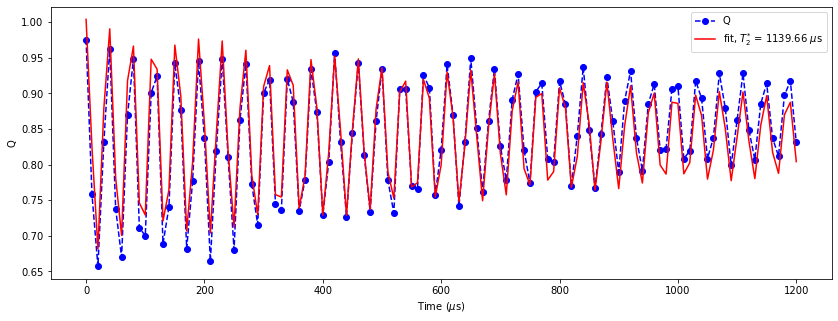

In [147]:
expt_name = 'storage_ramsey'
filelist = [12]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        t = array(a['time'])
        ramsey_freq = array(a['ramsey_freq'])/1e6
        qubit_freq = array(a['cavity_freq'])/1e9
        
        fig, ax = plt.subplots(1, 1, figsize=(14,5))

        P = Q[:]
        t = t[:]
        
        popt, pcov = curve_fit(decaysin_ramsey, t, P, p0=[0.6, 1, 1, 1, -0.3, 0])
        ax.plot(t, P, 'bo--',label = 'Q')
        ax.plot(t, decaysin_ramsey(t, *popt), 'r-', label=r'fit, $T_{2}^{*}$ = %.2f $\mu$s' % popt[3])
        offset = ramsey_freq - popt[1]
        nu_q_new = qubit_freq + offset/1e3
        print("Original qubit frequency choice =", qubit_freq,"GHz")
        print ("Oscillation freq = ", popt[1]," MHz")
        print("Offset freq =", offset,"MHz")
        print("Suggested qubit frequency choice =", nu_q_new,"GHz")
        print("T2* =", popt[3],"us")
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('Q')
        ax.legend()

In [30]:
popt

array([-2.70741619e-01,  1.20803908e+00,  6.94842764e+01,  1.15343291e+03,
        6.52521634e-01,  1.81714756e+02])

In [141]:
offset = ramsey_freq - popt[1]

In [142]:
offset_err = np.sqrt(np.diag(pcov))[1]

In [143]:
cav_freq = qubit_freq - offset/1e3

cav_freq_err = offset_err/1e3

In [144]:
cav_freq, cav_freq_err

(6.013179105910663, 1.3775894171724657e-08)

In [20]:
np.sqrt(np.diag(pcov))

array([4.27502772e+04, 1.18763095e-05, 2.19748533e+00, 9.61479953e+01,
       3.37301416e-03, 1.81909381e+08])

In [22]:
popt[1], np.sqrt(np.diag(pcov))[1]

(1.2080390778233714, 1.1876309465644594e-05)

In [23]:
popt[3], np.sqrt(np.diag(pcov))[3]

(1153.4329131394793, 96.14799528634222)

## Storage-Qubit Chi

Original qubit frequency choice = 4.961402143769622 GHz
Oscillation freq =  118.69760978518151  MHz
Suggested qubit frequency choice = 4.84273453398444 GHz
T2* = 19498.528905539144 us


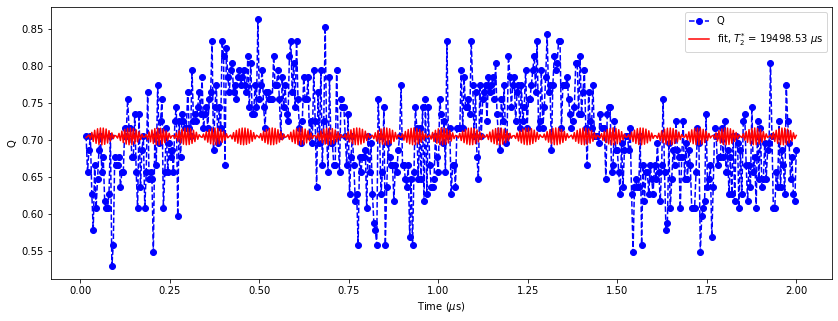

In [43]:
expt_name = 'storage_qubit_chi_ramsey'
filelist = [10]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        t = array(a['time'])
        ramsey_freq = array(a['ramsey_freq'])/1e9
        qubit_freq = array(a['qubit_freq'])/1e9
        two_chi = array(a['two_chi'])/1e6
        
        fig, ax = plt.subplots(1, 1, figsize=(14,5))

        P = Q[:]
        t = t[:]
        p = fitdecaysin(t[:], P[:],fitparams = None, showfit=False)
        ax.plot(t, P, 'bo--',label = 'Q')
        ax.plot(t[:], decaysin(np.append(p, 0), t[:]), 'r-', label=r'fit, $T_{2}^{*}$ = %.2f $\mu$s' % p[3])
        drive_freq = qubit_freq + ramsey_freq
        nu_q_new = drive_freq - p[1]/1e3
        print("Original qubit frequency choice =", qubit_freq,"GHz")
        print ("Oscillation freq = ", p[1]," MHz")
#         print("Offset freq =", offset,"MHz")
        print("Suggested qubit frequency choice =", nu_q_new,"GHz")
        print("T2* =", p[3],"us")
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('Q')
        ax.legend()

In [309]:
(nu_q_new - qubit_freq)*1e3

-1.270794064743619

In [305]:
ramsey_freq

3e-05

# Ramsey with echo

Original qubit frequency choice = 4.961404483725386 GHz
Oscillation freq =  0.049971394718583334  MHz
Offset freq = 2.8605281416668737e-05 MHz
Suggested qubit frequency choice = 4.961404512330668 GHz
T2* = 244.4356059573633 us


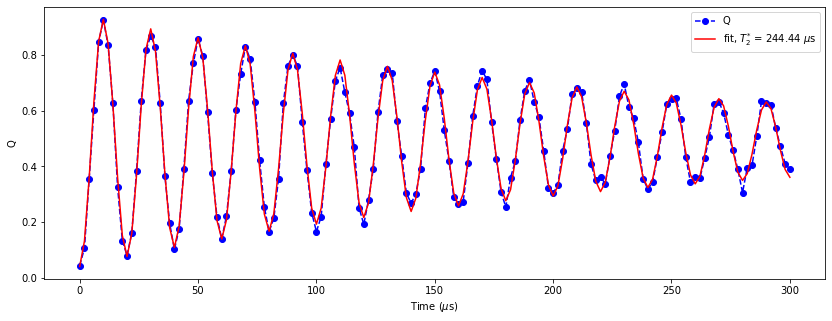

In [1634]:
expt_name = 'Ramsey_phase_echo'
filelist = [49]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        t = array(a['time'])
        ramsey_freq = array(a['ramsey_freq'])/1e6
        qubit_freq = array(a['qubit_freq'][0])/1e9
        
        fig, ax = plt.subplots(1, 1, figsize=(14,5))

        P = Q
        
        p = fitdecaysin(t[:], P[:],fitparams = None, showfit=False)
        ax.plot(t, P, 'bo--',label = 'Q')
        ax.plot(t[:], decaysin(np.append(p, 0), t[:]), 'r-', label=r'fit, $T_{2}^{*}$ = %.2f $\mu$s' % p[3])
        offset = ramsey_freq - p[1]
        nu_q_new = qubit_freq + offset/1e3
        print("Original qubit frequency choice =", qubit_freq,"GHz")
        print ("Oscillation freq = ", p[1]," MHz")
        print("Offset freq =", offset,"MHz")
        print("Suggested qubit frequency choice =", nu_q_new,"GHz")
        print("T2* =", p[3],"us")
        ax.set_xlabel('Time ($\mu$s)')
        ax.set_ylabel('Q')
        ax.legend()
        plt.show()

# Qubit Temperature

[-0.53685461  0.75846446 80.4144777   2.24930987  0.5845364 ]
[-3.10903034e-03  4.44719612e+01 -1.02854716e+02  1.19516528e+00
  9.55242461e-01]
ge contrast ratio =  0.005791196178623676
Qubit Temp: 40.031624778098156  mK
Qubit Excited State Occupation: 0.005757851331992757


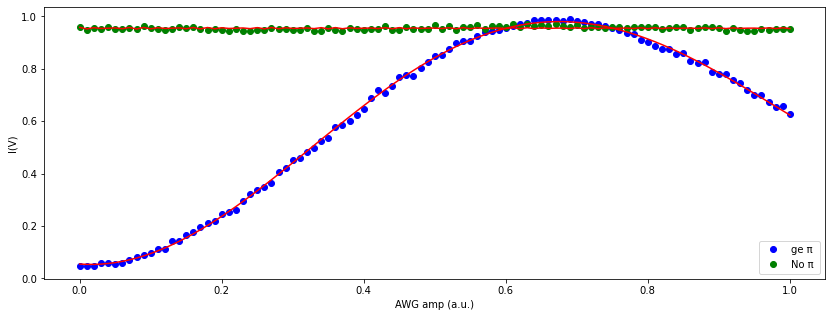

In [135]:
expt_name = 'qubit_temp'
filelist = [19]

#12 - with active reset
#13- without active reset

def temperature_q(nu, rat):
    Kb = 1.38e-23
    h = 6e-34
    return h*nu/(Kb*log(1/rat))

def occupation_q(nu,T):
    Kb = 1.38e-23
    h = 6e-34
    T = T*1e-3
    return 1/(exp(h*nu/(Kb*T))+1)

q_pop = []

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        Ie = array(a['Ie'])
        Qe = array(a['Qe'])
        Ig = array(a['Ig'])
        Qg = array(a['Qg'])

        x = array(a['amps'])
        
        fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(14,5))
        axs.plot(x, Qg,'bo',label = 'ge π ')
        axs.plot(x, Qe,'go',label = 'No π ')        
        axs.set_xlabel('AWG amp (a.u.)')
        axs.set_ylabel('I(V)')
        axs.legend()
        pg = fitdecaysin(x, Qg, showfit=False)
        print(pg)
        axs.plot(x, decaysin(np.append(pg, 0), x), 'r')
        pe = fitdecaysin(x, Qe, showfit=False)
        print(pe)
        axs.plot(x, decaysin(np.append(pe, 0), x), 'r')
        
        contrast_g = pg[0]
        contrast_e = pe[0]
#         axs.set_ylim(-0.003, -0.0025)
    nu_q = 4.743050086880381
    ratio = abs(contrast_e/contrast_g)
    print ("ge contrast ratio = ", ratio)
    print ("Qubit Temp:" , 1e3*temperature_q(nu_q*1e9,ratio)," mK" )
    print ("Qubit Excited State Occupation:" , occupation_q(nu_q, 1e3*temperature_q(nu_q,ratio)))
    q_pop.append(occupation_q(nu_q, 1e3*temperature_q(nu_q, ratio)))

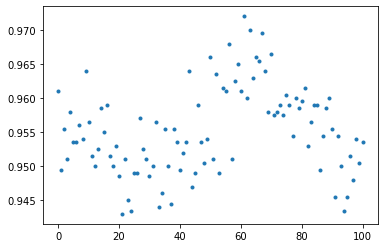

In [136]:
plt.plot(Qe, '.')

## Storage temperature

[  0.45782024  61.7436987  -91.31257      3.51510276   0.48346912]
[-1.36929300e-03  7.71912139e+01  4.39539311e+00  7.84927898e+00
  2.47197850e-02]
ge contrast ratio =  0.002990896574286953
Storage mode 2 Temp: 44.6220614098541  mK
Storage mode 2 Occupation: 0.0029819777871388006
[  0.45706482  61.64608217 -91.14115268   6.35043911   0.48081215]
[-1.68843903e-03  6.61623534e+01  4.61459855e+01  6.97841845e-02
  2.05461005e-02]
ge contrast ratio =  0.003694090990336149
Storage mode 2 Temp: 46.304335674656535  mK
Storage mode 2 Occupation: 0.003680494907259265


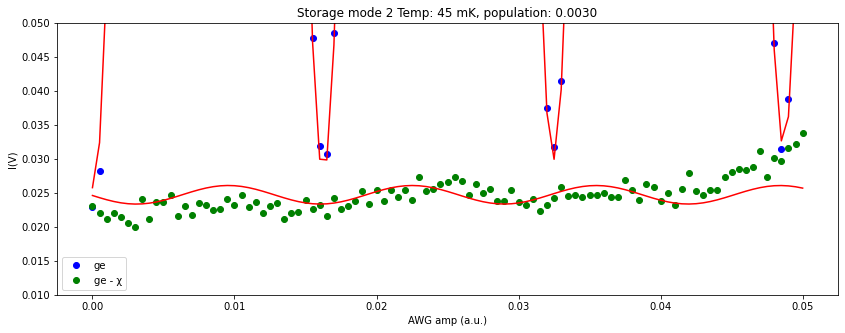

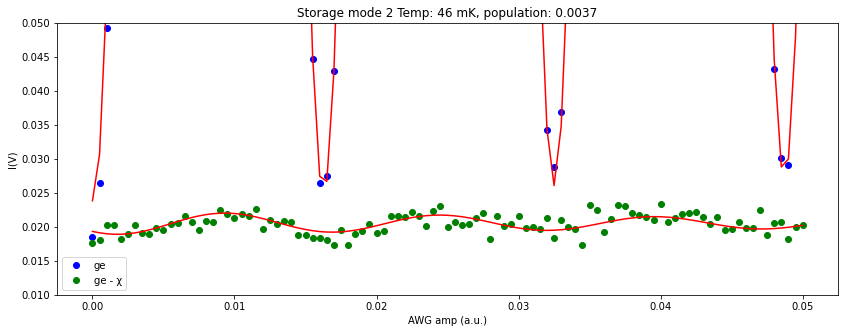

In [5]:
expt_name = 'storage_temp'
filelist = [12, 13]
# upto 12 - mode 2
#13 is mode 0

def temperature_q(nu, rat):
    Kb = 1.38e-23
    h = 6e-34
    return h*nu/(Kb*log(1/rat))

def occupation_q(nu,T):
    Kb = 1.38e-23
    h = 6e-34
    T = T*1e-3
    return 1/(exp(h*nu/(Kb*T))+1)

q_pop = []

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        Ie = array(a['Ie'])
        Qe = array(a['Qe'])
        Ig = array(a['Ig'])
        Qg = array(a['Qg'])
        x = array(a['amps'])
        
    fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(14,5))
    axs.plot(x, Qg,'bo',label = 'ge')
    axs.plot(x, Qe,'go',label = 'ge - χ')        
    axs.set_xlabel('AWG amp (a.u.)')
    axs.set_ylabel('I(V)')
    axs.legend()
    pg = fitdecaysin(x[:], Qg[:], showfit=False)
    print(pg)
    axs.plot(x, decaysin(np.append(pg, 0), x), 'r')
    pe = fitdecaysin(x[:], Qe[:], showfit=False)
    print(pe)
    axs.plot(x, decaysin(np.append(pe, 0), x), 'r')

    contrast_g = pg[0]
    contrast_e = pe[0]
    axs.set_ylim(0.01, 0.05)
    nu_q = 5.965085549955351*1e9
    ratio = abs(contrast_e/contrast_g)
    print ("ge contrast ratio = ", ratio)
    print ("Storage mode 2 Temp:" , 1e3*temperature_q(nu_q, ratio)," mK" )
    print ("Storage mode 2 Occupation:" , occupation_q(nu_q, 1e3*temperature_q(nu_q, ratio)))
    q_pop.append(occupation_q(nu_q, 1e3*temperature_q(nu_q, ratio)))
    cav_temp = 1e3*temperature_q(nu_q, ratio)
    cav_pop = occupation_q(nu_q, 1e3*temperature_q(nu_q, ratio))
    axs.set_title("Storage mode 2 Temp: %.f mK, population: %.4f"%(cav_temp, cav_pop))

In [5]:
pg[0], pe[0]

(0.4542207338964488, -0.004948378546683755)

In [6]:
pg

array([  0.45422073,  61.3665268 , -91.00879452,   2.30751693,
         0.47158486])

# Histogram

## Square

C:\ProgramData\Miniconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
<ipython-input-2-5e734f8802e0>:212: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


Optimal fidelity after rotation = 0.905


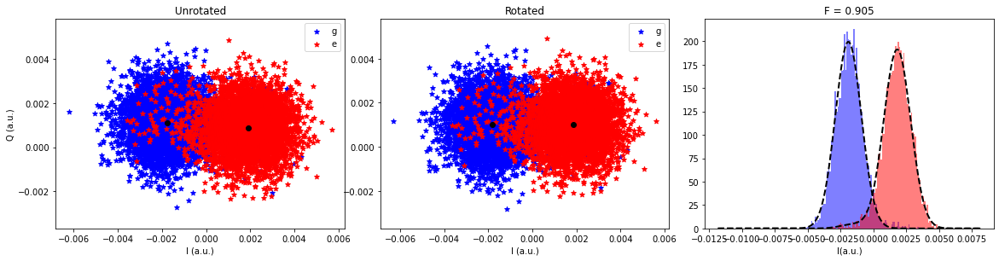

In [275]:
expt_name = 'histogram'
filelist = [172]

for ii, i in enumerate(filelist[::-1]):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"
    fid, angle = hist(filename, data=None,  plot=True, ran=0.01)
    print('Optimal fidelity after rotation = %.3f'%fid)

### Amp sweep

(55000,)


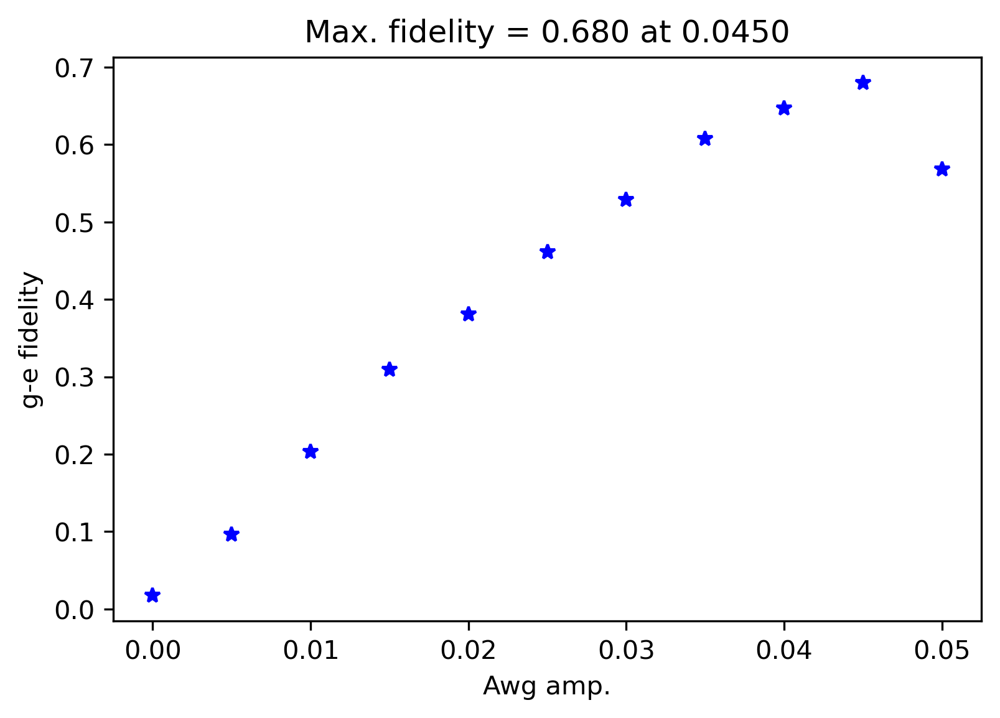

In [185]:
expt_name = 'histogram_amp_sweep'
filelist = [23]
#7 - 3us long pulse
for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        
        Ig = array(a['ig'])
        Qg = array(a['qg'])
        Ie = array(a['ie'])
        Qe = array(a['qe'])
        amp = array(a['amp'])
        print(shape(Ig))
        a.close()
        
    Ig = pd.DataFrame(Ig)
    Qg = pd.DataFrame(Qg)
    Ie = pd.DataFrame(Ie)
    Qe = pd.DataFrame(Qe)
    
    fid_f_p = []
    """The sweep occurs in the following order: for a fixed readout frequency, the power is swept
        and then to next readout frequency. So, the data is arranged such that first len(attens) rows correspond to
        one readout frequency.  
        """
    avgs = 5000
    for ii in range(len(amp)):
        """Select all the rows corresponding to the same readout power"""
        a, b = Ig.iloc[ii*avgs: (ii+1)*avgs], Qg.iloc[ii*avgs: (ii+1)*avgs]
        c, d = Ie.iloc[ii*avgs: (ii+1)*avgs], Qe.iloc[ii*avgs: (ii+1)*avgs]
        data = [a, b, c, d]
        fid, angle = hist(filename=None, data=data, plot=False, ran=0.05)
        fid_f_p.append(fid)

    plt.figure(dpi=300)
    plt.plot(amp, fid_f_p, 'b*')
    plt.title('Max. fidelity = %.3f at %.4f'%(max(fid_f_p), amp[np.argmax(fid_f_p)]))
    plt.xlabel('Awg amp.')
    plt.ylabel('g-e fidelity')
    plt.show()

0.045 0.6796


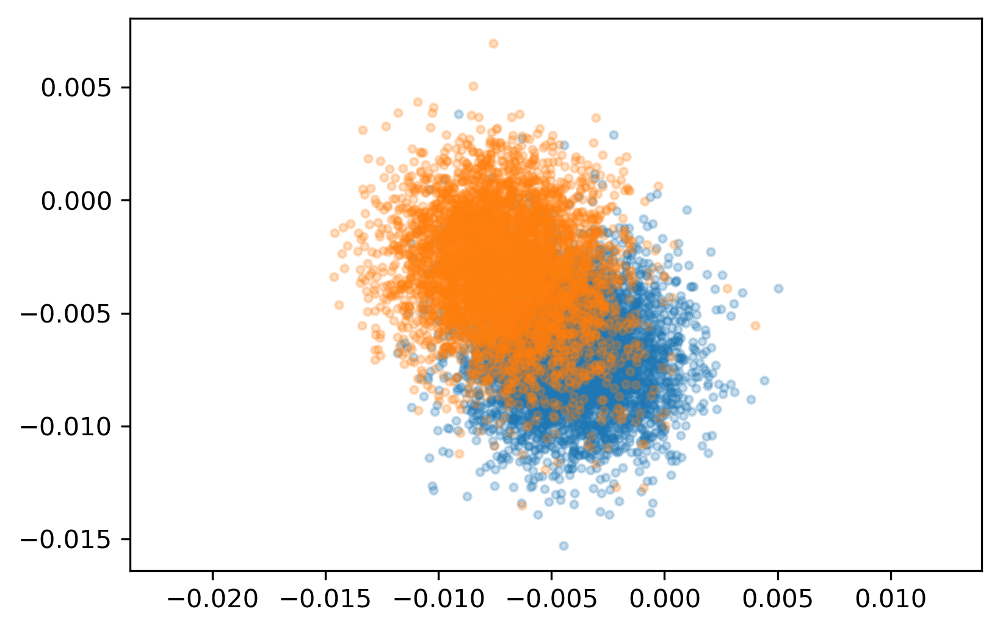

In [186]:
ii = np.argmax(fid_f_p)
ii = np.argmin(abs(np.array(fid_f_p)-0.75))
print(amp[ii], fid_f_p[ii])
a, b = np.array(Ig.iloc[ii*avgs: (ii+1)*avgs]), np.array(Qg.iloc[ii*avgs: (ii+1)*avgs])
c, d = np.array(Ie.iloc[ii*avgs: (ii+1)*avgs]), np.array(Qe.iloc[ii*avgs: (ii+1)*avgs])

plt.figure(dpi=300)
plt.plot(a, b, '.', alpha=0.25)
plt.plot(c, d, '.', alpha=0.25)
plt.axis('equal')
plt.show()

### Freq sweep

(105000,)


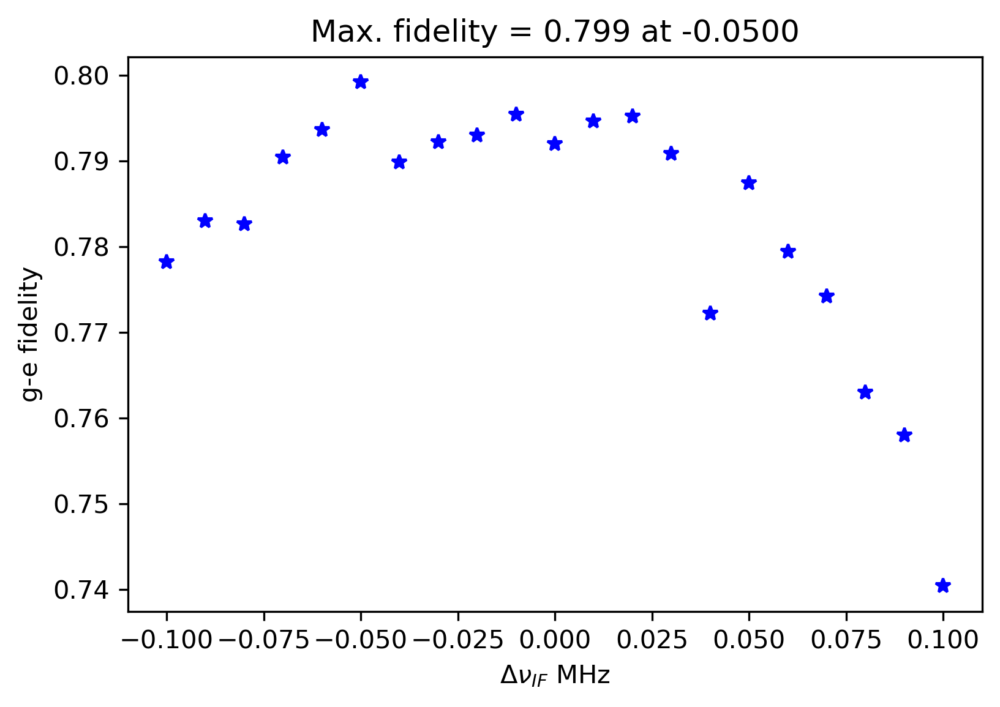

0.7992


In [187]:
expt_name = 'histogram_freq_sweep'
filelist = [3]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        
        Ig = array(a['ig'])
        Qg = array(a['qg'])
        Ie = array(a['ie'])
        Qe = array(a['qe'])
        freq = array(a['freq'])/1e6
        print(shape(Ig))
        a.close()
        
    Ig = pd.DataFrame(Ig)
    Qg = pd.DataFrame(Qg)
    Ie = pd.DataFrame(Ie)
    Qe = pd.DataFrame(Qe)
    
    fid_f_p = []
    """The sweep occurs in the following order: for a fixed readout frequency, the power is swept
        and then to next readout frequency. So, the data is arranged such that first len(attens) rows correspond to
        one readout frequency.  
        """
    avgs = 5000
    for ii in range(len(freq)):
        """Select all the rows corresponding to the same readout power"""
        a, b = Ig.iloc[ii*avgs: (ii+1)*avgs], Qg.iloc[ii*avgs: (ii+1)*avgs]
        c, d = Ie.iloc[ii*avgs: (ii+1)*avgs], Qe.iloc[ii*avgs: (ii+1)*avgs]
        data = [a, b, c, d]
        fid, angle = hist(filename=None, data=data, plot=False, ran=0.05)
        fid_f_p.append(fid)

plt.figure(dpi=300)
plt.plot(freq, fid_f_p, 'b*')
plt.title('Max. fidelity = %.3f at %.4f'%(max(fid_f_p), freq[np.argmax(fid_f_p)]))
plt.xlabel(r'$\Delta \nu_{IF}$ MHz')
plt.ylabel('g-e fidelity')
plt.show()
print(max(fid_f_p))

### JPA amp sweep

(105000,)


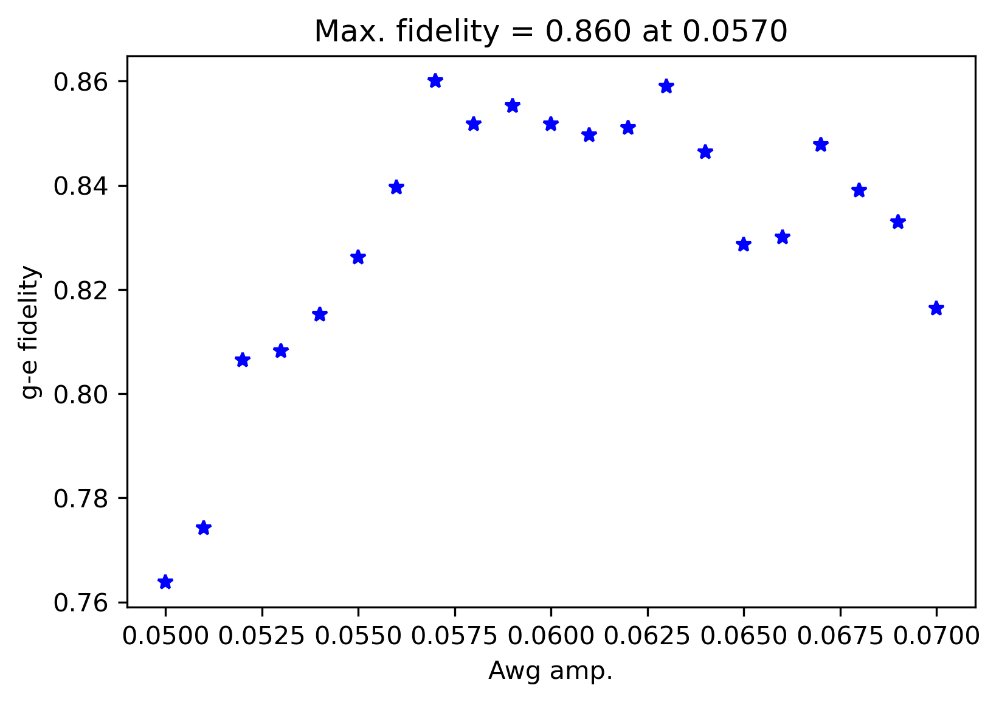

In [202]:
expt_name = 'histogram_jpa_amp_sweep'
filelist = [15]
#7 - 3us long pulse
for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        
        Ig = array(a['ig'])
        Qg = array(a['qg'])
        Ie = array(a['ie'])
        Qe = array(a['qe'])
        amp = array(a['amp'])
        print(shape(Ig))
        a.close()
        
    Ig = pd.DataFrame(Ig)
    Qg = pd.DataFrame(Qg)
    Ie = pd.DataFrame(Ie)
    Qe = pd.DataFrame(Qe)
    
    fid_f_p = []
    """The sweep occurs in the following order: for a fixed readout frequency, the power is swept
        and then to next readout frequency. So, the data is arranged such that first len(attens) rows correspond to
        one readout frequency.  
        """
    avgs = 5000
    for ii in range(len(amp)):
        """Select all the rows corresponding to the same readout power"""
        a, b = Ig.iloc[ii*avgs: (ii+1)*avgs], Qg.iloc[ii*avgs: (ii+1)*avgs]
        c, d = Ie.iloc[ii*avgs: (ii+1)*avgs], Qe.iloc[ii*avgs: (ii+1)*avgs]
        data = [a, b, c, d]
        fid, angle = hist(filename=None, data=data, plot=False, ran=0.2)
        fid_f_p.append(fid)

    plt.figure(dpi=300)
    plt.plot(amp, fid_f_p, 'b*')
    plt.title('Max. fidelity = %.3f at %.4f'%(max(fid_f_p), amp[np.argmax(fid_f_p)]))
    plt.xlabel('Awg amp.')
    plt.ylabel('g-e fidelity')
    plt.show()

0.05 0.7638


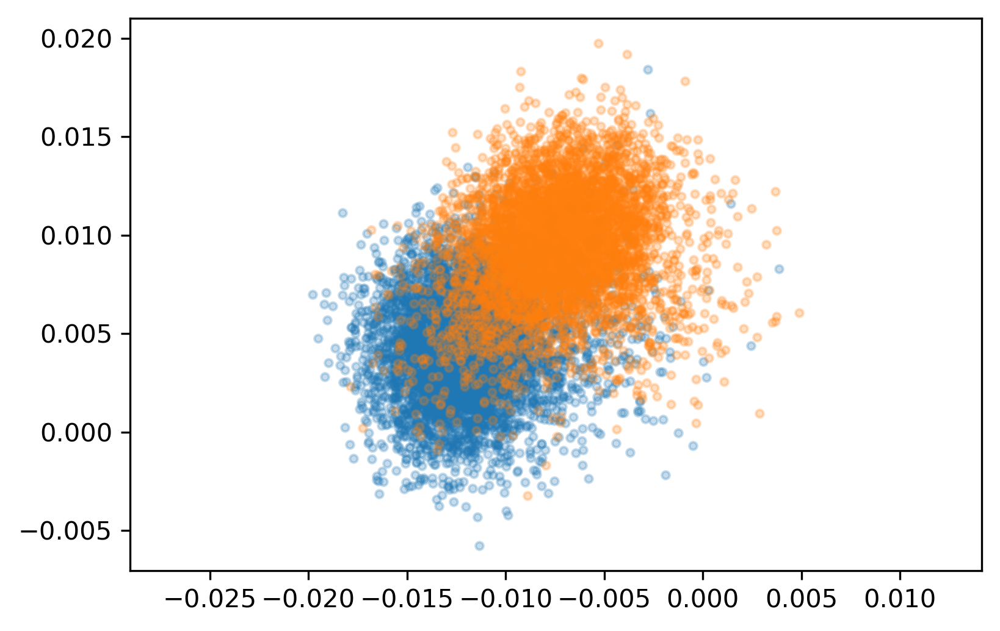

In [203]:
ii = np.argmax(fid_f_p)
ii = np.argmin(abs(np.array(fid_f_p)-0.75))
print(amp[ii], fid_f_p[ii])
a, b = np.array(Ig.iloc[ii*avgs: (ii+1)*avgs]), np.array(Qg.iloc[ii*avgs: (ii+1)*avgs])
c, d = np.array(Ie.iloc[ii*avgs: (ii+1)*avgs]), np.array(Qe.iloc[ii*avgs: (ii+1)*avgs])

plt.figure(dpi=300)
plt.plot(a, b, '.', alpha=0.25)
plt.plot(c, d, '.', alpha=0.25)
plt.axis('equal')
plt.show()

### JPA freq sweep

(105000,)


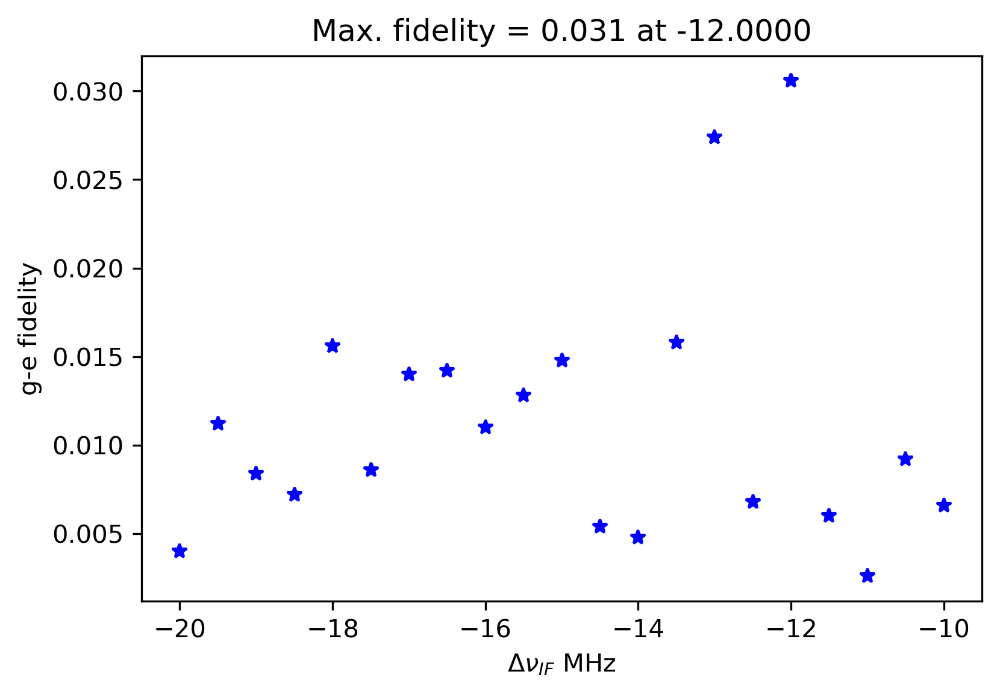

0.0306


In [211]:
expt_name = 'histogram_jpa_freq_sweep'
filelist = [3]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        
        Ig = array(a['ig'])
        Qg = array(a['qg'])
        Ie = array(a['ie'])
        Qe = array(a['qe'])
        freq = array(a['freq'])/1e6
        print(shape(Ig))
        a.close()
        
    Ig = pd.DataFrame(Ig)
    Qg = pd.DataFrame(Qg)
    Ie = pd.DataFrame(Ie)
    Qe = pd.DataFrame(Qe)
    
    fid_f_p = []
    """The sweep occurs in the following order: for a fixed readout frequency, the power is swept
        and then to next readout frequency. So, the data is arranged such that first len(attens) rows correspond to
        one readout frequency.  
        """
    avgs = 5000
    for ii in range(len(freq)):
        """Select all the rows corresponding to the same readout power"""
        a, b = Ig.iloc[ii*avgs: (ii+1)*avgs], Qg.iloc[ii*avgs: (ii+1)*avgs]
        c, d = Ie.iloc[ii*avgs: (ii+1)*avgs], Qe.iloc[ii*avgs: (ii+1)*avgs]
        data = [a, b, c, d]
        fid, angle = hist(filename=None, data=data, plot=False, ran=0.3)
        fid_f_p.append(fid)

    plt.figure(dpi=300)
    plt.plot(freq, fid_f_p, 'b*')
    plt.title('Max. fidelity = %.3f at %.4f'%(max(fid_f_p), freq[np.argmax(fid_f_p)]))
    plt.xlabel(r'$\Delta \nu_{IF}$ MHz')
    plt.ylabel('g-e fidelity')
    plt.show()
    print(max(fid_f_p))

In [ ]:
ii = np.argmax(fid_f_p)
ii = np.argmin(abs(np.array(fid_f_p)-0.75))
print(amp[ii], fid_f_p[ii])
a, b = np.array(Ig.iloc[ii*avgs: (ii+1)*avgs]), np.array(Qg.iloc[ii*avgs: (ii+1)*avgs])
c, d = np.array(Ie.iloc[ii*avgs: (ii+1)*avgs]), np.array(Qe.iloc[ii*avgs: (ii+1)*avgs])

plt.figure(dpi=300)
plt.plot(a, b, '.', alpha=0.25)
plt.plot(c, d, '.', alpha=0.25)
plt.axis('equal')
plt.show()

### JPA with rr amp sweep

(105000,)


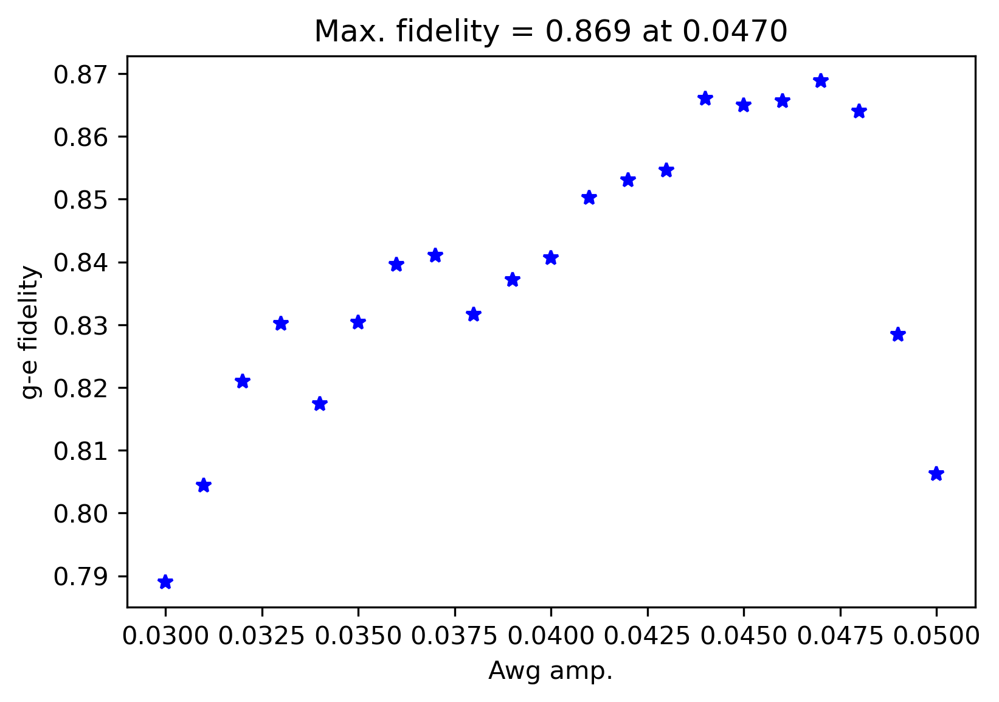

In [200]:
expt_name = 'histogram_amp_jpa_sweep'
filelist = [0]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        
        Ig = array(a['ig'])
        Qg = array(a['qg'])
        Ie = array(a['ie'])
        Qe = array(a['qe'])
        amp = array(a['amp'])
        print(shape(Ig))
        a.close()
        
    Ig = pd.DataFrame(Ig)
    Qg = pd.DataFrame(Qg)
    Ie = pd.DataFrame(Ie)
    Qe = pd.DataFrame(Qe)
    
    fid_f_p = []
    """The sweep occurs in the following order: for a fixed readout frequency, the power is swept
        and then to next readout frequency. So, the data is arranged such that first len(attens) rows correspond to
        one readout frequency.  
        """
    avgs = 5000
    for ii in range(len(amp)):
        """Select all the rows corresponding to the same readout power"""
        a, b = Ig.iloc[ii*avgs: (ii+1)*avgs], Qg.iloc[ii*avgs: (ii+1)*avgs]
        c, d = Ie.iloc[ii*avgs: (ii+1)*avgs], Qe.iloc[ii*avgs: (ii+1)*avgs]
        data = [a, b, c, d]
        fid, angle = hist(filename=None, data=data, plot=False, ran=0.2)
        fid_f_p.append(fid)

    plt.figure(dpi=300)
    plt.plot(amp, fid_f_p, 'b*')
    plt.title('Max. fidelity = %.3f at %.4f'%(max(fid_f_p), amp[np.argmax(fid_f_p)]))
    plt.xlabel('Awg amp.')
    plt.ylabel('g-e fidelity')
    plt.show()

0.03 0.789


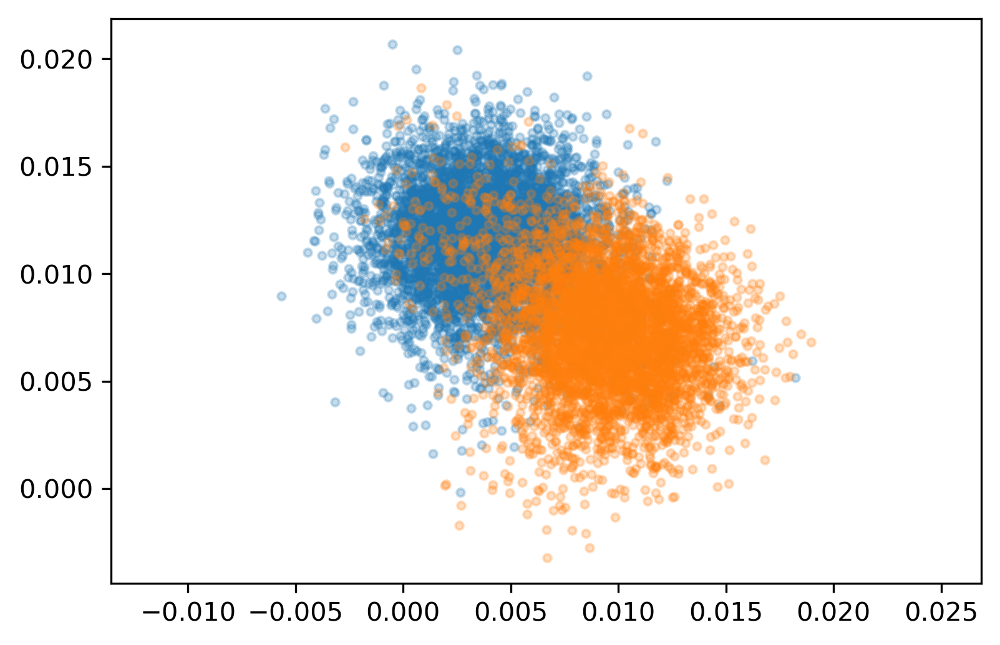

In [201]:
ii = np.argmax(fid_f_p)
ii = np.argmin(abs(np.array(fid_f_p)-0.75))
print(amp[ii], fid_f_p[ii])
a, b = np.array(Ig.iloc[ii*avgs: (ii+1)*avgs]), np.array(Qg.iloc[ii*avgs: (ii+1)*avgs])
c, d = np.array(Ie.iloc[ii*avgs: (ii+1)*avgs]), np.array(Qe.iloc[ii*avgs: (ii+1)*avgs])

plt.figure(dpi=300)
plt.plot(a, b, '.', alpha=0.25)
plt.plot(c, d, '.', alpha=0.25)
plt.axis('equal')
plt.show()

### rr amp and jpa amp sweep

(275000,)
25 0.7752


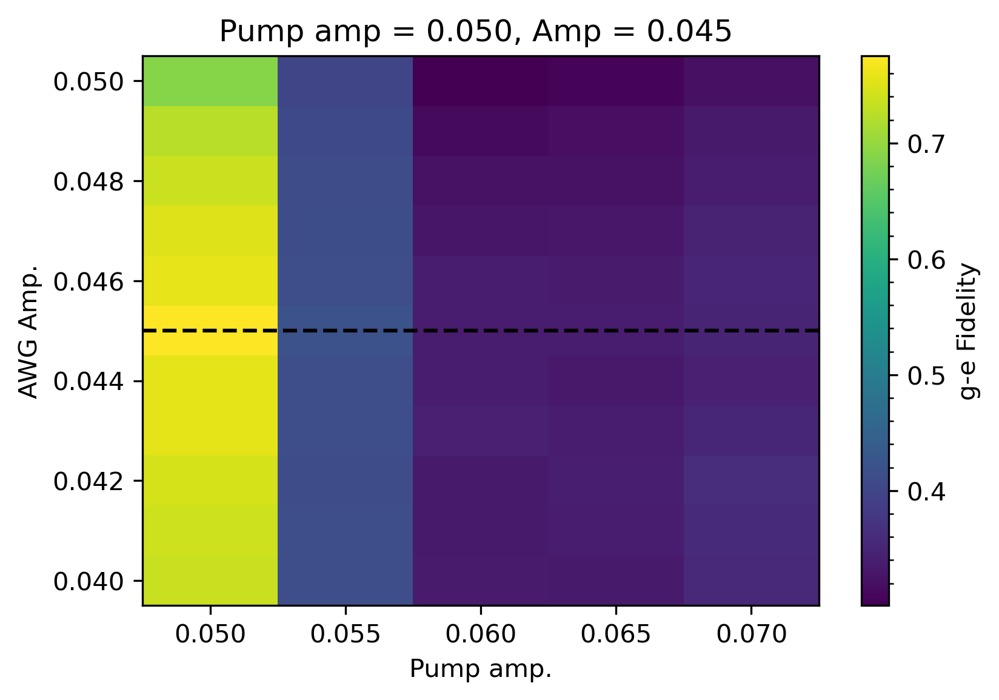

In [197]:
expt_name = 'histogram_jpa_rr_amp_sweep'
filelist = [2]
#1- 3us long
for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        
        Ig = array(a['ig'])
        Qg = array(a['qg'])
        Ie = array(a['ie'])
        Qe = array(a['qe'])
        amp = array(a['amp'])
        pamp = array(a['pamp'])
        print(shape(Ig))
        a.close()
        
    Ig = pd.DataFrame(Ig)
    Qg = pd.DataFrame(Qg)
    Ie = pd.DataFrame(Ie)
    Qe = pd.DataFrame(Qe)
    
    fid_f_p = []
    """The sweep occurs in the following order: for a fixed readout frequency, the power is swept
        and then to next readout frequency. So, the data is arranged such that first len(attens) rows correspond to
        one readout frequency.  
        """
    avgs = 5000
    for ii in range(len(amp)):
        """Select all the rows corresponding to the same readout power"""
        ig, qg = Ig.iloc[ii*len(pamp)*avgs: (ii+1)*len(pamp)*avgs], Qg.iloc[ii*len(pamp)*avgs: (ii+1)*len(pamp)*avgs]
        ie, qe = Ie.iloc[ii*len(pamp)*avgs: (ii+1)*len(pamp)*avgs], Qe.iloc[ii*len(pamp)*avgs: (ii+1)*len(pamp)*avgs]
        fid_freq = []
        """For the same readout power, compute the g|e fidelity corresponding to each readout frequency"""
        for jj in range(len(pamp)):
            a = ig.iloc[jj:(jj+1)*avgs]
            b = qg.iloc[jj:(jj+1)*avgs]
            c = ie.iloc[jj:(jj+1)*avgs]
            d = qe.iloc[jj:(jj+1)*avgs]
            data = [a, b, c, d]
            fid, angle = hist(filename=None, data=data, plot=False, ran=0.2)
            fid_freq.append(fid)
        fid_f_p.append(fid_freq)
        
        
    ind = np.argmax(fid_f_p)
    fid_max = np.max(fid_f_p)
    print(ind, fid_max)

    plt.figure(dpi=300)
    plt.pcolormesh(pamp, amp, fid_f_p, shading='auto')
    cbar = plt.colorbar()
    cbar.minorticks_on()
    cbar.set_label('g-e Fidelity')
    plt.title(r'Pump amp = %.3f, Amp = %.3f '%(pamp[ind%len(pamp)], amp[ind//len(pamp)]))
    plt.xlabel(r'Pump amp.')
    plt.ylabel('AWG Amp.')
#     plt.axvline(x = pamp[ind%len(pamp)]/1e6, linestyle='--', color='k')
    plt.axhline(y = amp[ind//len(pamp)], linestyle='--', color='k')
    plt.show()

### Freq and amp sweep

In [ ]:
expt_name = 'histogram_freq_amp_sweep'
filelist = [13]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        
        Ig = array(a['ig'])
        Qg = array(a['qg'])
        Ie = array(a['ie'])
        Qe = array(a['qe'])
        attens = array(a['amp'])
        freqs = array(a['freq'])
        print(shape(Ig))
        a.close()
        
    Ig = pd.DataFrame(Ig)
    Qg = pd.DataFrame(Qg)
    Ie = pd.DataFrame(Ie)
    Qe = pd.DataFrame(Qe)
    
    fid_f_p = []
    """The sweep occurs in the following order: for a fixed readout frequency, the power is swept
        and then to next readout frequency. So, the data is arranged such that first len(attens) rows correspond to
        one readout frequency.  
        """
    avgs = 5000
    for ii in range(len(attens)):
        """Select all the rows corresponding to the same readout power"""
        ig, qg = Ig.iloc[ii*len(freqs)*avgs: (ii+1)*len(freqs)*avgs], Qg.iloc[ii*len(freqs)*avgs: (ii+1)*len(freqs)*avgs]
        ie, qe = Ie.iloc[ii*len(freqs)*avgs: (ii+1)*len(freqs)*avgs], Qe.iloc[ii*len(freqs)*avgs: (ii+1)*len(freqs)*avgs]
        fid_freq = []
        """For the same readout power, compute the g|e fidelity corresponding to each readout frequency"""
        for jj in range(len(freqs)):
            a = ig.iloc[jj:(jj+1)*avgs]
            b = qg.iloc[jj:(jj+1)*avgs]
            c = ie.iloc[jj:(jj+1)*avgs]
            d = qe.iloc[jj:(jj+1)*avgs]
            data = [a, b, c, d]
            fid, angle = hist(filename=None, data=data, plot=False, ran=0.05)
            fid_freq.append(fid)
        fid_f_p.append(fid_freq)
        
    ind = np.argmax(fid_f_p)
    fid_max = np.max(fid_f_p)
    print(ind, fid_max)

    plt.figure(dpi=300)
    plt.pcolormesh(freqs/1e6, attens, fid_f_p, shading='auto')
    cbar = plt.colorbar()
    cbar.minorticks_on()
    cbar.set_label('g-e Fidelity')
    plt.title(r'$\nu$ = %.3f MHz, Amp = %.3f '%(freqs[ind%len(freqs)]/1e6, attens[ind//len(freqs)]))
    plt.xlabel(r'$\Delta \nu_{IF}$ MHz')
    plt.ylabel('AWG Amp.')
    plt.axvline(x = freqs[ind%len(freqs)]/1e6, linestyle='--', color='k')
    plt.axhline(y = attens[ind//len(freqs)], linestyle='--', color='k')
    plt.show()

In [ ]:
plt.plot(np.array(a), np.array(b), '.')
plt.plot(np.array(c), np.array(d), '.')

## Optimal

###  Amp sweep

(80000,)


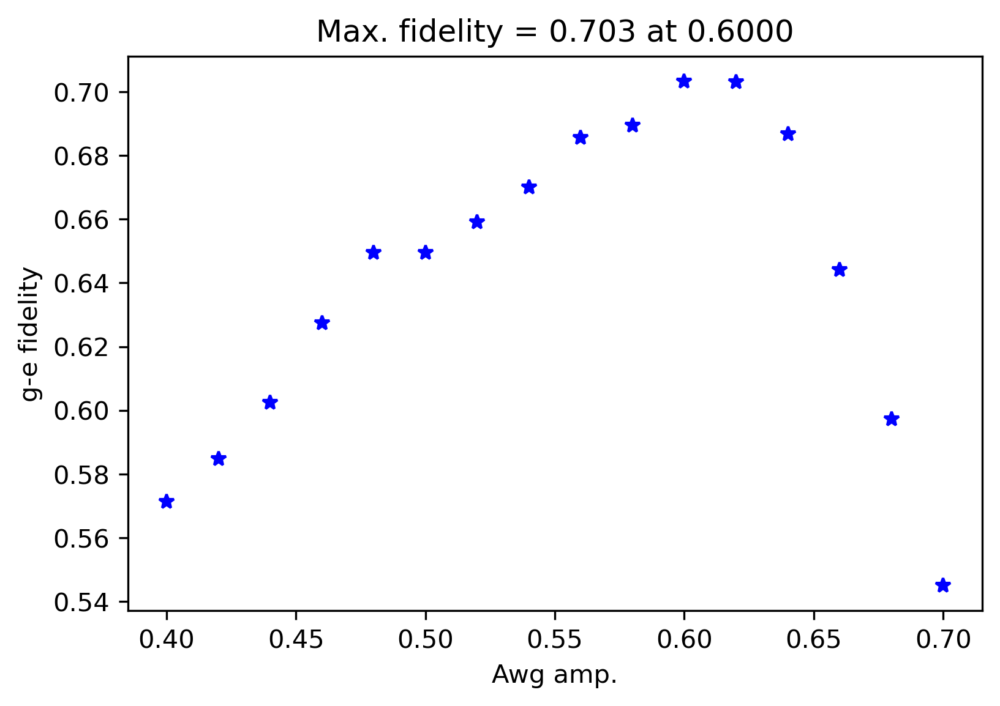

In [219]:
expt_name = 'histogram_clear_amp_sweep'
filelist = [13]
#7 - 3us long pulse
for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        
        Ig = array(a['ig'])
        Qg = array(a['qg'])
        Ie = array(a['ie'])
        Qe = array(a['qe'])
        amp = array(a['amp'])
        print(shape(Ig))
        a.close()
        
    Ig = pd.DataFrame(Ig)
    Qg = pd.DataFrame(Qg)
    Ie = pd.DataFrame(Ie)
    Qe = pd.DataFrame(Qe)
    
    fid_f_p = []
    """The sweep occurs in the following order: for a fixed readout frequency, the power is swept
        and then to next readout frequency. So, the data is arranged such that first len(attens) rows correspond to
        one readout frequency.  
        """
    avgs = 5000
    for ii in range(len(amp)):
        """Select all the rows corresponding to the same readout power"""
        a, b = Ig.iloc[ii*avgs: (ii+1)*avgs], Qg.iloc[ii*avgs: (ii+1)*avgs]
        c, d = Ie.iloc[ii*avgs: (ii+1)*avgs], Qe.iloc[ii*avgs: (ii+1)*avgs]
        data = [a, b, c, d]
        fid, angle = hist(filename=None, data=data, plot=False, ran=0.2)
        fid_f_p.append(fid)

    plt.figure(dpi=300)
    plt.plot(amp, fid_f_p, 'b*')
    plt.title('Max. fidelity = %.3f at %.4f'%(max(fid_f_p), amp[np.argmax(fid_f_p)]))
    plt.xlabel('Awg amp.')
    plt.ylabel('g-e fidelity')
    plt.show()

0.6000000000000002 0.7032


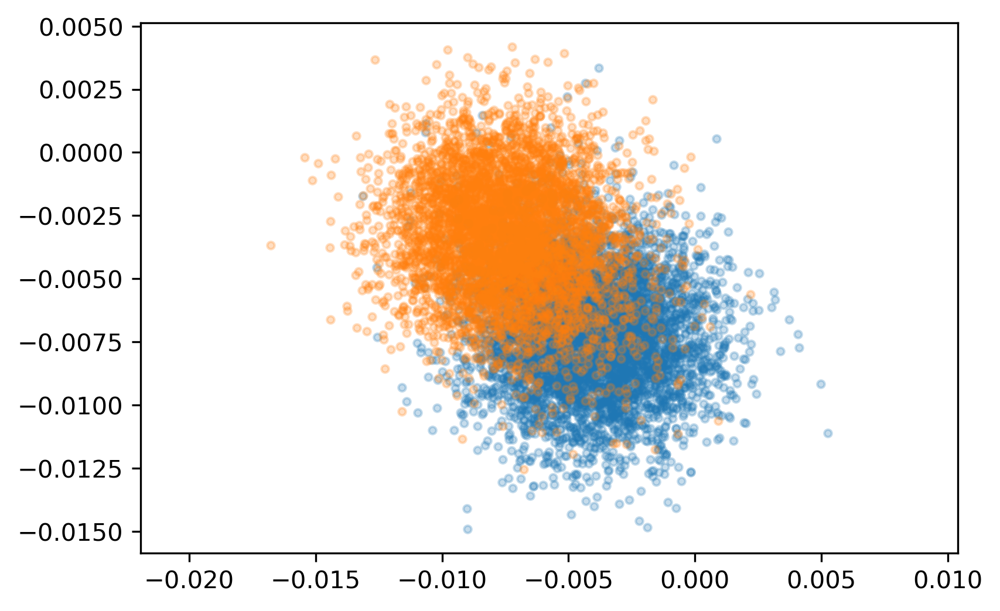

In [220]:
ii = np.argmax(fid_f_p)
ii = np.argmin(abs(np.array(fid_f_p)-0.75))
print(amp[ii], fid_f_p[ii])
a, b = np.array(Ig.iloc[ii*avgs: (ii+1)*avgs]), np.array(Qg.iloc[ii*avgs: (ii+1)*avgs])
c, d = np.array(Ie.iloc[ii*avgs: (ii+1)*avgs]), np.array(Qe.iloc[ii*avgs: (ii+1)*avgs])

plt.figure(dpi=300)
plt.plot(a, b, '.', alpha=0.25)
plt.plot(c, d, '.', alpha=0.25)
plt.axis('equal')
plt.show()

### JPA Amp sweep

(105000,)


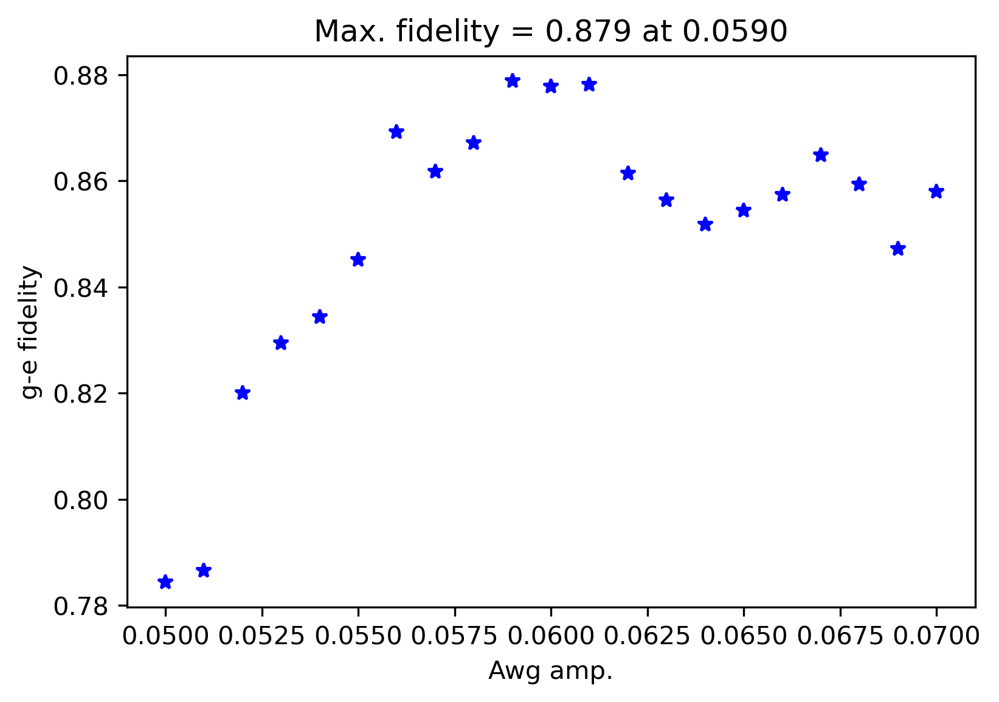

In [214]:
expt_name = 'histogram_clear_jpa_amp_sweep'
filelist = [0]
#7 - 3us long pulse
for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        
        Ig = array(a['ig'])
        Qg = array(a['qg'])
        Ie = array(a['ie'])
        Qe = array(a['qe'])
        amp = array(a['amp'])
        print(shape(Ig))
        a.close()
        
    Ig = pd.DataFrame(Ig)
    Qg = pd.DataFrame(Qg)
    Ie = pd.DataFrame(Ie)
    Qe = pd.DataFrame(Qe)
    
    fid_f_p = []
    """The sweep occurs in the following order: for a fixed readout frequency, the power is swept
        and then to next readout frequency. So, the data is arranged such that first len(attens) rows correspond to
        one readout frequency.  
        """
    avgs = 5000
    for ii in range(len(amp)):
        """Select all the rows corresponding to the same readout power"""
        a, b = Ig.iloc[ii*avgs: (ii+1)*avgs], Qg.iloc[ii*avgs: (ii+1)*avgs]
        c, d = Ie.iloc[ii*avgs: (ii+1)*avgs], Qe.iloc[ii*avgs: (ii+1)*avgs]
        data = [a, b, c, d]
        fid, angle = hist(filename=None, data=data, plot=False, ran=0.2)
        fid_f_p.append(fid)

    plt.figure(dpi=300)
    plt.plot(amp, fid_f_p, 'b*')
    plt.title('Max. fidelity = %.3f at %.4f'%(max(fid_f_p), amp[np.argmax(fid_f_p)]))
    plt.xlabel('Awg amp.')
    plt.ylabel('g-e fidelity')
    plt.show()

0.05 0.7844


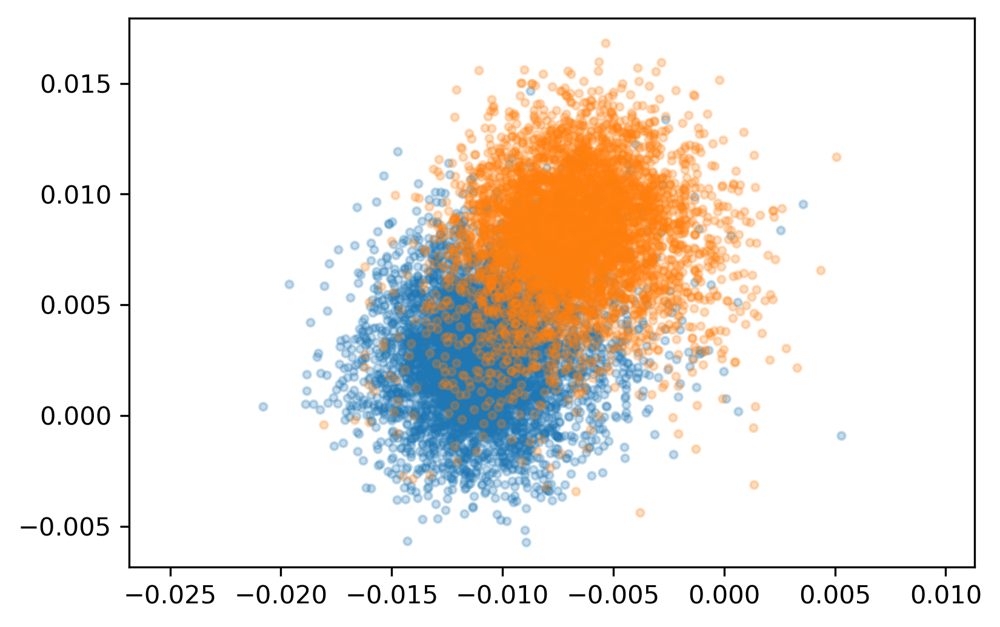

In [215]:
ii = np.argmax(fid_f_p)
ii = np.argmin(abs(np.array(fid_f_p)-0.75))
print(amp[ii], fid_f_p[ii])
a, b = np.array(Ig.iloc[ii*avgs: (ii+1)*avgs]), np.array(Qg.iloc[ii*avgs: (ii+1)*avgs])
c, d = np.array(Ie.iloc[ii*avgs: (ii+1)*avgs]), np.array(Qe.iloc[ii*avgs: (ii+1)*avgs])

plt.figure(dpi=300)
plt.plot(a, b, '.', alpha=0.25)
plt.plot(c, d, '.', alpha=0.25)
plt.axis('equal')
plt.show()

In [76]:
# from matplotlib import pyplot as plt
from sklearn.cluster import KMeans
# import numpy as np
# from scipy.optimize import curve_fit


def gauss(x, mu, sigma, a):
    return a*np.exp(-(x-mu)**2/(2*sigma**2))


def bimodal(x,mu1,sigma1, a1, mu2, sigma2, a2):
    return gauss(x, mu1, sigma1, a1)+gauss(x, mu2, sigma2, a2)


def calc_demarcation(di, dq, isPlot=True):
    # Use a K-Means Cluster to automatically assign points in IQ space, with 2 total clusters
    clf = KMeans(n_clusters=2)
    data = np.array(list(zip(di, dq)))
    clf.fit(data)
    # Find the centroids of each cluster
    centers = clf.cluster_centers_
    labels = clf.predict(data)

    # Determine the perpendicular slope to the line that connects the two centroids
    slope = ((centers[1][1] - centers[0][1]) / (centers[1][0] - centers[0][0]))
    angle = - np.arctan(slope)

    if np.abs(slope) > 0.1:
        slope = -1 / slope

    # Find the midpoint of the two centroids.
    if centers[1][0] > centers[0][0]:
        midpointX = (centers[1][0] - centers[0][0]) / 2
    else:
        midpointX = (centers[0][0] - centers[1][0]) / 2

    if centers[1][1] > centers[0][1]:
        midpointY = (centers[1][1] - centers[0][1]) / 2
    else:
        midpointY = (centers[0][1] - centers[1][1]) / 2

    # Find the line that goes through the midpoint of the centroids and has the perpendicular slope
    intercept = midpointY - slope * midpointX

    if isPlot:
        plt.close()
        plt.scatter(di, dq, c=labels)
        plt.scatter(centers[:, 0], centers[:, 1])
        plt.show()

    return slope, intercept, angle


def get_num_tau(signal, u_thresh_up, u_thresh_dn, params):
    delta_t, delta_u, A_dn, A_up = params

    # Determine the number of transitions in the data
    k = 0
    state = 0  # Initial state is down
    classified = []

    # Loop through each point of the signal
    for i in range(len(signal)):
        if state:
            # If the state is currently up, and new point is below the threshold, flip the state and increment k
            if signal[i] < u_thresh_up:
                state = 0
                k = k + 1
                classified.append(0)
            else:
                classified.append(1)
        else:
            # If the state is currently down, and new point is above the threshold, flip the state and increment k
            if signal[i] > u_thresh_dn:
                state = 1
                k = k + 1
                classified.append(1)
            else:
                classified.append(0)

    # If there is a bad fit/other irregularity, set minimum number of transitions to be 10
    if k < 10:
        k = 10

    # Using the number of transitions, determine the lifetimes of each state (in us). Uses the limit where k is large
    tau_dn = (2 * A_dn * delta_t) / (k * delta_u)
    tau_up = (2 * A_up * delta_t) / (k * delta_u)

    return k, tau_dn, tau_up, classified


def get_thresholds(signal, avgNum, expected, delta_t):
    # Average signal
    averagedSignal = []
    for i in range(len(signal) - avgNum):
        averagedSignal.append(np.average(signal[i:i + avgNum]))

    # Convert data into histogram and fit to bimodal gaussian
    n, bins = np.histogram(averagedSignal, bins=80)
    x = (bins[1:] + bins[:-1]) / 2

    #     expected = (25, 100, 70, 1300, 100, 50)
    params, cov = curve_fit(bimodal, x, n, expected)

    # Estimate initial number of transitions

    delta_u = bins[1] - bins[0]  # Determine bin size

    # Extract fit parameters from the double gaussian curve
    if params[0] < params[3]:
        u_dn = params[0]
        sigma_dn = params[1]
        A_dn = params[2] * np.abs(sigma_dn) * np.sqrt(2 * np.pi)
        u_up = params[3]
        sigma_up = params[4]
        A_up = params[5] * np.abs(sigma_up) * np.sqrt(2 * np.pi)
    else:
        u_up = params[0]
        sigma_up = params[1]
        A_up = params[2] * np.abs(sigma_up) * np.sqrt(2 * np.pi)
        u_dn = params[3]
        sigma_dn = params[4]
        A_dn = params[5] * np.abs(sigma_dn) * np.sqrt(2 * np.pi)

    # From the curve, the separation between the two states
    delta_v = u_up - u_dn

    # Initial overestimate of threshold positions
    u_thresh_dn_0 = u_dn + delta_v / 2 + sigma_dn ** 2 / delta_u
    u_thresh_up_0 = u_up + delta_v / 2 - sigma_up ** 2 / delta_u

    # First estimate of num transitions and lifetimes
    k_current, tau_dn, tau_up, classified = get_num_tau(averagedSignal, u_thresh_up_0, u_thresh_dn_0,
                                                        [delta_t, delta_u, A_dn, A_up])

    # Iteratively calculate num of transitions, lifetimes, and threshold values, until number of transitions converges
    i = 0
    k_new = 10000

    u_thresh_dn_1 = 0
    u_thresh_up_1 = 0

    while abs(k_new - k_current) > 5 and i < 1000:
        k_current = k_new
        i = i + 1

        # Get new threshold values using the current estimates of lifetimes and number of transitions
        delta_up_1 = delta_v / 2 + sigma_up ** 2 / delta_v * np.log(tau_up / delta_t - 1)
        delta_dn_1 = delta_v / 2 + sigma_dn ** 2 / delta_v * np.log(tau_dn / delta_t - 1)

        u_thresh_dn_1 = u_dn + delta_dn_1
        u_thresh_up_1 = u_up - delta_up_1

        # Recalculate the number of transitions and lifetimes
        k_new, tau_dn, tau_up, classified = get_num_tau(averagedSignal, u_thresh_up_1, u_thresh_dn_1,
                                                        [delta_t, delta_u, A_dn, A_up])

        # Recalculate the number of points in the up and down Gaussian
        A_up = np.sum(classified) * delta_u
        A_dn = len(classified) * delta_u - A_up

    print("number of iterations: " + str(i))
    return k_new, tau_dn, tau_up, u_thresh_dn_1, u_thresh_up_1, classified


fileNumber = 0
expt_name = "histogram"
filename = "C:\\Users\\slab\\Downloads\\" + str(fileNumber).zfill(
    5) + "_" + expt_name.lower() + ".h5"
# with File(filename, 'r') as a:
#     di1 = array(a['di1'])
#     dq1 = array(a['dq1'])

with File(filename,'r') as a:
    ig = array(a['ig'])
    qg = array(a['qg']) 
    ie = array(a['ie'])
    qe = array(a['qe'])
    a.close()

# ig = list(ig)
# ig.extend(ie)

# qg = list(qg)
# qg.extend(qe)

# slope, intercept, angle = calc_demarcation(ig, qg)

# signal = di1[0] * slope - dq1[0] + intercept

# #Get the histogram to estimate initial fitting parameters

# n, bins = np.histogram(signal, bins = 80)
# amp = np.max(n)
# peak1 = bins[np.argmax(n)]

# numAvg = 1  # If you want to do a rolling average over more data points
# k, tau_dn, tau_up, u_thresh_dn, u_thresh_up, classified = get_thresholds(signal, numAvg,
#                                  expected= (peak1 - 1000, 100, amp, peak1, 100, amp), delta_t=3.6)
# print(angle)
# print(u_thresh_dn)  # The number to compare to for ground/excited


In [28]:
np.shape(ig)

(2, 10000)

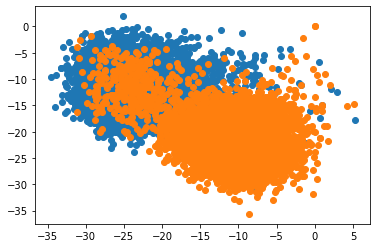

In [36]:
plt.scatter(ig[0], qg[0])
plt.scatter(ig[1], qg[1])

<ipython-input-51-35237fef7812>:207: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


Optimal fidelity after rotation = 0.938


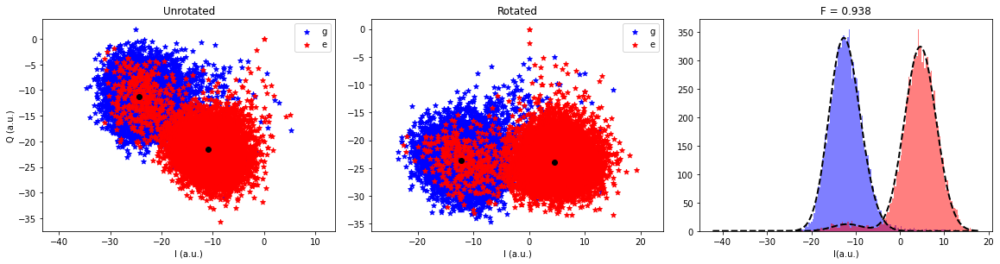

In [52]:
fid, angle = hist(filename, data=[ig[0], qg[0], ig[1], qg[1]],  plot=True, ran=30)
print('Optimal fidelity after rotation = %.3f'%fid)

<AxesSubplot:>

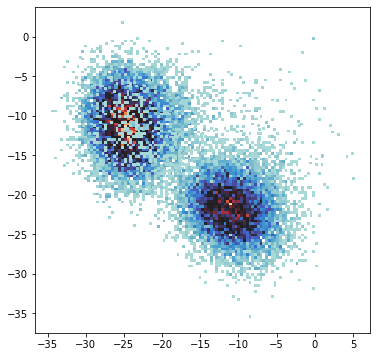

In [94]:
import seaborn as sns
# hist1 = np.histogram2d(ig[0], qg[0], bins=100)
# hist2 = np.histogram2d(ig[1], qg[1], bins=100)

f, ax = plt.subplots(figsize=(6, 6))
# sns.scatterplot(x=ig[0], y=qg[0], s=5, color=".15")
# sns.scatterplot(x=ig[1], y=qg[1], s=5, color=".15")

sns.histplot(x=ig[0], y=qg[0], bins=(100, 100), cmap="rocket")
sns.histplot(x=ig[1], y=qg[1], bins=(100, 100), cmap="icefire")
ricket
# data = [ig[0], qg[0]]
# sns.jointplot(data)

# plt.figure()
# x = plt.hist2d(ig[0], qg[0], bins=(100, 100))
# a = plt.hist2d(ig[1], qg[1], bins=(100, 100))
# plt.show()

## Optimal weight

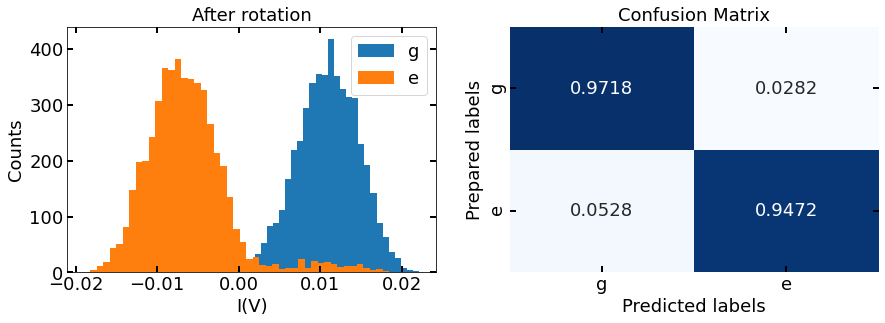

In [197]:
expt_name = 'histogram_disc'
filelist = [310]
import seaborn as sns

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        
        I = array(a['I'])
        Q = array(a['Q'])
        res = array(a['res'])
        avgs = array(a['avgs'])
        seq0 = array(a['seq0'])
        a.close()
        
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))
fig.tight_layout()
plt.subplots_adjust(wspace=0.2)

axs[0].hist(I[np.array(seq0) == 0], 50, label='g')
axs[0].hist(I[np.array(seq0) == 1], 50, label='e')
axs[0].set_title('After rotation', fontsize=18)
axs[0].set_ylabel('Counts', fontsize=18)
axs[0].set_xlabel('I(V)', fontsize=18)
axs[0].legend(fontsize=18)
axs[0].tick_params(direction='in', length=6, width=2, colors='k',\
           grid_color='k', grid_alpha=0.5, labelsize=18, labelbottom=True, right=True,top=True)

p_s = np.zeros(shape=(2, 2))
for i in range(2):
    res_i = res[np.array(seq0) == i]
    p_s[i, :] = np.array([np.mean(res_i == 0), np.mean(res_i == 1)])

labels = ['g', 'e']
ax = axs[1]
sns.heatmap(p_s, annot=True, ax=ax, fmt='g', cmap='Blues',annot_kws={"size": 18}, cbar=False)

ax.set_xlabel('Predicted labels', fontsize=18)
ax.set_ylabel('Prepared labels', fontsize=18)
ax.set_title('Confusion Matrix', fontsize=18)
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)
plt.tick_params(direction='in', length=6, width=2, colors='k',\
           grid_color='k', grid_alpha=0.5, labelsize=18, labelbottom=True, right=True,top=True)

# plt.savefig('2021-06-09-ge_disc.png', dpi=300, bbox_inches='tight')
plt.show()

infidelity = 1- 0.5*(np.sum(np.diag(p_s)))

### Optimal amp sweep

In [236]:
expt_name = 'histogram_disc_amp_sweep'
filelist = [0]
import seaborn as sns

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        
        I = array(a['I'])
        Q = array(a['Q'])
        res = array(a['res'])
        avgs = array(a['avgs'])
        seq0 = array(a['seq0'])
        a.close()
        
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(18, 6))
axs[0].hist(I[np.array(seq0) == 0], 50)
axs[0].hist(I[np.array(seq0) == 1], 50)
axs[0].set_title('After rotation')

p_s = np.zeros(shape=(2, 2))
for i in range(2):
    res_i = res[np.array(seq0) == i]
    p_s[i, :] = np.array([np.mean(res_i == 0), np.mean(res_i == 1)])

labels = ['g', 'e']
ax = axs[1]
sns.heatmap(p_s, annot=True, ax=ax, fmt='g', cmap='Blues')

ax.set_xlabel('Predicted labels')
ax.set_ylabel('Prepared labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

plt.show()

infidelity = 1- 0.5*(np.sum(np.diag(p_s)))

0.05120000000000002

# Storage

## Spectroscopy

fits =  [ 1.02358240e-04  1.14023923e-05 -1.60501338e+03  2.30425122e+03]
fits =  [1.05884387e-04 4.32841192e-05 6.58967475e+01 4.60260913e+01]


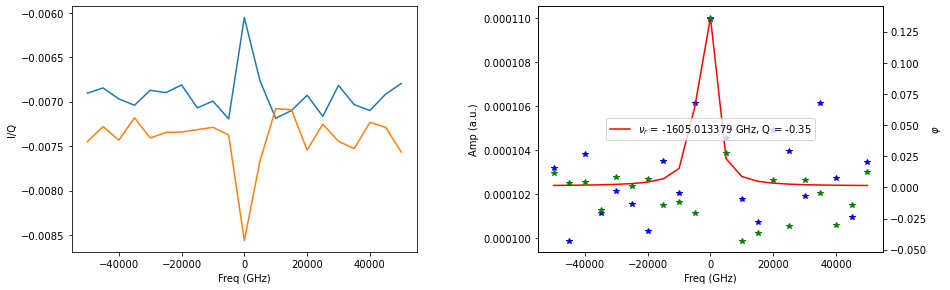

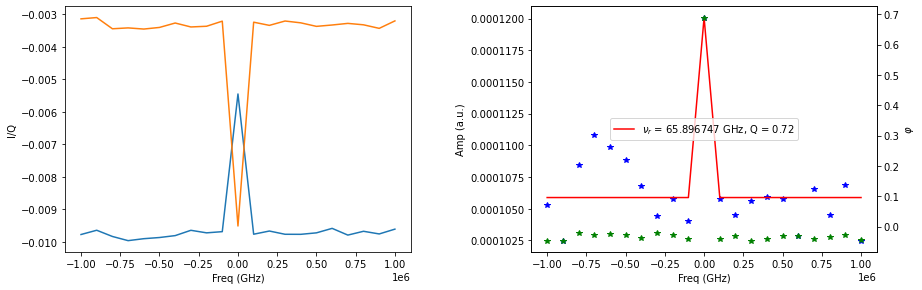

In [23]:
expt_name = 'storage_spec'
filelist = [0, 6]
#3 - amp(0.5)
#4 - 8us long readout

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        x = array(a['freqs'])
        a.close()
        
    fig, axs = plt.subplots(1, 2, figsize=(12, 4))
    fig.tight_layout()
    fig.subplots_adjust(wspace=0.35)
    axs[0].plot(x, I)
    axs[0].plot(x, Q)
    axs[0].set_xlabel('Freq (GHz)')
    axs[0].set_ylabel('I/Q')

    amps = Q**2 + I**2
    ph = np.arctan2(np.array(Q), np.array(I))
    ph = np.unwrap(ph, discont=3.141592653589793, axis=-1)
    m = (ph[-1]-ph[0])/(x[-1] - x[0])
    ph = ph - m*x*0.95
    ph = ph -np.mean(ph)
    axs[1].plot(x, amps, 'b*')
    p = fitlor(x, amps, showfit=False)
    q = p[2]/(2*p[3])
    axs[1].plot(x, lorfunc(p, x), label=r'$\nu_{r}$ = %.6f GHz, Q = %.2f'% (p[2], q), color='r')
    print ("fits = ", p)
    ax2  = axs[1].twinx()
    ax2.plot(x, ph, 'g*')
    axs[1].set_xlabel('Freq (GHz)')
    axs[1].set_ylabel('Amp (a.u.)')
    ax2.set_ylabel('$\\varphi$')
    axs[1].legend(loc='center')

fits =  [2.89974672e-06 6.09042699e-06 1.33262562e+04 1.82099523e+03]


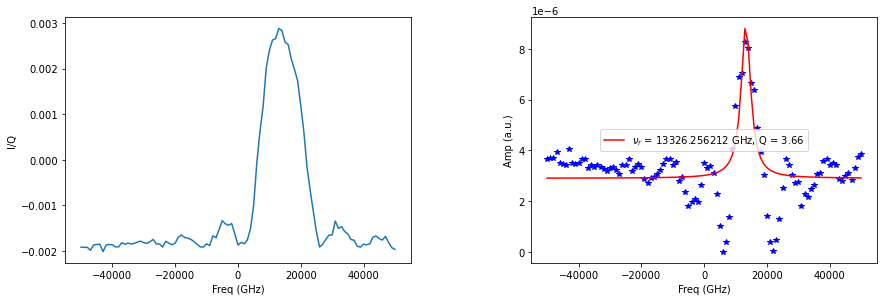

In [24]:
expt_name = 'storage_spectroscopy'
filelist = [3]
#3 - amp(0.5)
#4 - 8us long readout

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        I = array(a['I'])
        Q = array(a['Q'])
        x = array(a['freqs'])
        storage_freq = array(a['storage_freq'])
        a.close()
        
    fig, axs = plt.subplots(1, 2, figsize=(12, 4))
    fig.tight_layout()
    fig.subplots_adjust(wspace=0.35)
    axs[0].plot(x, I)
#     axs[0].plot(x, Q)
    axs[0].set_xlabel('Freq (GHz)')
    axs[0].set_ylabel('I/Q')

    amps = I**2
    axs[1].plot(x, amps, 'b*')
    p = fitlor(x, amps, showfit=False)
    q = p[2]/(2*p[3])
    axs[1].plot(x, lorfunc(p, x), label=r'$\nu_{r}$ = %.6f GHz, Q = %.2f'% (p[2], q), color='r')
    print ("fits = ", p)
    axs[1].set_xlabel('Freq (GHz)')
    axs[1].set_ylabel('Amp (a.u.)')
    axs[1].legend(loc='center')

## Number splitting

1.0 120 2.1616936766710086


C:\ProgramData\Miniconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


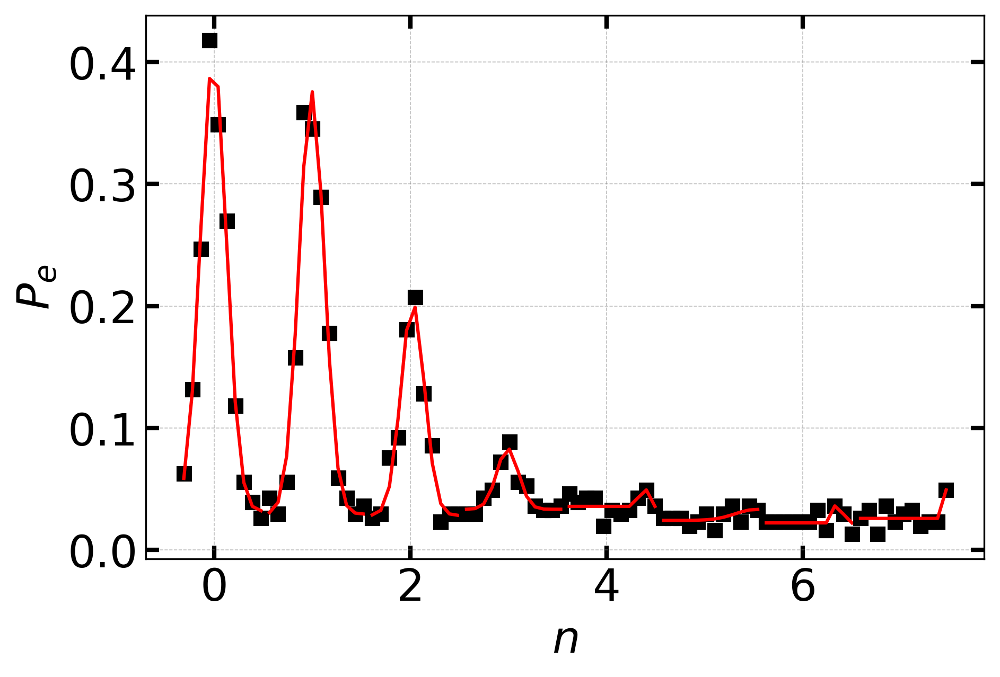

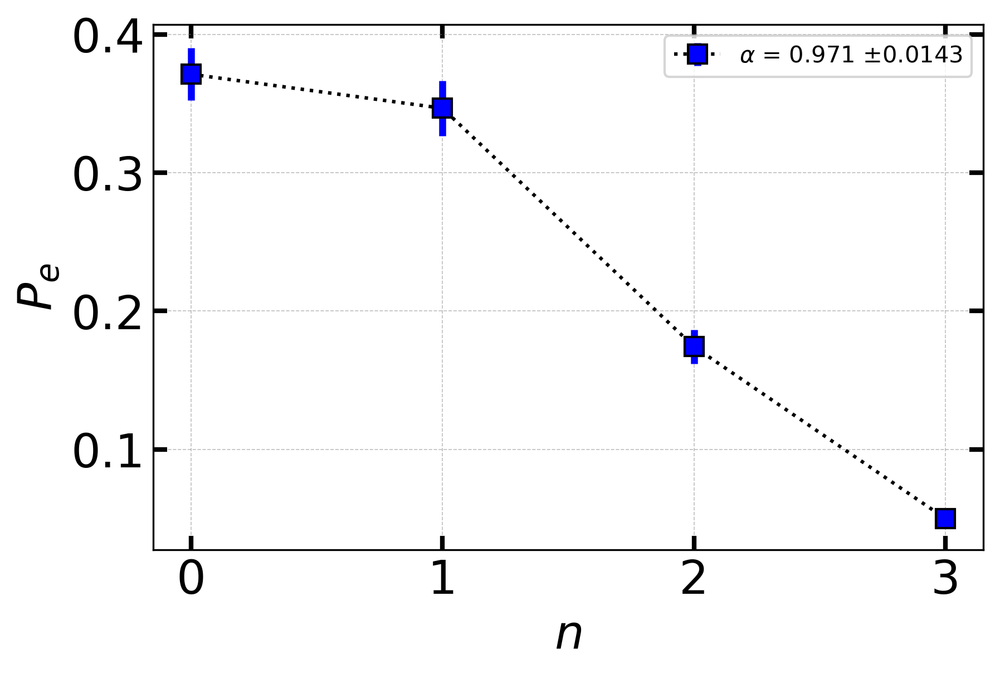

0.9709211997912056 0.014268685523943348


In [1647]:
expt_name = 'number_splitting_gauss'
filelist = [3]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as f:

        I = np.array(f['I'])[:]
        Q = np.array(f['Q'])[:]
        cav_amp = np.array(f['amp'])
        cav_len = np.array(f['time'])
        two_chi = np.array(f['two_chi'])
        freqs = (np.array(f['freq']))/(two_chi)
        alpha = np.array(f['alpha'])
        f.close()

    print(cav_amp, cav_len, alpha)
    x = freqs
    y = Q 
    t = 4
    fitdata = number_splitting(x, y, n=0)
    a, a_err = fitcoherentstate(peak_val=fitdata['peak'][:t], peak_val_err=fitdata['peak_err'][:t])
    
    fig, axs = plt.subplots(1, 1, dpi=300)
    axs.errorbar(x=np.arange(len(fitdata['peak'][:t])), y=fitdata['peak'][:t], yerr=fitdata['peak_err'][:t],  fmt='s', markersize=8, ecolor='b', elinewidth=3, capsize=0,
                     linestyle='dotted', color='k', markerfacecolor='b', label=r'$\alpha$ = {} $\pm {}$'.format(np.round(a, 3), np.round(a_err, 4)))
    axs.grid(True, which='major', axis='both', color='grey', linestyle='--', linewidth=0.4)
    
    axs.set_xlabel(r'$n$', fontsize=20)
    axs.set_ylabel(r'$P_{e}$', fontsize=20)
    axs.legend(fontsize=10, loc='best')
    plt.tight_layout()
    plt.tick_params(direction='in', length=6, width=2, colors='k', \
    grid_color='grey', grid_alpha=0.5, labelsize=20, labelbottom=True, right=True, top=True, left=True)
    plt.show()

    print(a, a_err)


In [1641]:
0.971*(160/120)

1.2946666666666666

In [1648]:
fitdata['freq']*two_chi

array([    9748.52832103, -1250928.85023926, -2549171.0214298 ,
       -3767566.68978087, -5502163.07874041, -6955025.20705052,
       -8020861.16285617, -9410227.58999062])

1.0 80 1.4783314241210255


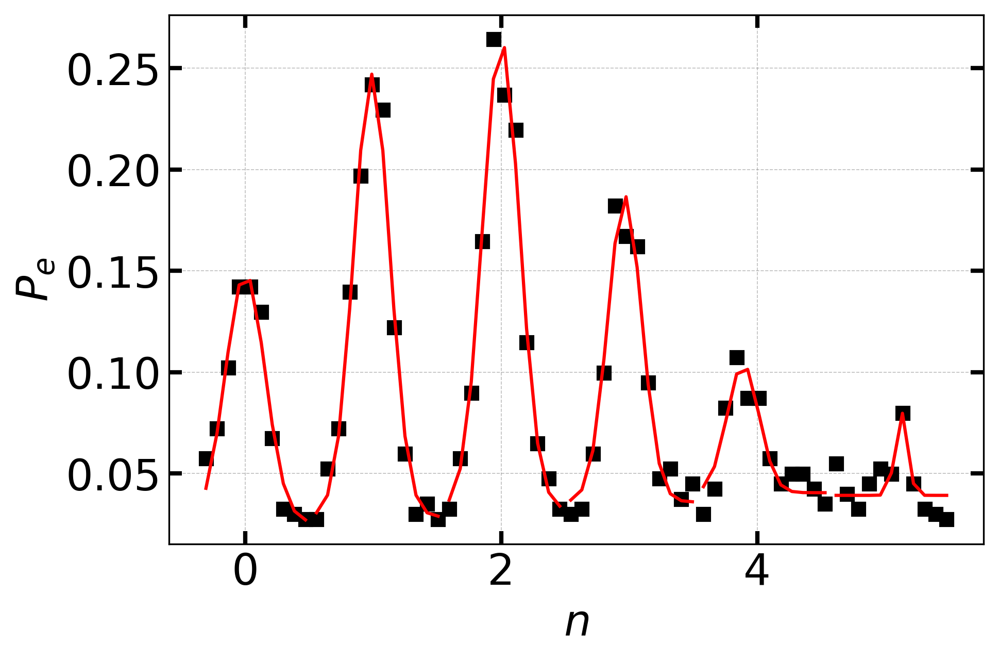

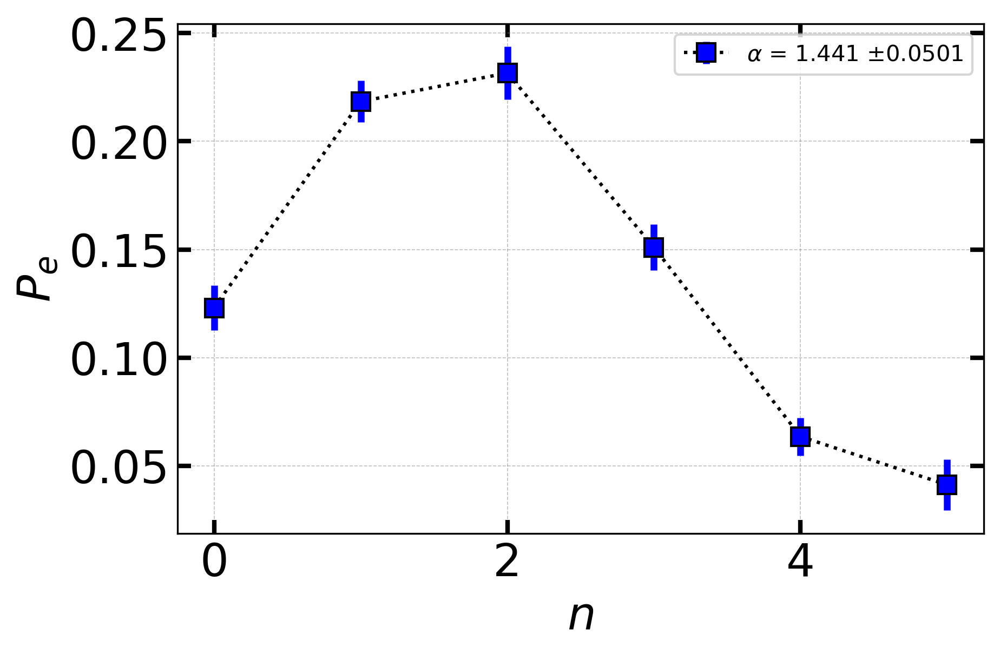

1.4411291177806724 0.05013458703006594


In [1583]:
expt_name = 'number_splitting'
filelist = [39]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as f:

        I = np.array(f['I'])[:]
        Q = np.array(f['Q'])[:]
        cav_amp = np.array(f['amp'])
        cav_len = np.array(f['time'])
        two_chi = np.array(f['two_chi'])
        freqs = (np.array(f['freq']))/(two_chi)
        alpha = np.array(f['alpha'])
        f.close()

    print(cav_amp, cav_len, alpha)
    x = freqs
    y = Q 
    fitdata = number_splitting(x, y, n=2)
    a, a_err = fitcoherentstate(peak_val=fitdata['peak'], peak_val_err=fitdata['peak_err'])
    
    fig, axs = plt.subplots(1, 1, dpi=300)
    axs.errorbar(x=np.arange(len(fitdata['peak'])), y=fitdata['peak'], yerr=fitdata['peak_err'],  fmt='s', markersize=8, ecolor='b', elinewidth=3, capsize=0,
                     linestyle='dotted', color='k', markerfacecolor='b', label=r'$\alpha$ = {} $\pm {}$'.format(np.round(a, 3), np.round(a_err, 4)))
    axs.grid(True, which='major', axis='both', color='grey', linestyle='--', linewidth=0.4)
    
    axs.set_xlabel(r'$n$', fontsize=20)
    axs.set_ylabel(r'$P_{e}$', fontsize=20)
    axs.legend(fontsize=10, loc='best')
    plt.tight_layout()
    plt.tick_params(direction='in', length=6, width=2, colors='k', \
    grid_color='grey', grid_alpha=0.5, labelsize=20, labelbottom=True, right=True, top=True, left=True)
    plt.show()

    print(a, a_err)


In [1610]:
0.669*2.35

1.5721500000000002

[-1257.27107973    -8.81481919] [12.93776283  6.40759429]


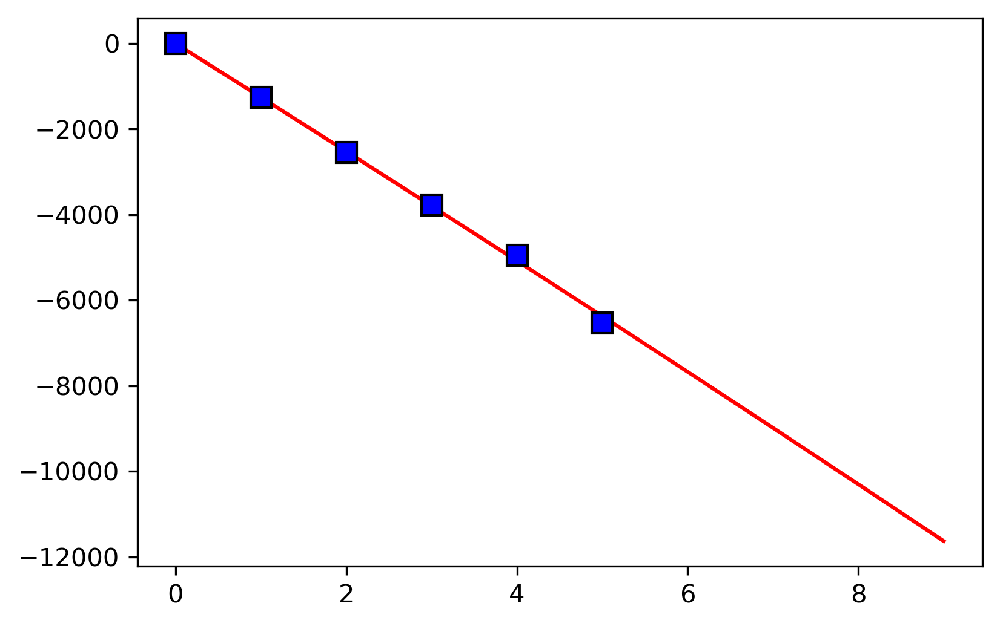

In [1582]:
def chi_to_n(n, chi, chi_prime):
    return n*chi + (n*(n-1)) * chi_prime/2


x  = np.arange(len(fitdata['freq']))
y = fitdata['freq']*two_chi/1e3
y_err = fitdata['freq_err']*two_chi/1e3
plt.figure(dpi=300)
popt, pocv = curve_fit(chi_to_n, x, y, sigma=y_err)
print(popt, np.sqrt(np.diag(pcov)))
plt.errorbar(x=x, y=y, yerr=y_err,  fmt='s', markersize=8, ecolor='b', elinewidth=3, capsize=0,
                  color='k', markerfacecolor='b')
plt.plot(np.arange(10),chi_to_n(np.arange(10), *popt), 'r' )


1.0 [ 20.  28.  36.  44.  52.  60.  68.  76.  84.  92. 100.]


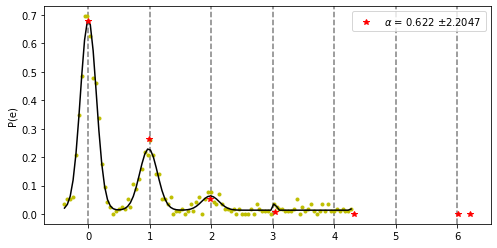

In [246]:
expt_name = 'snap_fock_prep'
filelist = [7]

qubit_freq = 4.746910599438208
N = 7

two_chi_meas = []

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as f:

        I = np.array(f['I'])[:]
        Q = np.array(f['Q'])[:]
#         cav_amp = np.array(f['amp'])
#         cav_len = np.array(f['time'])
        two_chi = np.array(f['two_chi'])
        freqs = (np.array(f['freq']))/(two_chi)
        f.close()
        print(cav_amp, cav_len)
        x = freqs
        """Scaling the probability values with g and e"""
        y = Q 
        
        plt.figure(figsize=(8, 4))

        for j in range(N):
            plt.axvline(x=j, linestyle='--', color='grey')
        plt.plot(x, y, '.', color='y') 
        
        fitparams = np.zeros(3*N+1)
        fitparams[0] = 0

        for kk in range(N):
            fitparams[3*kk+1] = max(y)
            fitparams[3*kk+2] = kk
            fitparams[3*kk+3] = 0.3

        p1, p2 = fitgausssum_with_baseline(x, y, fitparams=fitparams)
        
        plt.plot(x, gaussfuncsum_with_baseline(x, *p1), 'k')                   

        peak_val, freq_val = fitamp(p1)
        
        two_chi_meas.append(abs(two_chi)*(p1[5]-p1[2])/1e6)
        
        a, a_err = fitcoherentstate(peak_val)
        plt.plot(freq_val, coherent_state(np.arange(len(peak_val)), a), 'r*', label=r'$\alpha$ = {} $\pm {}$'.format(np.round(a, 3), np.round(a_err, 4)))
        
        plt.ylabel('P(e)')
        plt.legend(loc='best')
        plt.show()


1.0 120 2.1616936766710086


C:\ProgramData\Miniconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


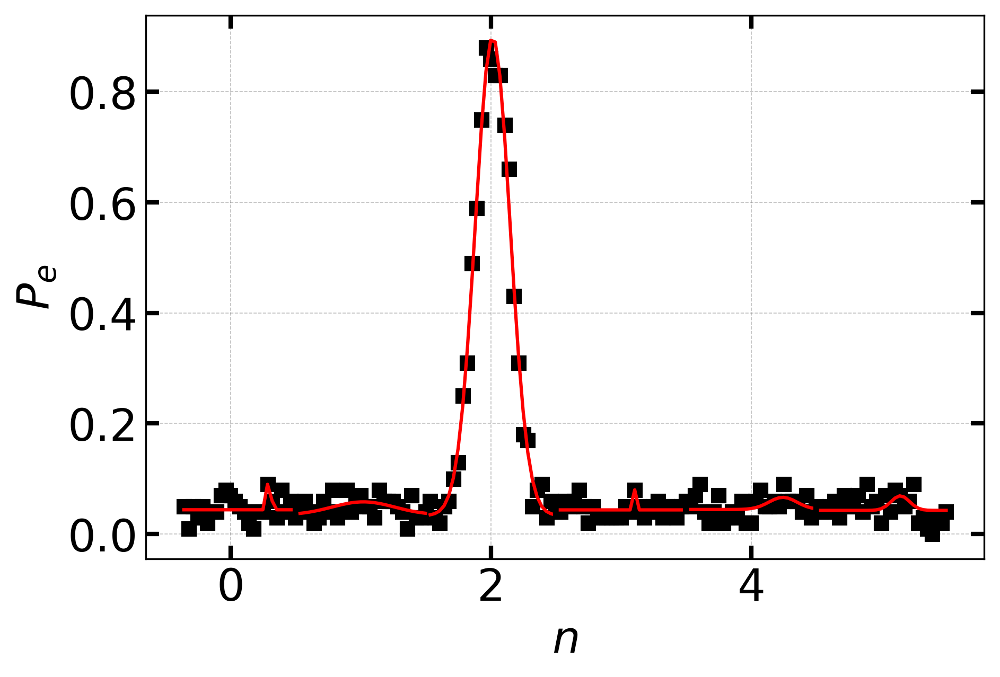

[ -374108.52072204 -1282635.05350119 -2535119.04354824 -3909852.28837196
 -5344538.45214748 -6481688.01453627]


In [1690]:
expt_name = 'qctrl_fock_prep'
filelist = [14]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as f:

        I = np.array(f['I'])[:]
        Q = np.array(f['Q'])[:]
        two_chi = np.array(f['two_chi'])
        freqs = (np.array(f['freq']))/(two_chi)
        f.close()

    print(cav_amp, cav_len, alpha)
    x = freqs
    y = Q 
    t = 4
    fitdata = number_splitting(x, y, n=0)
    
    print(fitdata['freq']*two_chi)


### Number splitting with qubit initialized in e

0.4 400
0.4 400


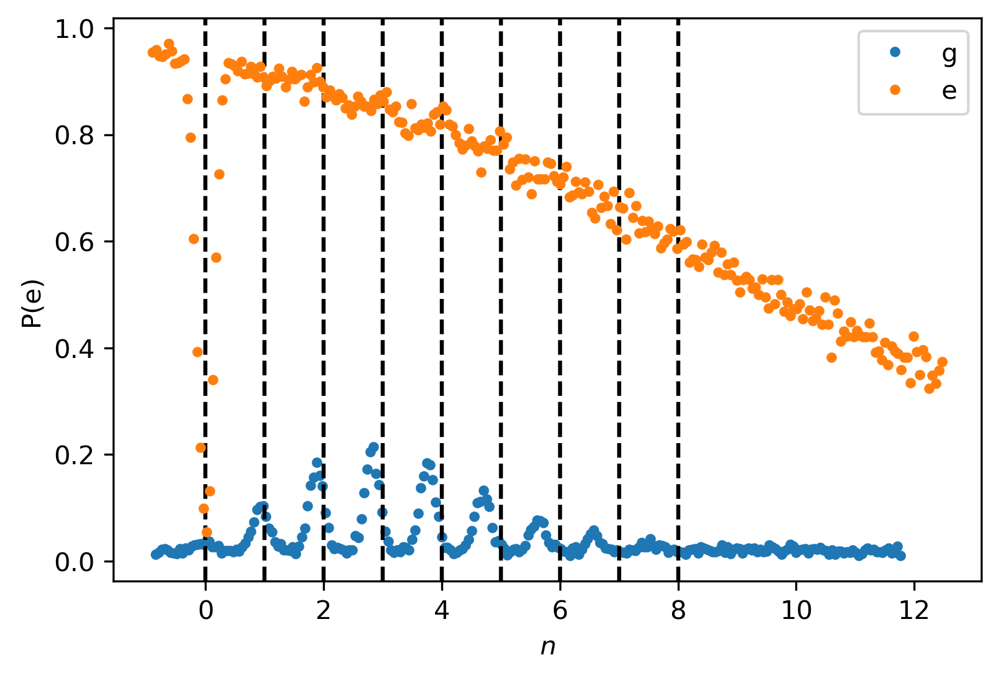

In [87]:
expt_name = 'number_splitting'
filelist = [27, 28]

def chi_to_n(n, chi, chi_prime):
    return n*chi + (n**2) * chi_prime/2

N = 9
contrast = [0.953, 0.0165]
# two_chi = -1.119*1e6
two_chi_meas = []
plt.figure(dpi=300)
label = ['g', 'e']
for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        I = np.array(a['I'])[:]
        Q = np.array(a['Q'])[:]
        cav_amp = np.array(a['amp'])
        cav_len = np.array(a['time'])
        two_chi = np.array(a['two_chi'])
        freqs = (np.array(a['freq']))[:]/two_chi
        a.close()
        print(cav_amp, cav_len)
        x = freqs
        """Scaling the probability values with g and e"""
        y = (Q - contrast[1])/contrast[0]
        

    for j in range(N):
        plt.axvline(x=j, linestyle='--', color='k')
    plt.plot(x, y, '.', label=label[ii]) 

plt.ylabel('P(e)')
plt.xlabel('$n$')
plt.legend(loc='best')
plt.show()

### Correction to cross-Kerr

1.0 100


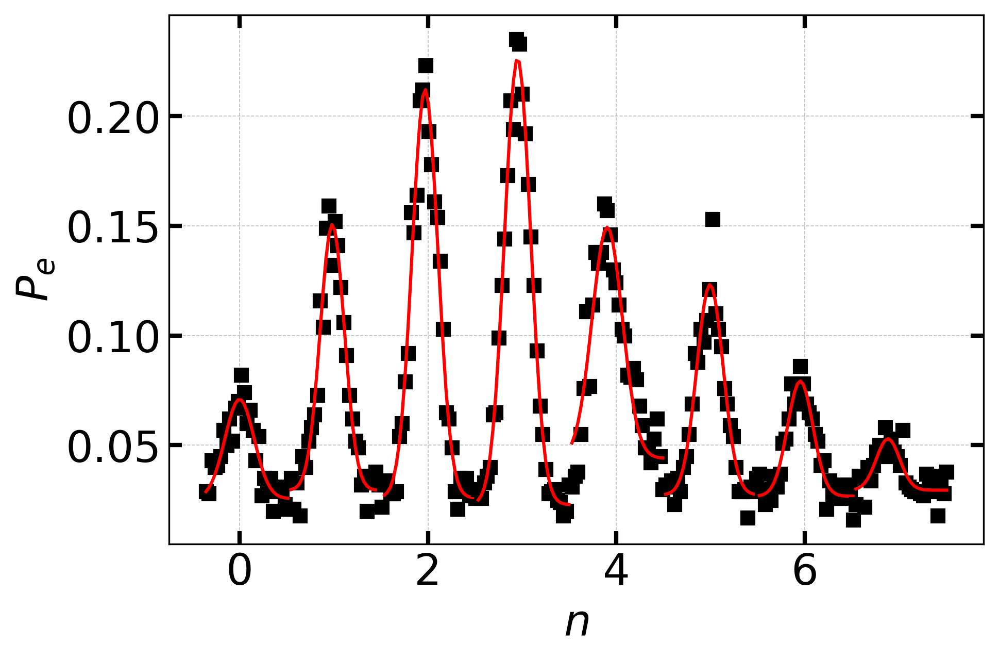

1.0 72


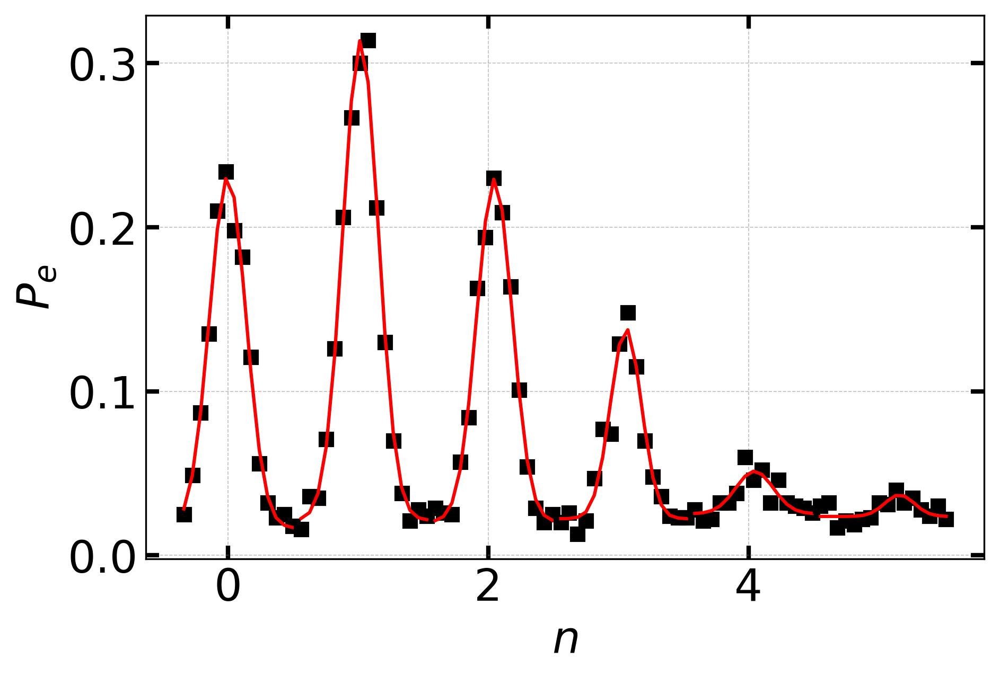

1.0 80


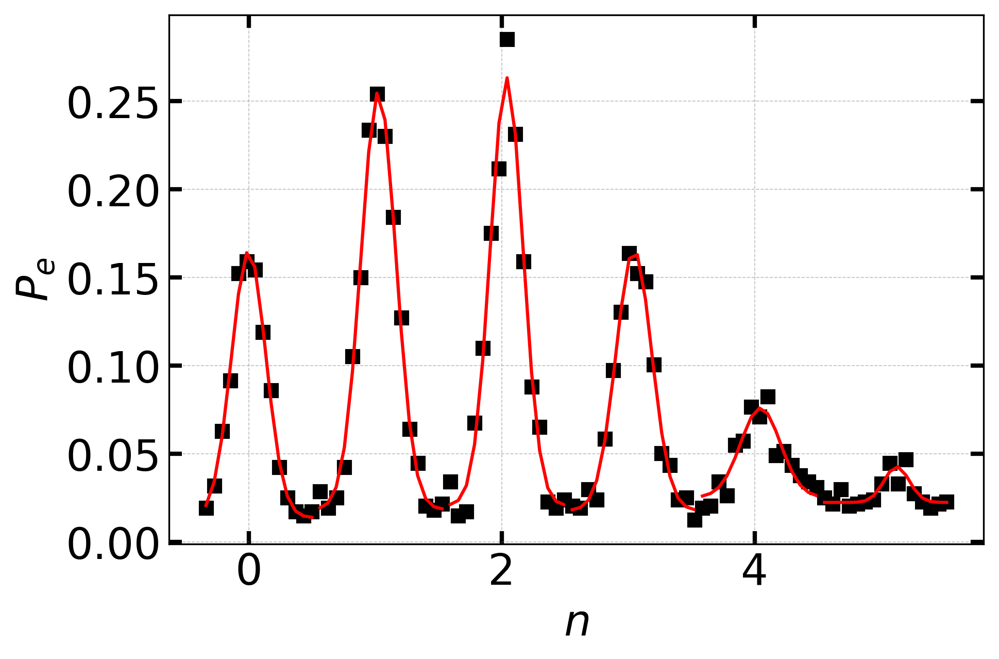

1.0 100


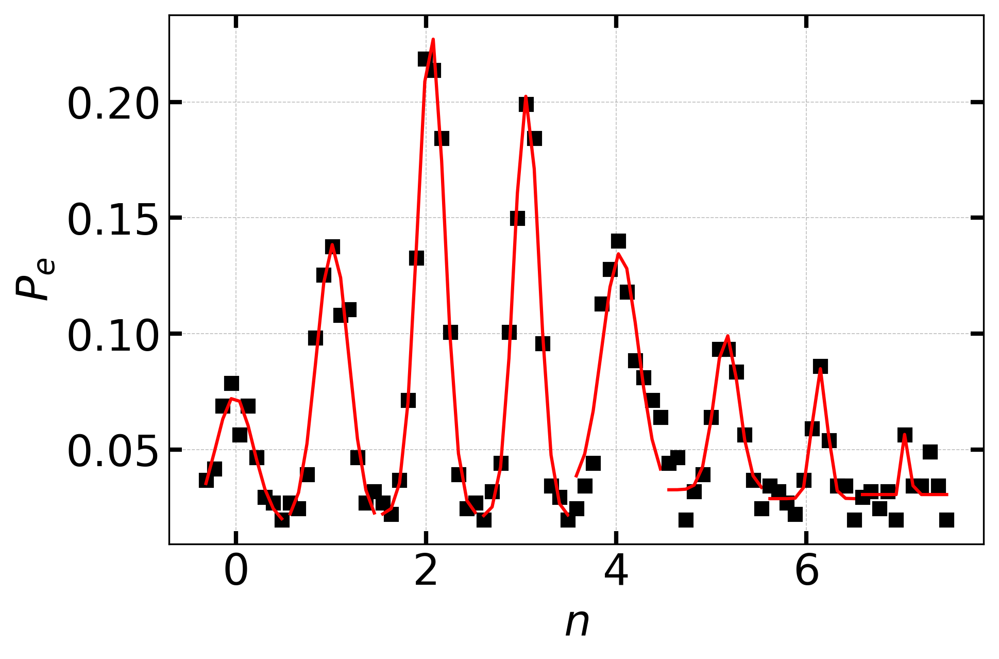

In [1538]:
expt_name = 'number_splitting'
filelist = [32, 33, 34, 35]
# filelist = [31]

freq_arr = []
freq_arr_err= []

def chi_to_n(n, chi, chi_prime):
    return n*chi + (n*(n-1)) * chi_prime/2

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        I = np.array(a['I'])[:]
        Q = np.array(a['Q'])[:]
        cav_amp = np.array(a['amp'])
        cav_len = np.array(a['time'])
        two_chi = np.array(a['two_chi'])
        freqs = (np.array(a['freq']))[:]/two_chi
        a.close()
    print(cav_amp, cav_len)
    x = freqs
    y = Q
    
    fitdata = number_splitting(x, y)
    
    freq_arr.append(fitdata['freq'])
    freq_arr_err.append(fitdata['freq_err'])

In [1539]:
mean_f = pd.DataFrame(freq_arr).mean()
mean_f_err = pd.DataFrame(freq_arr_err).mean()

print(mean_f*two_chi/1e3, mean_f_err*two_chi/1e3)

0       4.617219
1   -1257.596207
2   -2520.061074
3   -3763.604281
4   -4983.315151
5   -6350.242596
6   -7515.223896
7   -8669.602754
dtype: float64 0   -1.289689e+01
1   -8.250976e+00
2   -5.470837e+00
3   -6.717266e+00
4   -2.453050e+01
5   -2.371322e+01
6   -1.002148e+01
7   -2.194733e+06
dtype: float64


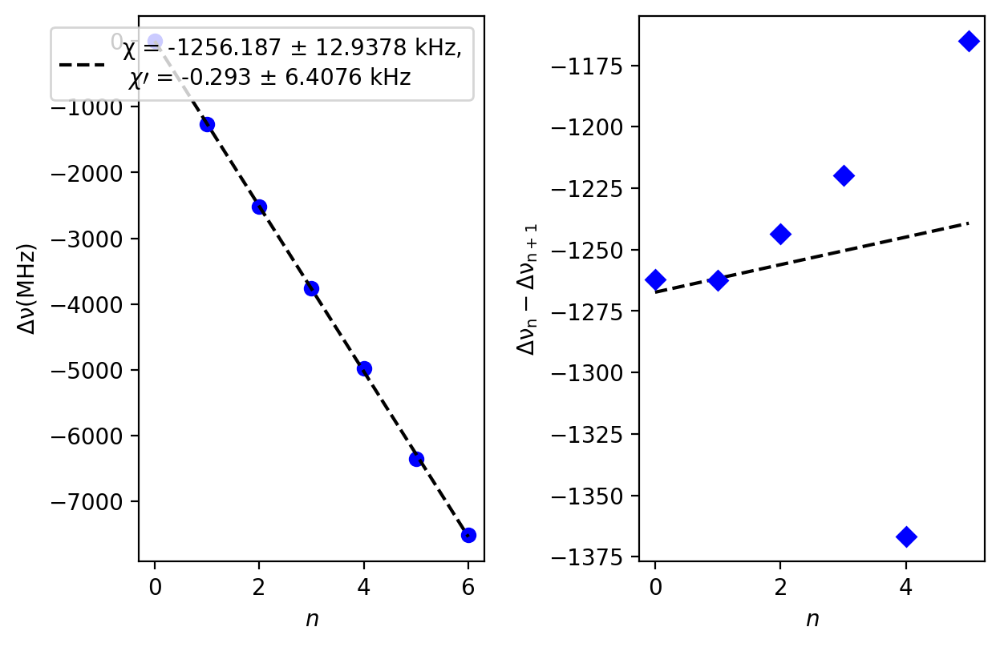

In [1540]:
x = np.arange(len(mean_f)-1)
y = np.array(mean_f)[:-1]*two_chi/1e3
y_err = np.array(mean_f_err)[:-1]*two_chi/1e3

fig, axs = plt.subplots(nrows=1, ncols=2, dpi=200)
fig.tight_layout()
plt.subplots_adjust(wspace = 0.45)
axs[0].plot(x, y, 'bo', )
axs[0].set_ylabel(r'$\mathrm{\Delta \nu (MHz)}$')
popt, pcov = curve_fit(f=chi_to_n, xdata=x , ydata=y)
axs[0].plot(x, chi_to_n(x, *popt), 'k--', label='χ = {:.3f} $\pm$ {:.4f} kHz, \n $\chi \prime$ = {:.3f} $\pm$ {:.4f} kHz'.format(popt[0], np.sqrt(np.diag(pcov)[0]),  popt[1], np.sqrt(np.diag(pcov)[1])))
axs[0].set_xlabel('$n$')
axs[0].legend(loc='best')

diff = np.ediff1d(y)
coef = np.polyfit(x[:-1], diff, 1)
poly1d_fn = np.poly1d(coef) 
# poly1d_fn is now a function which takes in x and returns an estimate for y

plt.plot(x[:-1], poly1d_fn(x[:-1]), '--k')
axs[1].plot(x[:-1], diff , 'bD')
axs[1].set_ylabel(r'$\mathrm{\Delta \nu_{n} - \Delta \nu_{n+1}}$')
axs[1].set_xlabel('$n$')
plt.show()

In [149]:
(0.521/2)**2

0.06786025000000001

## Self-Kerr

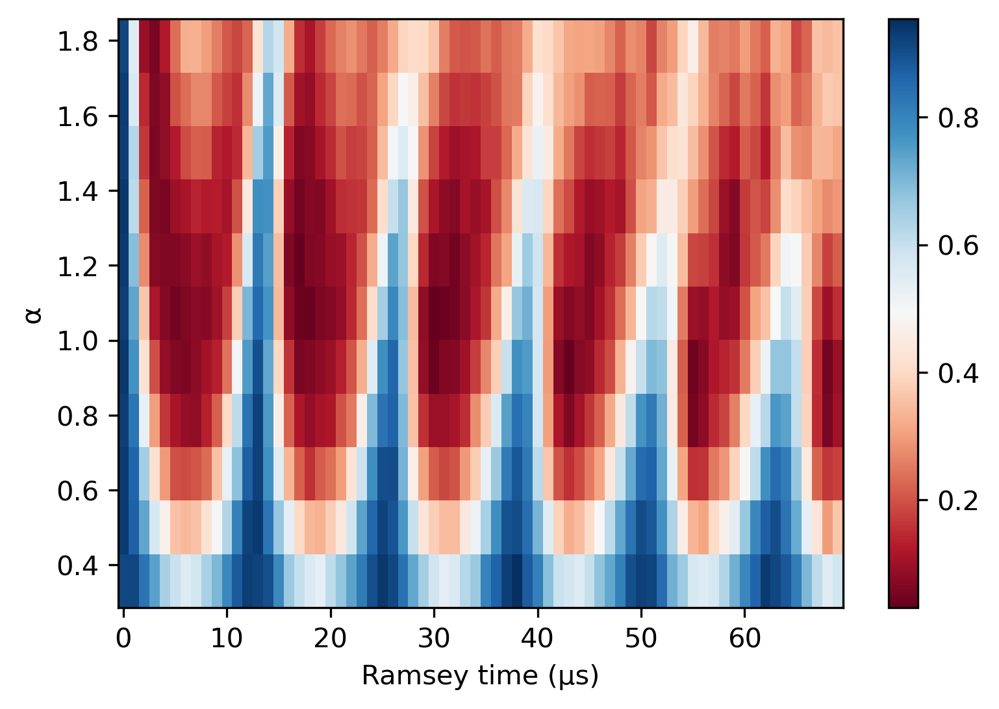

In [1188]:
def alpha_awg_cal(cav_amp=1.0, cav_len=250):
    # takes input array of amps and length and converts them to output array of alphas,
    # using a calibration h5 file defined in the experiment config
    # pull calibration data from file, handling properly in case of multimode cavity
    cal_path = 'C:\_Lib\python\slab\experiments\qm_opx_mm\drive_calibration'

    fn_file = cal_path + '\\00000_2021_12_16_cavity_square_mode_2.h5'

    with File(fn_file, 'r') as f:
        omegas = np.array(f['omegas'])
        amps = np.array(f['amps'])

    # assume zero frequency at zero amplitude, used for interpolation function
    omegas = np.append(omegas, 0.0)
    amps = np.append(amps, 0.0)

    o_s = omegas
    a_s = amps

    # interpolate data, transfer_fn is a function that for each amp returns the corresponding omega
    transfer_fn = scipy.interpolate.interp1d(a_s, o_s)

    omega_desired = transfer_fn(cav_amp)
    alpha = omega_desired * cav_len

    """Returns alpha in the cavity"""
    return alpha

expt_name = 'storage_self_kerr'
filelist = [2]

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        I = np.array(a['I'])
        Q = np.array(a['Q'])[:, :70]
        times = np.array(a['time'])[:70] # in μs
        ramsey_freq = np.array(a['ramsey_freq'])/1e6 # in MHz
        cav_freq = np.array(a['cavity_freq'][1])
        cav_len = np.array(a['cav_len'])[:] # in ns
        cav_amp = np.array(a['cav_amp'])
        a.close()

    alphas = alpha_awg_cal(cav_amp=cav_amp, cav_len=cav_len)
        
    plt.figure(dpi=300)
    ax=plt.pcolormesh(times, alphas, Q, cmap='RdBu', shading='auto')
    plt.colorbar(ax)
    plt.xlabel('Ramsey time (μs)')
    plt.ylabel('α')
    plt.show

In [888]:
ramsey_freq

0.1

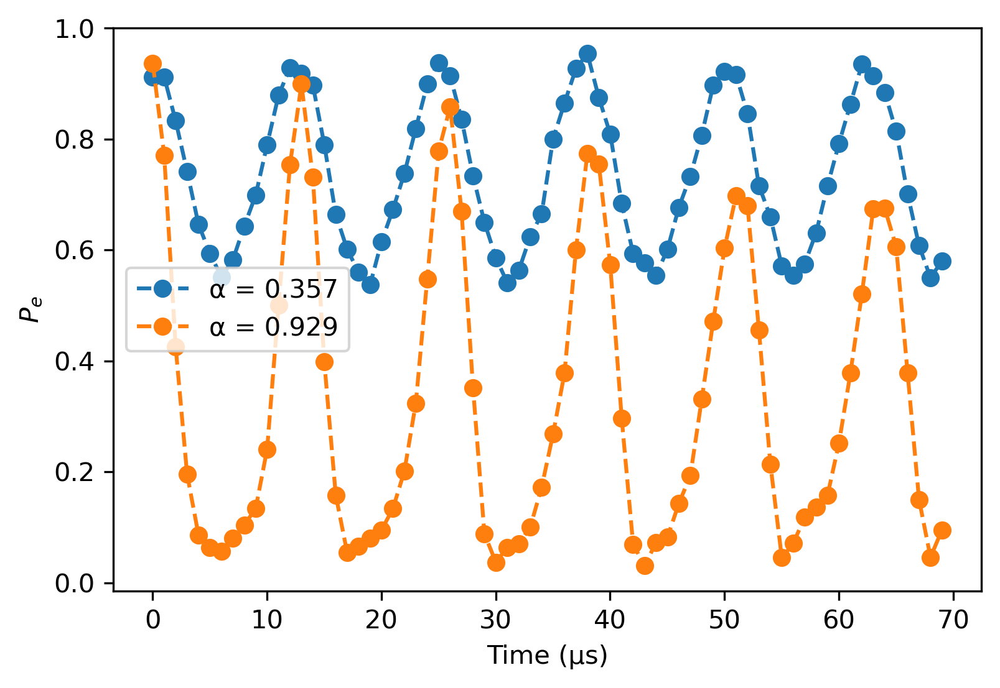

In [945]:
plt.figure(dpi=300)
plt.plot(times, Q[0], 'o--', label='α = %.3f'%alphas[0])
plt.plot(times, Q[4], 'o--', label='α = %.3f'%alphas[4])
plt.xlabel('Time (μs)')
plt.ylabel(r'$P_{e}$')
plt.legend()

plt.show()

In [1184]:
from scipy.optimize import leastsq
def self_kerr_fit(t, omega_r, kappa):
    alpha = alphas[4]
    tot = np.abs(np.exp(-alpha**2)*(sum([(1/scipy.special.factorial(n)) * alpha**(2*n)*np.exp(1j*t*2*np.pi*(omega_r*n + (kappa/2)*n**2))
                                   for n in arange(50)])))**2
    return tot
popt, pcov = curve_fit(self_kerr_fit, times, Q[4], p0= (0.157, 0.2e-3))
print(popt)

[-0.52146562  0.90687896]


In [1185]:
self_kerr_fit(times, 0.1, 0.1)

896.8677931884971

In [1186]:
len(times)

70

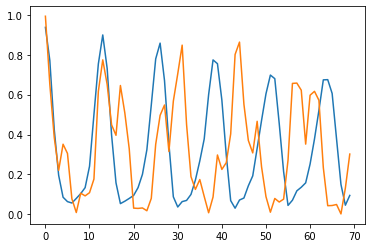

In [1187]:
plt.plot(times, Q[4])
plt.plot(times, [self_kerr_fit(tt, *popt) for tt in times])

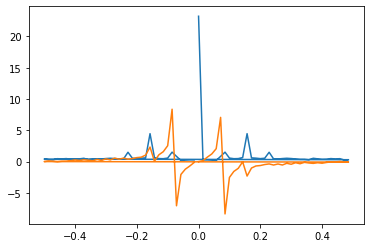

In [1182]:
sp = (np.fft.fft(Q[4]))
freq = np.fft.fftfreq(times.shape[-1])
plt.plot(freq, sp.real, freq, sp.imag)
plt.show()

In [1183]:
freq[np.where(sp.real>2)]

array([ 0.        ,  0.15714286, -0.15714286])

In [234]:
def f(params):
    
    omega_r, kappa = params
    tot = abs(np.exp(-alpha**2)*(sum([(1/scipy.special.factorial(n)) * alpha**(2*n)*exp(-1j*t*(omega_r*n + (kappa/2)*n**2))
                                   for n in arange(50)])))**2

    return Q - tot
    
    

(array([ 13.47081581, -13.56863857]),
 array([[-2.64862790e+22, -1.40296639e+21],
        [-1.40296639e+21, -7.43145045e+19]]))

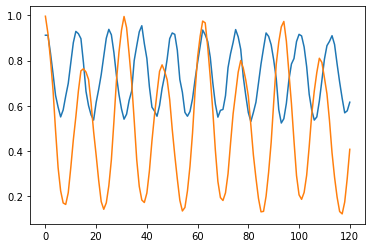

In [235]:
plt.plot(times, Q[0])
plt.plot(times, [self_kerr_fit(t, *popt) for t in times])

In [57]:
def self_kerr_fit(omega_r, kappa, alpha, t, N):
    tot = abs(exp(-alpha**2)*(sum([alpha**(2*n)*exp(-1j*t*(omega_r*n + kappa/2*n**2))/ \
                                   scipy.special.factorial(n) for n in arange(N)])))**2
    return tot

In [954]:
def self_kerr_fit(omega_r, kappa,alpha, t, N):
    tot = abs(exp(-alpha**2)*(sum([alpha**(2*n)*exp(-1j*t*(omega_r*n + kappa/2*n**2))/ \
                                   scipy.special.factorial(n) for n in arange(N)])))**2
    return tot

In [1192]:
def self_kerr_fit(omega_r, kappa,alpha, t, N):
    tot = abs(exp(-alpha**2)*(sum([alpha**(2*n)*exp(-1j*t*2*np.pi*(omega_r*n + kappa/2*n**2))/ \
                                   scipy.special.factorial(n) for n in arange(N)])))**2
    return tot

Klist = np.arange(-2e-3, 2e-3, 0.1e-3)
offset_list = np.arange(0.14, 0.16, 0.002)
P_dat = Q  # / np.mean(P_dat)
residuals = []
ramsey_f = ramsey_freq
for offset in offset_list:
    print(offset)
    for K in Klist:
        ramsey_f -= offset
        P_fit = ([[self_kerr_fit(ramsey_f, K, alpha, tt, 100) for tt in times] for alpha in alphas])
        P_fit = np.array(P_fit)   # / np.mean(P_fit)
        residuals.append(np.sum(np.abs(P_fit - P_dat)))
best_K = Klist[np.argmin(residuals) % len(Klist)]
best_offset = offset_list[np.argmin(residuals) // len(Klist)]
print(np.min(residuals))
print("best K fit: ", best_K / (2*np.pi))
print("best offset fit: ", best_offset)
P_best_fit = ([[self_kerr_fit(2*pi*(ramsey_freq - best_offset), best_K, alpha,tt, 100) for tt in times] for alpha in alphas])
P_best_fit = np.array(P_best_fit)  # / np.mean(P_best_fit)
P_res = P_best_fit - P_dat

0.14
0.14200000000000002
0.14400000000000002
0.14600000000000002
0.14800000000000002
0.15000000000000002
0.15200000000000002
0.15400000000000003
0.15600000000000003
0.15800000000000003
121.42658958217783
best K fit:  0.0002546479089470328
best offset fit:  0.14


In [58]:
best_K = Klist[np.argmin(residuals) % len(Klist)]
print(best_K)

0.13823007675795093


In [59]:
best_K = Klist[np.argmin(residuals) % len(Klist)]
best_offset = offset_list[np.argmin(residuals) // len(Klist)]
print(np.min(residuals))
print("best K fit: ", best_K / (2*np.pi))
print("best offset fit: ", best_offset)
P_best_fit = ([[self_kerr_fit(2*pi*(ramsey_freq - best_offset),best_K,alpha,tt,100) for tt in times] for alpha in alphas])
P_best_fit = np.array(P_best_fit)  # / np.mean(P_best_fit)
P_res = P_best_fit - P_dat

518.8015727334291
best K fit:  0.022000000000000006
best offset fit:  -0.07


No handles with labels found to put in legend.


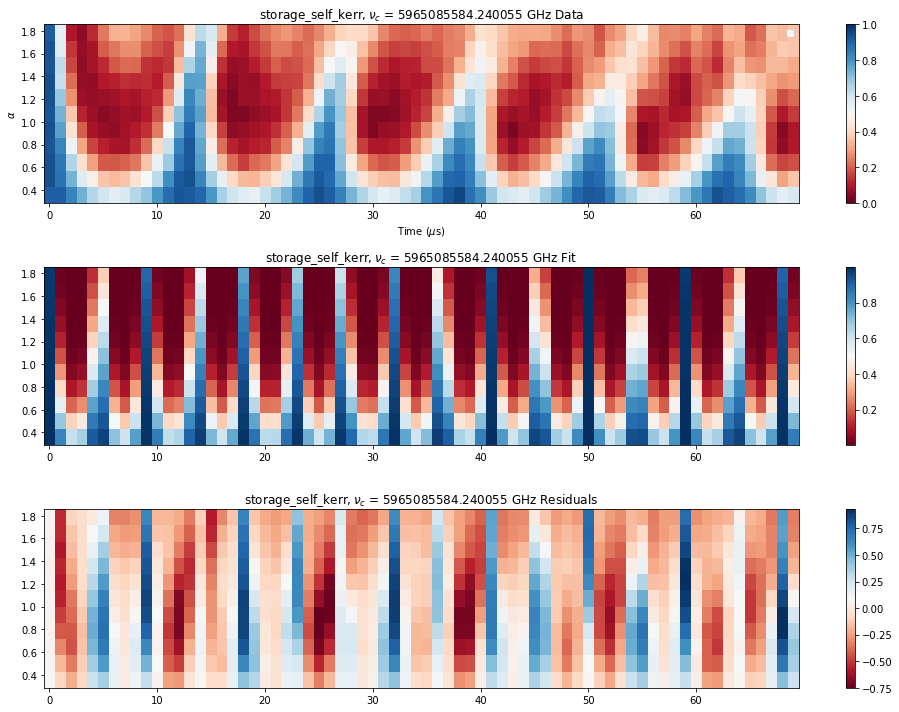

In [1191]:
nu_c = cav_freq
fig = plt.figure(figsize=(14,10))
ax = fig.add_subplot(311,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz Data')

pcolormesh(times, alphas, P_dat, cmap = 'RdBu', shading='auto')
clim(0,1)
colorbar()
ax.set_xlabel('Time ($\mu$s)')
ax.set_ylabel('$\\alpha$')
ax.legend()
ax = fig.add_subplot(312,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz Fit')
pcolormesh(times, alphas, P_best_fit, cmap = 'RdBu', shading='auto')
colorbar()

ax = fig.add_subplot(313,title= expt_name+ '$, \\nu_c$ = '+ str(around(nu_c,6)) + ' GHz Residuals')
pcolormesh(times, alphas, P_res, cmap = 'RdBu', shading='auto')
colorbar()

# for ii,p in enumerate(P):
#     plot(t,p,'-')
# ax.set_xlabel('Time ($\mu$s)')
# ax.set_ylabel('P')
tight_layout()

<ipython-input-169-402941e76e1e>:35: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


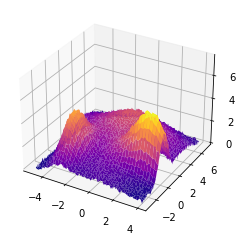

Fitted parameters:
[ 4.36167275e-03  2.02761569e+00  2.52941155e+00  5.38253968e+00
  1.51902413e+00 -1.03967839e+00  4.00123671e+00  5.99016391e+00
  2.48711056e+00  1.78079897e+00 -3.00283111e+00 -4.94792915e-01
 -9.99314311e-01  2.00136644e+00  3.98453638e+00  3.00724143e+00
  5.00459848e-01  2.00345463e+00  9.95182798e-01  5.00071418e+00]
RMS residual = 0.10023297583960586


<ipython-input-169-402941e76e1e>:75: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


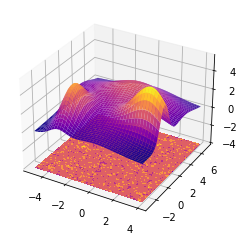

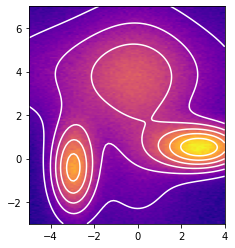

In [169]:
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# The two-dimensional domain of the fit.
xmin, xmax, nx = -5, 4, 75
ymin, ymax, ny = -3, 7, 150
x, y = times, alphas
X, Y = np.meshgrid(x, y)

# Our function to fit is going to be a sum of two-dimensional Gaussians
def gaussian(x, y, x0, y0, xalpha, yalpha, A):
    return A * np.exp( -((x-x0)/xalpha)**2 -((y-y0)/yalpha)**2)


def self_kerr_fit(x, y, omega_r, kappa):
    N = 100
    alpha = y
    t = x
    tot = abs(np.exp(-alpha**2)*(np.sum([alpha**(2*n)*np.exp(-1j*t*(omega_r*n + kappa/2*n**2))/ \
                                   scipy.special.factorial(n) for n in arange(N)])))**2
    return tot


# A list of the Gaussian parameters: x0, y0, xalpha, yalpha, A
gprms = [(0, 2, 2.5, 5.4, 1.5),
         (-1, 4, 6, 2.5, 1.8),
         (-3, -0.5, 1, 2, 4),
         (3, 0.5, 2, 1, 5)
        ]

# Standard deviation of normally-distributed noise to add in generating
# our test function to fit.
noise_sigma = 0.1

# The function to be fit is Z.
Z = np.zeros(X.shape)
for p in gprms:
    Z += gaussian(X, Y, *p)
Z += noise_sigma * np.random.randn(*Z.shape)

# Plot the 3D figure of the fitted function and the residuals.
fig = plt.figure()
ax = fig.gca(projection='3d')
ax.plot_surface(X, Y, Z, cmap='plasma')
ax.set_zlim(0,np.max(Z)+2)
plt.show()

# This is the callable that is passed to curve_fit. M is a (2,N) array
# where N is the total number of data points in Z, which will be ravelled
# to one dimension.
def _gaussian(M, *args):
    x, y = M
    arr = np.zeros(x.shape)
    for i in range(len(args)//5):
       arr += gaussian(x, y, *args[i*5:i*5+5])
    return arr

# Initial guesses to the fit parameters.
guess_prms = [(0, 0, 1, 1, 2),
              (-1.5, 5, 5, 1, 3),
              (-4, -1, 1.5, 1.5, 6),
              (4, 1, 1.5, 1.5, 6.5)
             ]
# Flatten the initial guess parameter list.
p0 = [p for prms in guess_prms for p in prms]

# We need to ravel the meshgrids of X, Y points to a pair of 1-D arrays.
xdata = np.vstack((X.ravel(), Y.ravel()))
# Do the fit, using our custom _gaussian function which understands our
# flattened (ravelled) ordering of the data points.
popt, pcov = curve_fit(_gaussian, xdata, Z.ravel(), p0)
fit = np.zeros(Z.shape)
for i in range(len(popt)//5):
    fit += gaussian(X, Y, *popt[i*5:i*5+5])
print('Fitted parameters:')
print(popt)

rms = np.sqrt(np.mean((Z - fit)**2))
print('RMS residual =', rms)

# Plot the 3D figure of the fitted function and the residuals.
fig = plt.figure()
ax = fig.gca(projection='3d')
ax.plot_surface(X, Y, fit, cmap='plasma')
cset = ax.contourf(X, Y, Z-fit, zdir='z', offset=-4, cmap='plasma')
ax.set_zlim(-4,np.max(fit))
plt.show()

# Plot the test data as a 2D image and the fit as overlaid contours.
fig = plt.figure()
ax = fig.add_subplot(111)
ax.imshow(Z, origin='lower', cmap='plasma',
          extent=(x.min(), x.max(), y.min(), y.max()))
ax.contour(X, Y, fit, colors='w')
plt.show()


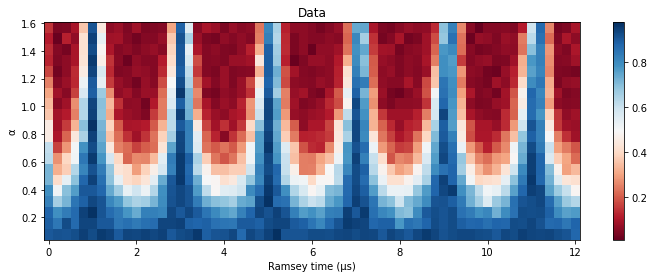

C:\ProgramData\Miniconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


In [222]:
plt.figure(figsize=(12, 4))
ax = plt.pcolormesh(times, alphas, Q, cmap='RdBu', shading='auto')
plt.colorbar(ax)
plt.title('Data')
plt.xlabel('Ramsey time (μs)')
plt.ylabel('α')
plt.show()

def self_kerr_fit(x, y, A, omega_r, kappa):
    N = 100
    tot = A*abs(np.exp(-y**2)*(np.sum([y**(2*n)*np.exp(-1j*x*(omega_r*n + kappa/2*n**2))/ \
                                   scipy.special.factorial(n) for n in arange(N)])))**2
#     print(np.shape(tot))
    return tot

def _fit(M, *args):
    x, y = M
    arr = np.zeros(x.shape)
    for i in range(len(args)//3):
        arr += self_kerr_fit(x, y, *args[i*3:i*3+3])
    return arr
guess_prms = [(1.0, 0.5, 0.04)]

p0 = [p for prms in guess_prms for p in prms]

X, Y = np.meshgrid(times, alphas)

xdata = np.vstack((X.ravel(), Y.ravel()))
popt, pcov = curve_fit(_fit, xdata, Q.ravel(), p0)

In [224]:
popt

array([ 6.59170539e-07,  4.37549752e-01, -1.16943783e-01])

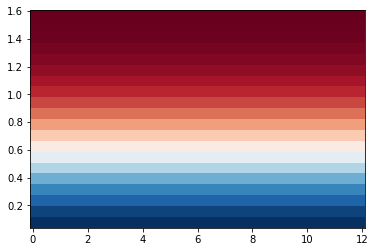

In [227]:
fit = self_kerr_fit(X, Y, *popt)
plt.pcolormesh(times, alphas, fit, cmap='RdBu', shading='auto')

In [ ]:
g = self_kerr_fit(times, alphas, 5e-3, 5e-3)
plt.figure(figsize=(12, 4))
ax = plt.pcolormesh(times, alphas, g, cmap='RdBu', shading='auto')
plt.colorbar(ax)
plt.title('Fit')
plt.xlabel('Ramsey time (μs)')
plt.ylabel('α')
plt.show()
print(np.shape(Q))

In [228]:
len(times)

61

## SNAP Fock prep

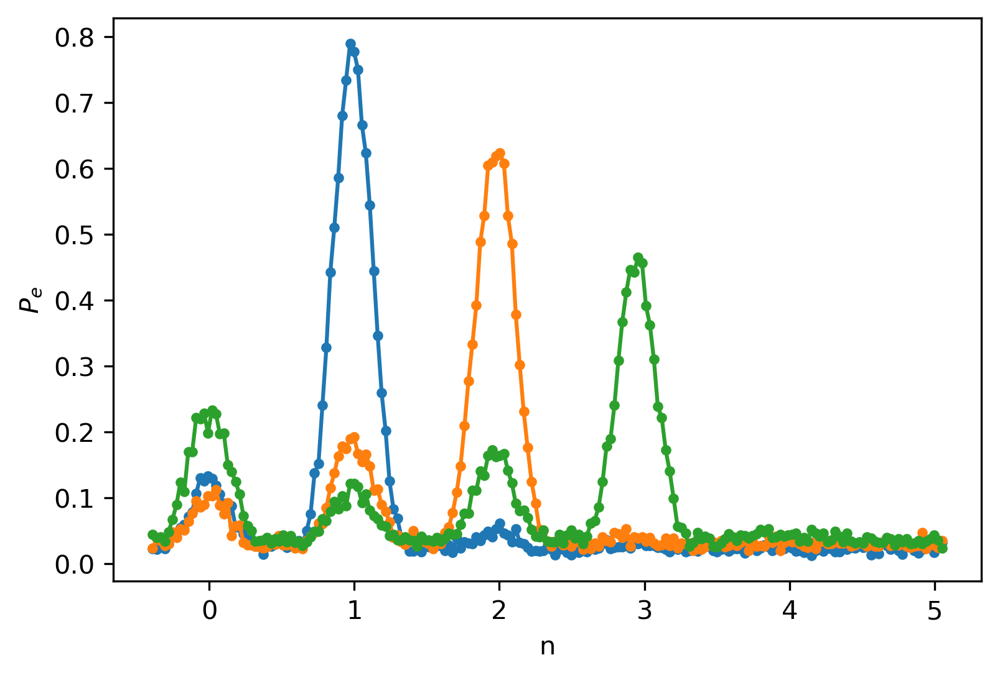

In [256]:
expt_name = 'snap_fock_prep'
filelist = [0, 1, 2]
plt.figure(dpi=300)

p_cav = [[10.75, 55.85, 20.55, 12.85], [22.15, 9.45, 52.55, 15.85], [30.2, 27.5, 11.95, 30.35]]

for ii, i in enumerate(filelist):
    filename = "..\\data\\thesis\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        I = np.array(a['I'])[:]
        Q = np.array(a['Q'])[:]
        two_chi = a['two_chi']
        freqs = (np.array(a['freq'])/1e9)[:]*1e9/two_chi
        a.close()        
        plt.plot(freqs, Q, '.-')
#         plt.plot(np.array(p_cav[ii])/100, 'D')

plt.xlabel('n')
plt.ylabel(r'$P_{e}$')
plt.show()

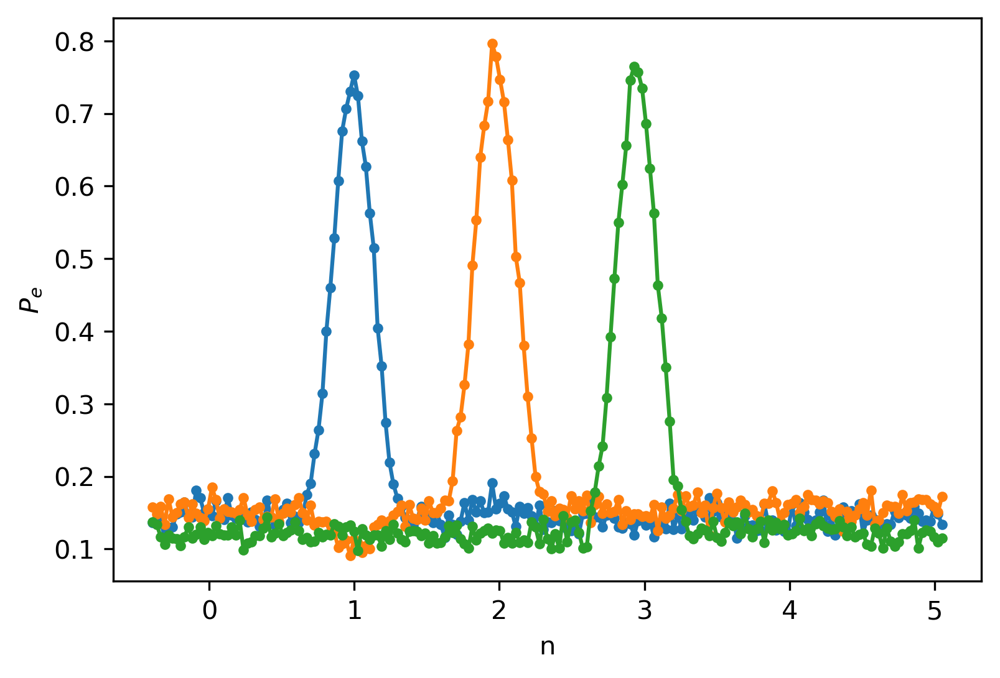

In [1196]:
expt_name = 'fock_state_oct'
filelist = [0, 1, 2]
plt.figure(dpi=300)

p_cav = [[10.75, 55.85, 20.55, 12.85], [22.15, 9.45, 52.55, 15.85], [30.2, 27.5, 11.95, 30.35]]

for ii, i in enumerate(filelist):
    filename = "..\\data\\thesis\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        I = np.array(a['I'])[:]
        Q = np.array(a['Q'])[:]
        two_chi = a['two_chi']
        freqs = (np.array(a['freq'])-93304128)[:]/two_chi
        a.close()        
        plt.plot(freqs, Q, '.-')
#         plt.plot(np.array(p_cav[ii])/100, 'D')

plt.xlabel('n')
plt.ylabel(r'$P_{e}$')
plt.show()

0.86
0.797


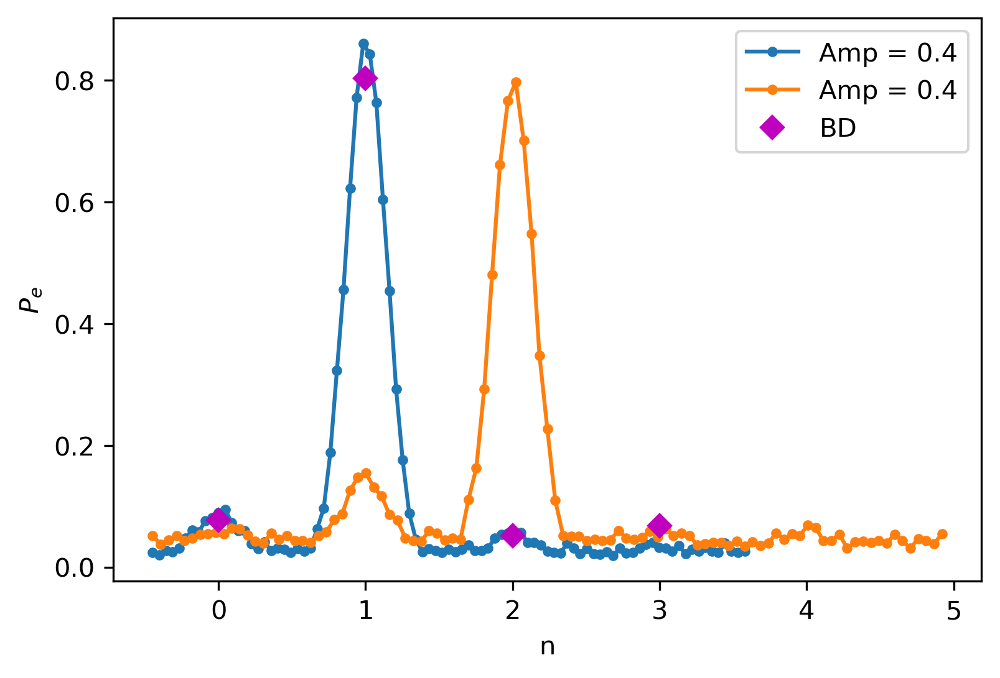

In [215]:
expt_name = 'snap_fock_prep'
filelist = [19, 23]
two_chi = -1.118e6
cal = [0.9205, 0.002]
# 0.9205 0.002
plt.figure(dpi=300)
amp = [0.4, 0.4]
for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        I = np.array(a['I'])[:]
        Q = np.array(a['Q'])[:]
        freqs = (np.array(a['freq'])/1e9)[:]*1e9/two_chi
        a.close()
    plt.plot(freqs, Q, '.-', label='Amp = {}'.format(amp[ii]))
    print(np.max(Q))

plt.plot([0 ,1, 2, 3],np.array([ 1158, 12054,   775,  1013])/15000, 'Dm', label='BD')
plt.xlabel('n')
plt.ylabel(r'$P_{e}$')
plt.legend(loc='best')
plt.show()

0.86
0.797


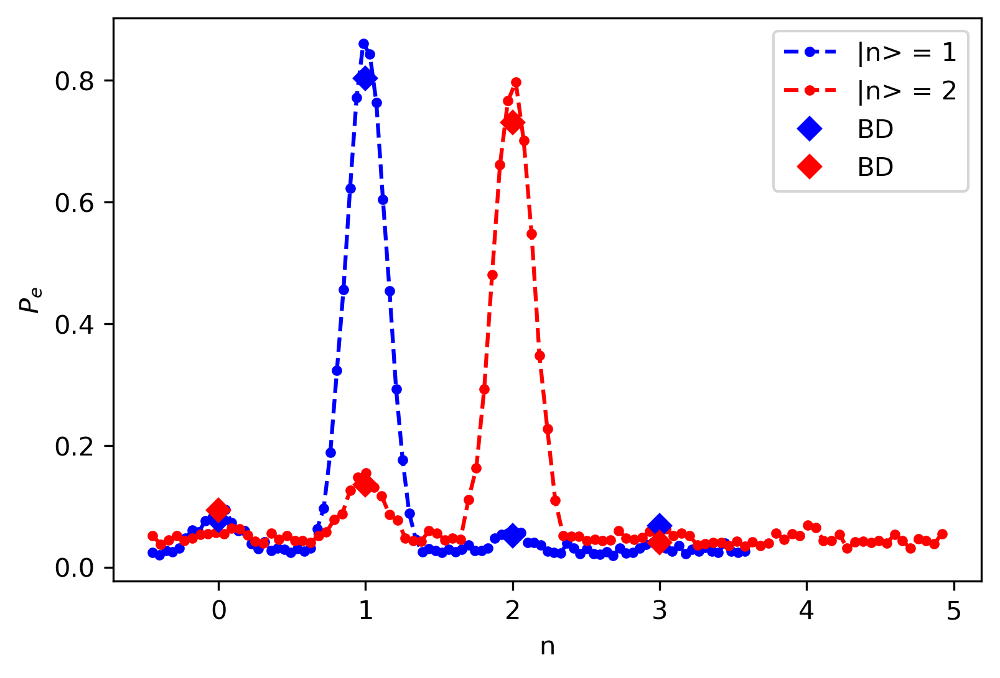

In [37]:
expt_name = 'snap_fock_prep'
filelist = [19, 23]
two_chi = -1.118e6
cal = [0.9205, 0.002]
# 0.9205 0.002
plt.figure(dpi=300)
amp = [1, 2]
color = ['b', 'r']
for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        I = np.array(a['I'])[:]
        Q = np.array(a['Q'])[:]
        freqs = (np.array(a['freq'])/1e9)[:]*1e9/two_chi
        a.close()
    plt.plot(freqs, Q, color = color[ii], marker='.', linestyle='--', label='|n> = {}'.format(amp[ii]))
    print(np.max(Q))

plt.plot([0 ,1, 2, 3],np.array([ 1158, 12054,   775,  1013])/15000, 'Db', label='BD')
plt.plot([0 ,1, 2, 3],np.array([ 0.094, 0.1354,   0.7302,  0.0404]), 'Dr', label='BD')
plt.xlabel('n')
plt.ylabel(r'$P_{e}$')
plt.legend(loc='best')
plt.savefig('2021-06-09-bd_comparison_qubitspec.png', dpi=300, bbox_inches='tight')
plt.show()

In [239]:
np.exp(-3/100) * np.exp(-3/100)

0.9417645335842487

## Comparison of SNAP and OCT

0.9321021184139054
0.8180336773492667
0.9429657794676806
0.8766974470396525


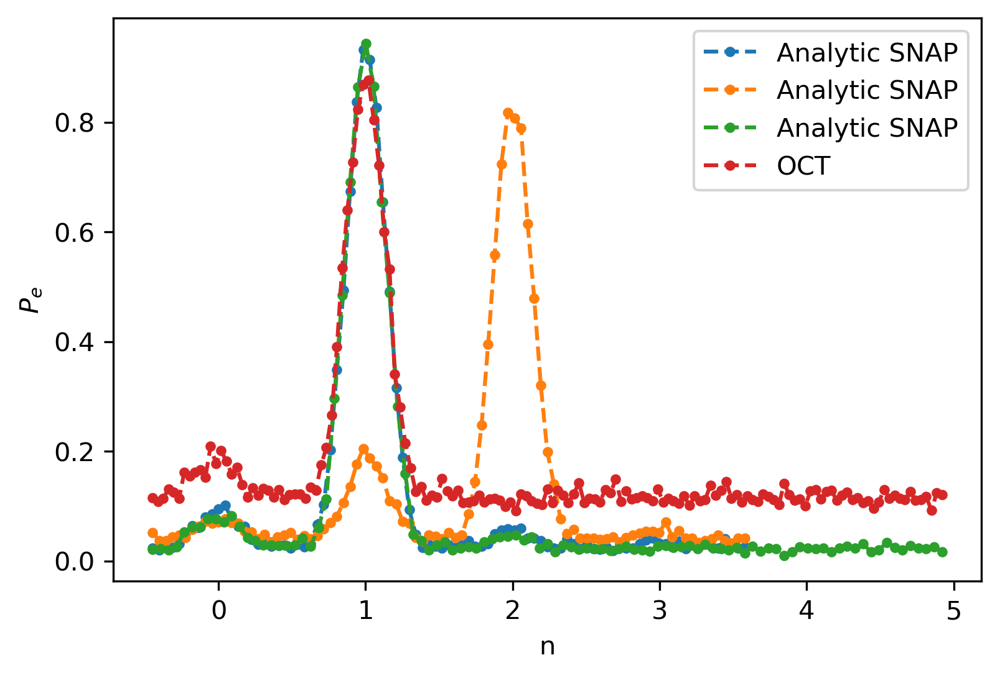

In [28]:
expt_name = 'snap_fock_prep'
filelist = [19, 20, 21]
two_chi = -1.118e6
cal = [0.9205, 0.002]
# 0.9205 0.002
plt.figure(dpi=300)
for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        I = np.array(a['I'])[:]
        Q = np.array(a['Q'])[:]
        freqs = (np.array(a['freq'])/1e9)[:]*1e9/two_chi
        a.close()
    Q = (Q-cal[1])/cal[0]
    plt.plot(freqs, Q, '.--', label='Analytic SNAP')
    print(np.max(Q))

expt_name = 'oct_fock'
filelist = [4]
two_chi = -1.118e6
cal = [0.9205, 0.002]
for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        I = np.array(a['I'])[:]
        Q = np.array(a['Q'])[:]
        freqs = (np.array(a['freq'])/1e9)[:]*1e9/two_chi
        a.close()
    Q = (Q-cal[1])/cal[0]
    plt.plot(freqs, Q, '.--', label='OCT')
    print(np.max(Q))    
    
plt.xlabel('n')
plt.ylabel(r'$P_{e}$')
plt.legend(loc='best')
plt.show()

[0.17975000000000002, 0.765]
1.0


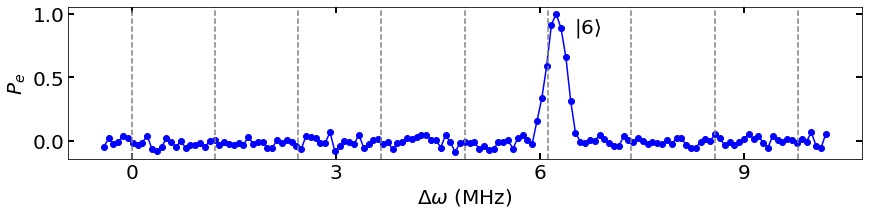

In [853]:
expt_name = 'oct_fock_prep'
filelist = [3]
plt.figure(figsize=(12, 3))
plt.tight_layout()
for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        I = np.array(a['I'])[:]
        Q = np.array(a['Q'])[:]
        two_chi = -np.array(a['two_chi'])/1e6
        freqs = -(np.array(a['freq']))/1e6/two_chi
        a.close()
    cal = [np.mean(Q[:10]), np.max(Q)]
    print(cal)
    Q = (Q-cal[0])/(cal[1]-cal[0])
    plt.plot(freqs, Q, 'bo-')
    print(np.max(Q))    

p1, p2 = fitgausssum_with_baseline(freqs, Q, fitparams=fitparams)

# plt.plot(freqs[::-1], gaussfuncsum_with_baseline(freqs[::-1], *p1), 'r', label='Fit')                   

chi2= -int(27.45e-3/2) 
# chi2=0
for j in range(9):
    plt.axvline(x=j*two_chi + j*(j-1)* chi2, linestyle='--', color='grey')

# plt.xlabel(r'$\left| n \right\rangle$', fontsize=20)
plt.text(6.5, 0.85, r'$\left| 6 \right\rangle$', fontsize=20)
plt.xlabel(r'$\Delta \omega$ (MHz)', fontsize=20)
plt.xticks([0, 3, 6, 9])
plt.ylabel(r'$P_{e}$', fontsize=20)
plt.tight_layout()
plt.tick_params(direction='in', length=6, width=2, colors='k', \
    grid_color='grey', grid_alpha=0.5, labelsize=20, labelbottom=True, right=True, top=True, left=True)
plt.savefig('../figures/n6_oct.png', dpi=300, bbox_inches='tight', transparent=True)

plt.show()

In [809]:
p1[::2]*1e6

array([1.78183097e+02, 2.69378952e+02, 1.47326145e+04, 1.10755931e+04,
       2.29957927e+06, 4.41187813e+04, 5.10005878e+04, 4.02507124e+06,
       1.18993929e+05, 3.32009094e+04, 5.36952408e+06, 9.72625916e+05,
       1.72563147e+05])

## QCTRL Fock prep

0.93
0.87
0.87
0.65


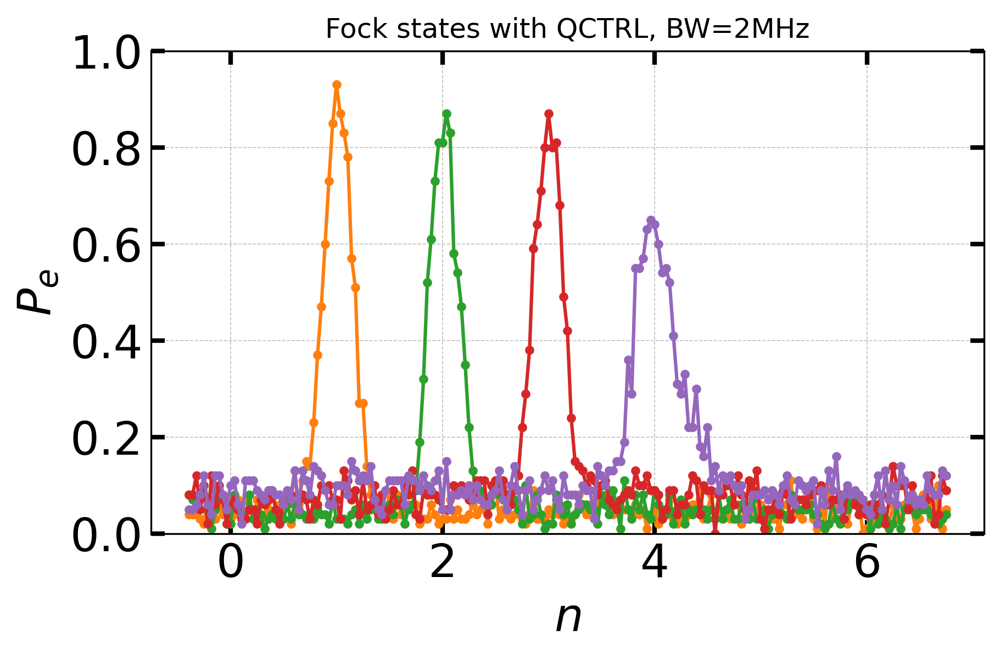

In [1694]:
expt_name = 'qctrl_fock_prep'
filelist = [5, 6, 11, 8]
plt.figure(dpi=300)

cmap  = plt.get_cmap("tab10")
colors = cmap([x for x in np.arange(0.1, 1.1, 0.1)])

for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        I = np.array(a['I'])[:]
        Q = np.array(a['Q'])[:]
        two_chi = np.array(a['two_chi'])
        freqs = np.array(a['freq'])/two_chi
        a.close()        
    plt.plot(freqs, Q, '.-', color=colors[ii])
    print(np.max(Q))
#         fitdata = number_splitting(freqs, Q, n=0)
#         print(fitdata['freq']*two_chi)
        

plt.xlabel('$n$', fontsize=20)
plt.ylabel(r'$P_{e}$', fontsize=20)
plt.grid(True, which='major', axis='both', color='grey', linestyle='--', linewidth=0.4)
plt.ylim(0.0, 1.0)
plt.title('Fock states with QCTRL, BW=2MHz')
plt.tight_layout()
plt.tick_params(direction='in', length=6, width=2, colors='k', \
    grid_color='grey', grid_alpha=0.5, labelsize=20, labelbottom=True, right=True, top=True, left=True)

plt.show()

In [1670]:
print(fitdata['freq'][1])

1.0123378817587187


In [1671]:
1.0123378817587187*two_chi

-1275343.2634396339

## Wigner Tomography

In [869]:
expt_name = 'wigner_tomo_binary_decomp'
filelist = [7]
two_chi = -1.118e6
cal = [0.9575, 0.019]
plt.figure(dpi=300)
# amp = [0.4, 0.35, 0.45]
for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        Q = np.array(a['res'])[:]
        alpha_x = np.array(a['alphax'])[:]
        alpha_y = np.array(a['alphay'])[:]
        a.close()
        
    Q = (Q-cal[1])/cal[0]
        
#         plt.plot(freqs, Q, '.-', label='Amp = {}'.format(amp[ii]))
plt.xlabel('n')
plt.scatter(alpha_x, alpha_y)
plt.ylabel(r'$P_{e}$')
plt.legend(loc='best')
plt.show()

FileNotFoundError: [Errno 2] Unable to open file (unable to open file: name = '..\data\00007_wigner_tomo_binary_decomp.h5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

<Figure size 1800x1200 with 0 Axes>

In [1424]:
from scipy.linalg import expm

import matplotlib .pyplot as plt
import matplotlib .patches as mpatches
import numpy as np
from scipy.special import genlaguerre
from math import sqrt,factorial
from numpy.linalg import cond,svd
from scipy.optimize import fmin,check_grad,minimize
from IPython.display import display,clear_output
import time

Nmax = 100 # for numerical definition of displacement operator before exponentiation

class gen_wigner_tomography_analysis:
    
    def __init__(self,alphas,mode_state_num = 5,theta = pi,analytic=False):       
        self.alphas = alphas
        self.m = mode_state_num
        self.I  = (np.diag((1+0j)*ones(self.m), 0))
        self.Par =  (np.diag(np.exp(1j*pi*(np.arange(0, self.m))), 0))
        self.analytic = analytic
        self.theta = theta

    def Phase_op(self,theta):
        return ((np.diag(cos(theta*(np.arange(0, self.m))), 0)))
    
    def D(self,beta):
        M_m = np.diag(np.sqrt(np.arange(1, 100)), 1)
        M_p = np.diag(np.sqrt(np.arange(1, 100)), -1)
        return (expm(beta*M_p - conj(beta)*M_m))[:self.m,:self.m]

    def W_op(self,alpha):
        analytic = self.analytic
        if analytic:
            w = np.zeros((self.m,self.m),dtype=complex)
            B = 4*abs(alpha)**2
            pf = (2/np.pi)*np.exp(-B/2.0)
            for m in range(self.m):
                x = pf*real((-1)**m*genlaguerre(m, 0)(B))
                # x = pf*((-1)**m*genlaguerre(m, 0)(B))
                w[m, m] = x
                for n in range(m+1, self.m):
                    pf_nm = sqrt(factorial(m)/float(factorial(n)))
                    x = pf * pf_nm * (-1)**m * 2 * (2*alpha)**(n-m-1)*genlaguerre(m, n-m)(B)
                    if m > 0:
                        y = 8 * pf * pf_nm * (-1)**(m-1)*(2*alpha)**(n-m) *genlaguerre (m-1,n-m+1)(B)
                    w[m, n] = alpha * x
                    w[n, m] = (alpha * x). conj ()          
        else:  w  = 2/pi*dot(self.D(alpha),dot(self.Par,self.D(-alpha)))      
        return w
        
    def gen_W_op(self,theta,alpha):
        w  = 2/pi*dot(self.D(alpha),dot(self.Phase_op(theta),self.D(-alpha)))      
        return w
    
    def wigner_mat_and_grad(self,disps,FD,reshape=True):
        ND = len(disps)
        wig_tens = np.zeros((ND,FD,FD),dtype=complex)
        grad_mat_r = np.zeros((ND,FD,FD),dtype=complex)
        grad_mat_i = np.zeros((ND,FD,FD),dtype=complex)

        B = 4*abs(disps)**2
        pf = (2/np.pi)*np.exp(-B/2.0)
        for m in range(FD):
            x = pf*np.real((-1)**m*genlaguerre(m, 0)(B))
            term_r = -4*disps.real*x
            term_i = -4*disps.imag*x
            if m > 0:
                y = 8*pf*(-1)**(m-1)*genlaguerre(m-1, 1)(B)
                term_r += disps.real * y
                term_i += disps.imag * y
            wig_tens[:, m, m] = x
            grad_mat_r[:, m, m] = term_r
            grad_mat_i[:, m, m] = term_i

            for n in range(m+1, FD):
                pf_nm = sqrt( factorial (m)/float( factorial (n)))
                x = pf * pf_nm * (-1)**m * 2 * (2*disps)**(n-m-1) * genlaguerre (m, n-m)(B)
                term_r = ((n - m) - 4*disps.real*disps)*x
                term_i = (1j * (n - m) - 4*disps.imag*disps) * x
                if m > 0:
                    y = 8 * pf * pf_nm * (-1)**(m-1)*(2*disps)**(n-m) *genlaguerre (m-1, n-m+1)(B)
                    term_r += disps.real * y
                    term_i += disps.imag * y

                wig_tens [:, n, m] = disps * x
                wig_tens [:, m, n] = (disps * x). conj ()
                grad_mat_r [:, n, m] = term_r
                grad_mat_r [:, m,n] = term_r . conjugate ()
                grad_mat_i [:, n,m] = term_i
                grad_mat_i [:, m,n] = term_i . conjugate ()
        if reshape:return (wig_tens .reshape ((ND , FD**2)),grad_mat_r .reshape ((ND , FD**2)),grad_mat_i .reshape ((ND , FD**2)))
        else:return (wig_tens,grad_mat_r,grad_mat_i)


    def curlyM(self):
        analytic=self.analytic
        if analytic:
            if self.theta ==pi:
                curlyM, gcurlyMx, gcurlyMy = self.wigner_mat_and_grad(self.alphas,self.m,reshape=True)
            else:print("No analytic expression for arb theta")
        else:
            M_mat = array([self.gen_W_op(self.theta,alpha) for alpha in self.alphas])
            curlyM = array([transpose(m).flatten() for m in M_mat])
        return curlyM

    def curlyMinv(self):
        curlyM_inv = linalg.pinv(self.curlyM())
        
        return curlyM_inv
    
    def rho_pinv(self,w_vec):
        self.x = w_vec
        curlyM_inv = linalg.pinv(self.curlyM())
        rho_vec = dot(curlyM_inv,self.x)
        rho = rho_vec.reshape(self.m,self.m)
        return rho
    
    def rho_pinv2(self,w_vec):
        self.x = w_vec
        curlyM_inv2 = dot(pinv(dot((transpose(self.curlyM())),self.curlyM())),(transpose(self.curlyM())))
        rho_vec = dot(curlyM_inv2,self.x)
        rho = rho_vec.reshape(self.m,self.m)
        return rho
    
    
    def extracted_W(self,rho,alphaxs,alphays):
        return array([[trace(dot(self.W_op(alphax + 1j*alphay),rho)) 
                            for alphax in alphaxs] for alphay in alphays])
    
    
    def extracted_W_single(self,rho,alpha):
        return trace(dot(self.W_op(alpha),rho))

    
    def expect_gen_W(self,theta,rho,alphaxs,alphays):
        return array([[trace(dot(self.gen_W_op(theta,alphax + 1j*alphay),rho)) 
                            for alphax in alphaxs] for alphay in alphays])
    
    def expect_gen_W_single(self,theta,rho,alpha):
        return trace(dot(self.gen_W_op(theta,alpha),rho))
    
    
    def extracted_W_single_analytic(self,rho,disps,FD):
        W,gWx,gWy = self.wigner_mat_and_grad(disps,FD,reshape=False)
        
        return array([trace(dot(w,rho)) for w in W])
        
    def rho_pinv_trace_1(self,w_vec):

        rho = np.zeros((self.m,self.m),dtype=complex)
        self.x = w_vec
        i_vec = self.I.flatten()
        
        A = zeros([self.m**2+1, self.m**2+1],dtype=complex)
        A[:self.m**2,:self.m**2] = dot((transpose(self.curlyM())),self.curlyM())
        A[self.m**2,self.m**2], A[self.m**2][:self.m**2], A.T[self.m**2][:self.m**2] = 0,i_vec,i_vec
        vec_b = ones([self.m**2+1],dtype=complex)

        vec_b[:self.m**2] = dot(transpose(self.curlyM()),w_vec)
        rho_vec = dot(pinv(A),vec_b)[:self.m**2]
        rho = rho_vec.reshape(self.m,self.m)
        return (rho)

    def rho_pinv_positive_sd(self,w_vec):

        rho = self.rho_pinv_trace_1(w_vec)
        l,v = eig(rho)
        ls_index = sorted(range(len(l)), key=lambda k: l[k],reverse=True)
        ls = sorted(l,reverse=True)
        lps = self.positive_semidefinite_eigs(ls)
        vs = array([v.T[i] for i in ls_index]).T
        rho_new = dot((array(vs)),dot(diag(lps,0),array(vs).T.conj()))
        return (rho_new)   
    
    def positive_semidefinite_eigs(self,vs):
        a = 0
        d = len(vs)
        vout = array(zeros(d))
        vout = vs
        for i in sorted(range(d),reverse=True):
            if (vs[i] +a/(i+1) < 0):
                a = a + vs[i]
                vout[i] = 0
            else:break
#         try:vout[:i+1] = vs[:i+1] + a/(i+1)
#         except:print ("positive semidefinite errors")
            
        if i!= d-1:
            vout[:i+1] = vs[:i+1] + a/(i+1)
#         except:print ("positive semidefinite errors")
                
        return(vout)
    
print("done")

done


## OCT

No handles with labels found to put in legend.


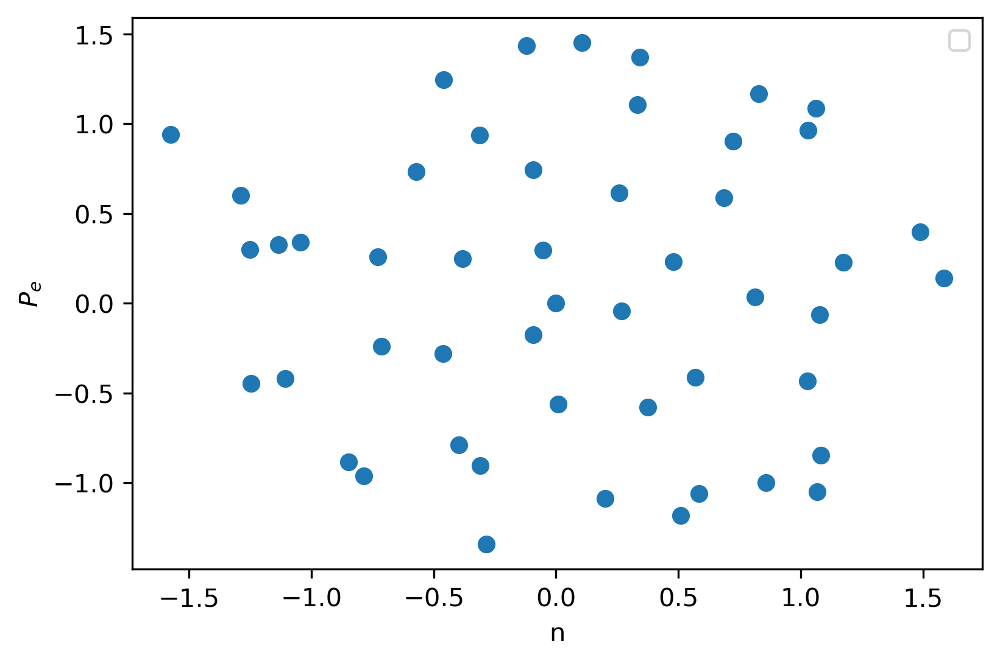

In [1495]:
expt_name = 'wigner_tomo_oct'
filelist = [5]
plt.figure(dpi=300)
for ii, i in enumerate(filelist):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:

        Q = np.array(a['res'])[:]
        alpha_x = np.array(a['alphax'])[:]
        alpha_y = np.array(a['alphay'])[:]
        a.close()
        
        
plt.xlabel('n')
plt.scatter(alpha_x, alpha_y)
plt.ylabel(r'$P_{e}$')
plt.legend(loc='best')
plt.show()

50
50 50
Trace =  (1.0000000000000027-6.357667969731792e-17j)
0 population: 0.286 
1 population: 0.181 
2 population: 0.344 
3 population: 0.131 
4 population: 0.059 
sum 0 + 1:  (0.4665739183229423-5.591433065271948e-17j)


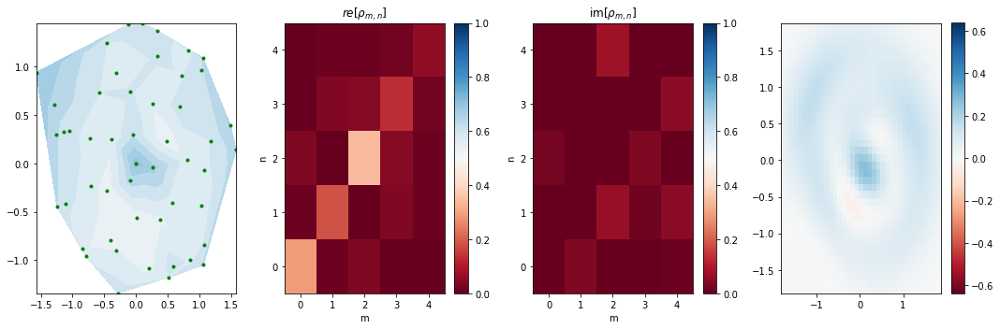

In [1520]:
expt_name = 'wigner_tomo_oct'
filelist = [7]
mode_state_num = 5

one_pops_snap = []

for ii,i in enumerate(filelist[:]):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        
        Ps = np.array(a['res'])
        Ws = -2/np.pi*(2*Ps-1)
        x = np.array(a['alphax'])[:]
        y = np.array(a['alphay'])[:]

    alphas = x+1j*y

    print(len(Ps))

    alphas2 = arange(-np.sqrt(7)/np.sqrt(2)+0.1, np.sqrt(7)/np.sqrt(2), 0.1)

    w = gen_wigner_tomography_analysis(alphas, mode_state_num=mode_state_num,analytic=True)

    fig1 = plt.figure(figsize=(15,5))

    W = Ws 
    print(len(alphas), len(W))

    ax1 = fig1.add_subplot(141)

    tcf = ax1.tricontourf(x, y, W, np.linspace(-2/np.pi, 2/np.pi, 30), cmap='RdBu')
    ax1.plot(x, y, 'g. ')
    r = sqrt(6)
    th = linspace(-3.14, 3.14, 100)

    rho = w.rho_pinv_positive_sd(W)
    print ("Trace = ",trace(rho))
    for ll in range(mode_state_num):
        print("%.i population: %.3f "%(ll, np.real(rho[ll][ll])))

    print("sum 0 + 1: ", rho[0][0] + rho[1][1])

    ax2 = fig1.add_subplot(142,title ='$re[\\rho_{m,n}$]')
    c = ax2.pcolormesh(arange(mode_state_num), arange(mode_state_num), real(rho),cmap = 'RdBu',vmin = 0,vmax = 1, shading='nearest')   
    ax2.set_ylabel('n')
    ax2.set_xlabel('m')
    fig1.colorbar(c,ax=ax2)
    ax2 = fig1.add_subplot(143,title ='im[$\\rho_{m,n}$]')
    c = ax2.pcolormesh(arange(mode_state_num),arange(mode_state_num),imag(rho),cmap = 'RdBu',vmin = 0, vmax = 1, shading='nearest')   
    ax2.set_ylabel('n')
    ax2.set_xlabel('m')
    fig1.colorbar(c,ax=ax2)
    ax3 = fig1.add_subplot(144)
    c = ax3.pcolormesh(alphas2,alphas2,real(w.extracted_W(rho,alphas2,alphas2)),cmap = 'RdBu',vmin = -2/np.pi,vmax = 2/np.pi, shading='nearest')
    th = linspace(-3.14, 3.14, 100)
    ax3.set_ylim
    fig1.colorbar(c, ax=ax3)

    fig1.tight_layout()

## SNAP

50
50 50
Trace =  (1.0000000000000013+8.889045938119514e-17j)
0 population: 0.328 
1 population: 0.167 
2 population: 0.317 
3 population: 0.162 
4 population: 0.025 
sum 0 + 1:  (0.4957362948864358+4.507356369265923e-17j)


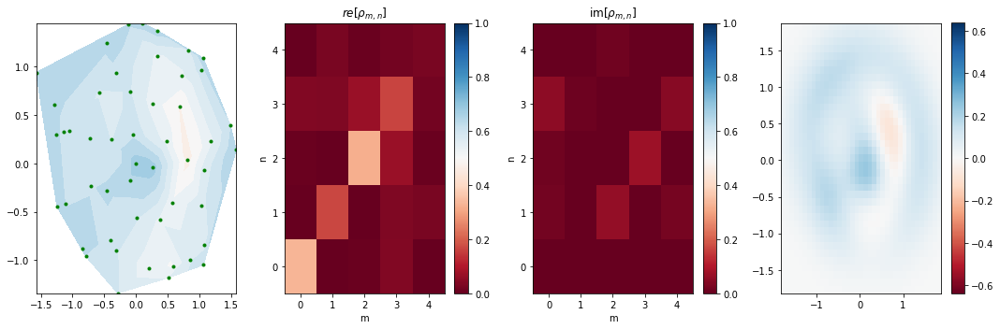

In [1542]:
expt_name = 'wigner_tomo_snap'
filelist = [1]
mode_state_num = 5

one_pops_snap = []

for ii,i in enumerate(filelist[:]):
    filename = "..\\data\\" + str(i).zfill(5) + "_"+expt_name.lower()+".h5"

    with File(filename,'r') as a:
        
        Ps = np.array(a['res'])
        Ws = -2/np.pi*(2*Ps-1)
        x = np.array(a['alphax'])[:]
        y = np.array(a['alphay'])[:]

    alphas = x+1j*y

    print(len(Ps))

    alphas2 = arange(-np.sqrt(7)/np.sqrt(2)+0.1, np.sqrt(7)/np.sqrt(2), 0.1)

    w = gen_wigner_tomography_analysis(alphas, mode_state_num=mode_state_num,analytic=True)

    fig1 = plt.figure(figsize=(15,5))

    W = Ws 
    print(len(alphas), len(W))

    ax1 = fig1.add_subplot(141)

    tcf = ax1.tricontourf(x, y, W, np.linspace(-2/np.pi, 2/np.pi, 30), cmap='RdBu')
    ax1.plot(x, y, 'g. ')
    r = sqrt(6)
    th = linspace(-3.14, 3.14, 100)

    rho = w.rho_pinv_positive_sd(W)
    print ("Trace = ",trace(rho))
    for ll in range(mode_state_num):
        print("%.i population: %.3f "%(ll, np.real(rho[ll][ll])))

    print("sum 0 + 1: ", rho[0][0] + rho[1][1])

    ax2 = fig1.add_subplot(142,title ='$re[\\rho_{m,n}$]')
    c = ax2.pcolormesh(arange(mode_state_num), arange(mode_state_num), real(rho),cmap = 'RdBu',vmin = 0,vmax = 1, shading='nearest')   
    ax2.set_ylabel('n')
    ax2.set_xlabel('m')
    fig1.colorbar(c,ax=ax2)
    ax2 = fig1.add_subplot(143,title ='im[$\\rho_{m,n}$]')
    c = ax2.pcolormesh(arange(mode_state_num),arange(mode_state_num),imag(rho),cmap = 'RdBu',vmin = 0, vmax = 1, shading='nearest')   
    ax2.set_ylabel('n')
    ax2.set_xlabel('m')
    fig1.colorbar(c,ax=ax2)
    ax3 = fig1.add_subplot(144)
    c = ax3.pcolormesh(alphas2,alphas2,real(w.extracted_W(rho,alphas2,alphas2)),cmap = 'RdBu',vmin = -2/np.pi,vmax = 2/np.pi, shading='nearest')
    th = linspace(-3.14, 3.14, 100)
    ax3.set_ylim
    fig1.colorbar(c, ax=ax3)

    fig1.tight_layout()